In [1]:
import pandas as pd
import numpy as np
import missingno as msno
from matplotlib import pyplot as plt
from matplotlib import patches as mpatches
import sys
sys.path.insert(1, '../Scripts')
from funciones import simbologia, MissingMechanism

# Load data

As the database compiles information from existing bibliography, some of the numerical features, in particular geochemical composition have non numerical values. For example, when the amount of an element contained in a sample is below than the detection limit of the measuring technique the values is "bdl", other possible values are "not determined", "not analyzed", "<1", etc. To analyze the data set these values are replaced by 'nan'.


### Labeled data

Labeled data corresponds to the information where samples are interpreted to derived from an especific volcano and/or a especific eruption from that volcano. The samples that have been measured for geochemistry and/or radiocarbon but still is unclear which volcano or eruption they come from, are labeled "Unknown".

In [54]:
Data = pd.read_excel("../Data/TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.1',np.nan);Data = Data.replace('n.a.',np.nan)
Data = Data.drop(['SampleID','SamplePoint','2SE','87Sr/86Sr','TipoDeSeccion','Latitud','Longitud','CodigoLaboratorioRadiocarbono','Comentarios','Mapa?','Flag','DescripcionFlag','ErrorEdad'], axis=1)
#Data = Data[Data.Volcan != 'Unknown']

In [57]:
print(Data.Ho.value_counts())

1.400000    18
0.800000    17
0.700000    16
1.810000     9
2.290000     9
            ..
0.639997     1
1.165240     1
0.573706     1
0.584000     1
0.909778     1
Name: Ho, Length: 2580, dtype: int64


In [55]:
for i in range(0,len(Data.Ho)):
    if (type(Data.Ho[i])!=int)&(type(Data.Ho[i])!=float):
        print(Data.Ho[i])

#### check missing data

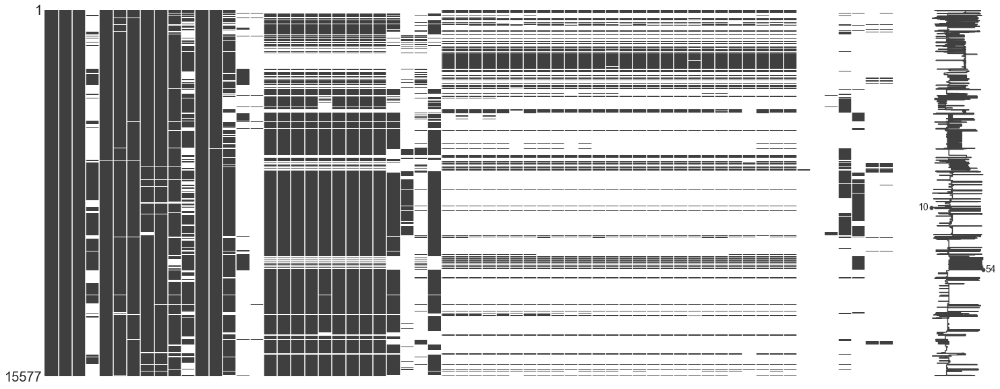

In [59]:
msno.matrix(Data)

### Unlabeled data

In [62]:
Data = pd.read_excel("../Data/TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.1',np.nan)
Data = Data.drop(['2SE','87Sr/86Sr','CodigoLaboratorioRadiocarbono','ErrorEdad'], axis=1)
Data = Data[Data.Volcan == 'Unknown']

#### check missing data

In [ ]:
msno.matrix(Data)

## Check Label balance

#### Volcanoes

In [63]:
Data = pd.read_excel("../Data/TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.1',np.nan)
Data = Data.replace(np.nan,-1)
Data = Data[Data.Volcan != 'Unknown']
#Data = Data[(Data.La != -1)&(Data.Nb != -1)&(Data.Yb != -1)&(Data.Zr != -1)]
print('Volcanes diferentes:  {}'.format(Data['Volcan'].unique().size))
print('Eventos diferentes: {}'.format(Data['Evento'].unique().size))
print('Referencias diferentes: {}'.format(Data['Referencia'].unique().size))
print(" ")
print("Número de Eventos diferentes por volcán")
print(" ")
print(" ")
for i in Data['Volcan'].unique():
    print('\033[1m'+ 'Volcán '+ i+ '\033[0m')
    print(Data['Evento'][Data['Volcan']==i].value_counts())
    print(Data[Data['Volcan']==i].MaterialMedido.value_counts())
    print(Data[Data['Volcan']==i].Referencia.unique())
    print(" ")

Volcanes diferentes:  30
Eventos diferentes: 132
Referencias diferentes: 72
 
Número de Eventos diferentes por volcán
 
 
Volcán Aguilera
A1    20
Name: Evento, dtype: int64
Bulk Tephra           14
Glass shards           5
Oganic macrofossil     1
Name: MaterialMedido, dtype: int64
['Stern, 2008' 'Kilian et al., 2003']
 
Volcán Antillanca-Casablanca
Playas Blanca-Negra    116
NahuelHuapi             72
Rayhuen                 20
Unknown                  6
Name: Evento, dtype: int64
Glass shards    192
Bulk Tephra      13
Charcoal          8
Whole rock        1
Name: MaterialMedido, dtype: int64
['Naranjo et al., 2017' 'Fontijn et al., 2016' 'Singer et al., 2008'
 'Geoffroy et al., 2018' 'Rawson et al., 2016'
 'Lara et al., 2006bb; Singer et al., 2008; Naranjo et al., 2017'
 'Lara et al., 2006b; Singer et al., 2008; Naranjo et al., 2017'
 'Singer et al., 2008; Naranjo et al., 2017' 'Jacques et al., 2014']
 
Volcán Apagado
Ap1    46
Name: Evento, dtype: int64
Glass shards           26
B

#### Eruptive Events

In [64]:
print("Number of eruptive events (tephras) included in the database: {} ".format(Data.Evento.unique().shape[0]))
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(Data[Data.Volcan != 'Unknown'].Evento.value_counts())

Number of eruptive events (tephras) included in the database: 132 
Unknown                3353
PCC2011                 701
Vcha-2008               681
Cha1                    601
Neltume                 536
Puesco                  493
Mil Hojas               416
Enco                    399
Lepué                   374
La Junta                366
Pucón                   290
Arauco                  289
Pirehueico              270
Llaima Pumice           244
Ranco                   242
Huilo                   216
MC12                    188
1852 Llaima             186
Hua-hum                 181
Grande                  152
Vilcún                  148
Riñihue                 131
Achen                   128
Pumalín                 122
H1                      120
PCC2                    117
Playas Blanca-Negra     116
Quet1                   114
HW3                     110
HW6                     104
Quet5                    98
MC3                      88
Quet3                    86
Santa Ana

In [65]:
print(Data.Volcan.value_counts())

Mocho-Choshuenco         2692
Chaitén                  2402
Puyehue-Cordón Caulle    1902
Llaima                   1479
Quetrupillán             1191
Villarrica                871
Hudson                    841
Melimoyu                  464
Michinmahuida             430
Antillanca-Casablanca     214
Calbuco                   179
Huanquihue Group          176
Burney                    174
Carrán-Los Venados        162
Caburga-Huelemolle        135
Mentolat                  121
Osorno                    102
Lanín                     100
Reclus                     96
Sollipulli                 75
Apagado                    46
Yate                       33
Maca                       23
Subsidiary Vcha dome       21
Aguilera                   20
Hornopirén                 18
Cay                        17
Huequi                     11
Corcovado                   7
Yanteles                    6
Name: Volcan, dtype: int64


### Label balance by volcano and event

In [66]:
print('Volcanes diferentes:  {}'.format(Data['Volcan'].unique().size))
print('Eventos diferentes: {}'.format(Data['Evento'].unique().size))
print(" ")
print("Número de Eventos diferentes por volcán")
print(" ")
print(" ")
for i in Data['Volcan'].unique():
    print('\033[1m'+ 'Volcán '+ i+ '\033[0m')
    print(Data['Evento'][Data['Volcan']==i].value_counts())
    print(Data[Data['Volcan']==i].MaterialMedido.value_counts())
    
    print(" ")

Volcanes diferentes:  30
Eventos diferentes: 132
 
Número de Eventos diferentes por volcán
 
 
Volcán Aguilera
A1    20
Name: Evento, dtype: int64
Bulk Tephra           14
Glass shards           5
Oganic macrofossil     1
Name: MaterialMedido, dtype: int64
 
Volcán Antillanca-Casablanca
Playas Blanca-Negra    116
NahuelHuapi             72
Rayhuen                 20
Unknown                  6
Name: Evento, dtype: int64
Glass shards    192
Bulk Tephra      13
Charcoal          8
Whole rock        1
Name: MaterialMedido, dtype: int64
 
Volcán Apagado
Ap1    46
Name: Evento, dtype: int64
Glass shards           26
Bulk Tephra            16
Organic macrofossil     2
Organic mud             1
Charcoal                1
Name: MaterialMedido, dtype: int64
 
Volcán Burney
MB2        76
MB1        59
Unknown    24
MB1910     15
Name: Evento, dtype: int64
Glass shards           140
Bulk Tephra             14
Organic macrofossil     10
-1                       6
Soil Organic matter      3
Charcoal 

### Distribution data, color by volcano
Here we can observe not only the distribution of the data in the data base by feature, but also observe the inbalance of the available information by volcano. This is especially visible in trace elements, wheree volcán Chaitén has 10 times the data of other volcanoes.

 
Magnitud
Volcán without information Aguilera
Volcán without information Burney
Volcán without information Caburga-Huelemolle
Volcán without information Carrán-Los Venados
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Hornopirén
Volcán without information Huanquihue Group
Volcán without information Huequi
Volcán without information Maca
Volcán without information Melimoyu
Volcán without information Subsidiary Vcha dome
Volcán without information Osorno
Volcán without information Lanín
Volcán without information Yanteles
Volcán without information Yate


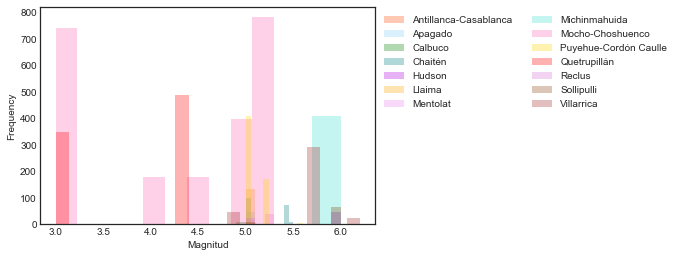

 
Edad
Volcán without information Caburga-Huelemolle
Volcán without information Cay
Volcán without information Huanquihue Group
Volcán without information Huequi
Volcán without information Subsidiary Vcha dome


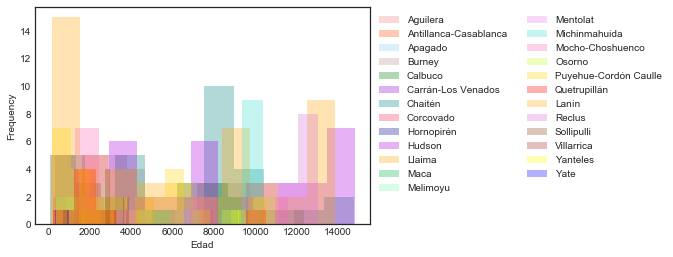

 
SiO2


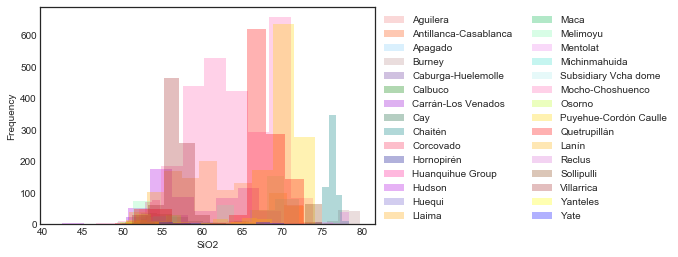

 
TiO2


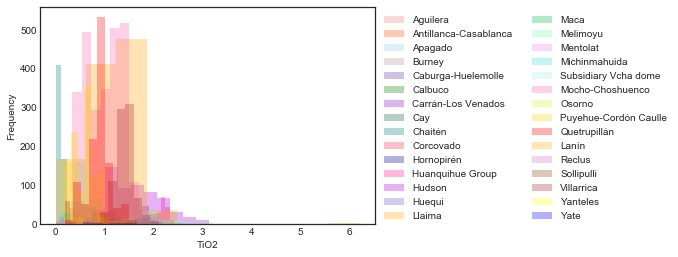

 
Al2O3


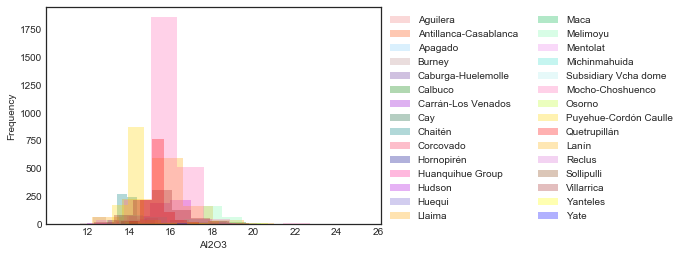

 
FeO


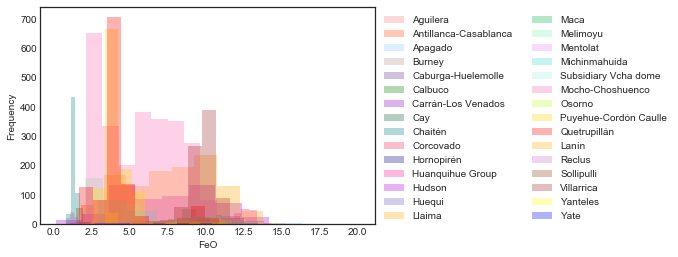

 
MnO


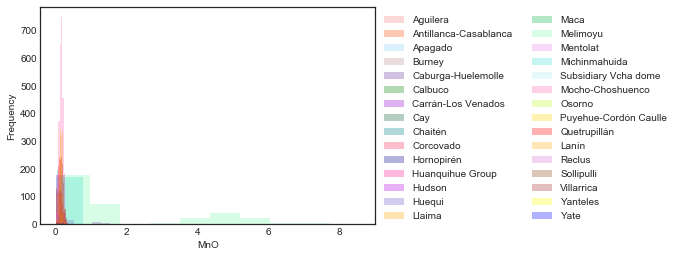

 
MgO


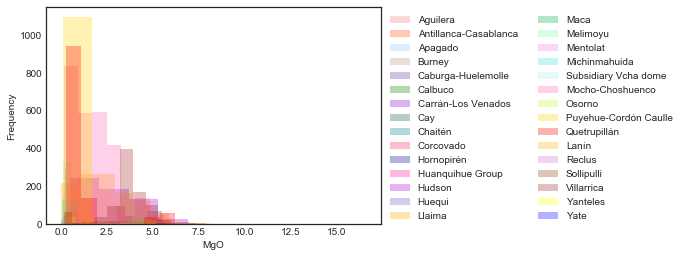

 
CaO


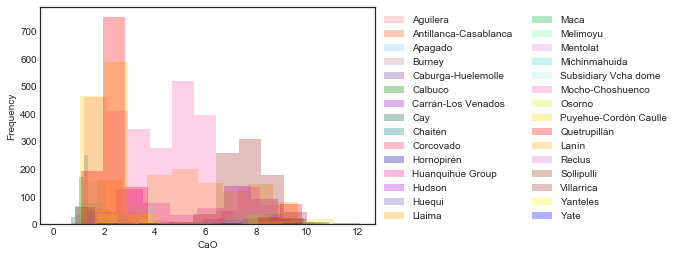

 
Na2O


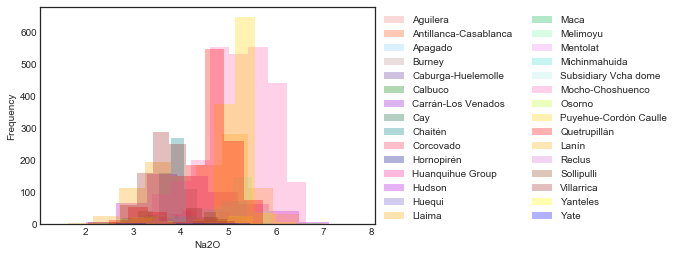

 
K2O


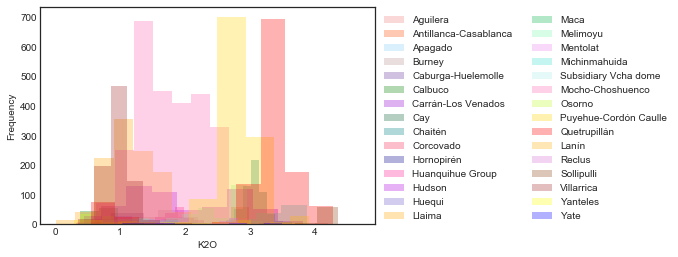

 
P2O5
Volcán without information Subsidiary Vcha dome


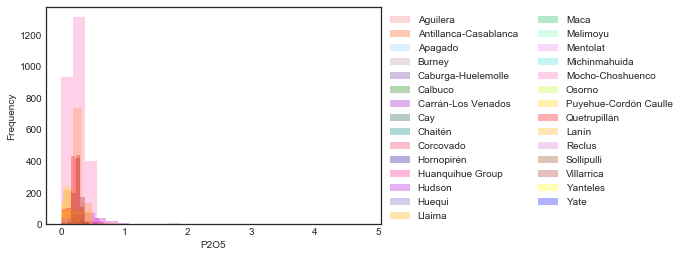

 
Cl
Volcán without information Aguilera
Volcán without information Antillanca-Casablanca
Volcán without information Apagado
Volcán without information Burney
Volcán without information Caburga-Huelemolle
Volcán without information Calbuco
Volcán without information Carrán-Los Venados
Volcán without information Cay
Volcán without information Corcovado
Volcán without information Hornopirén
Volcán without information Huanquihue Group
Volcán without information Hudson
Volcán without information Huequi
Volcán without information Llaima
Volcán without information Maca
Volcán without information Mentolat
Volcán without information Osorno
Volcán without information Puyehue-Cordón Caulle
Volcán without information Quetrupillán
Volcán without information Lanín
Volcán without information Reclus
Volcán without information Sollipulli
Volcán without information Yanteles
Volcán without information Yate


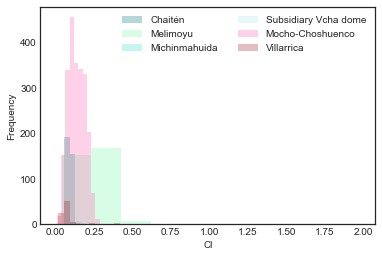

 
LOI
Volcán without information Reclus
Volcán without information Sollipulli


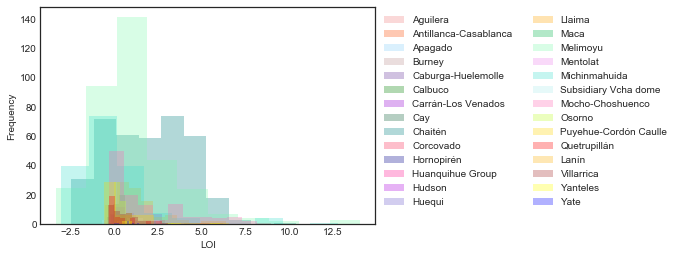

 
Total
Volcán without information Reclus


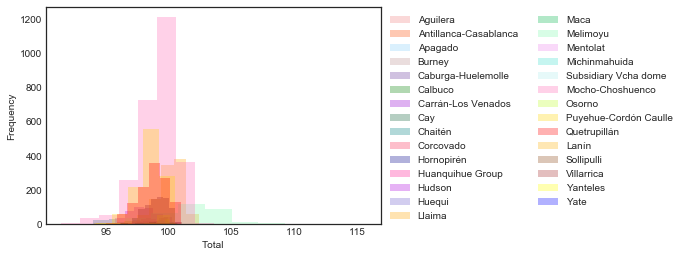

 
Rb
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


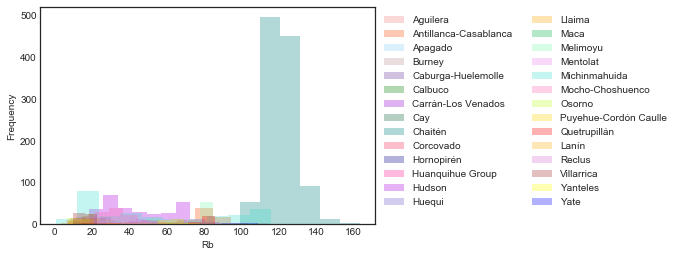

 
Sr
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


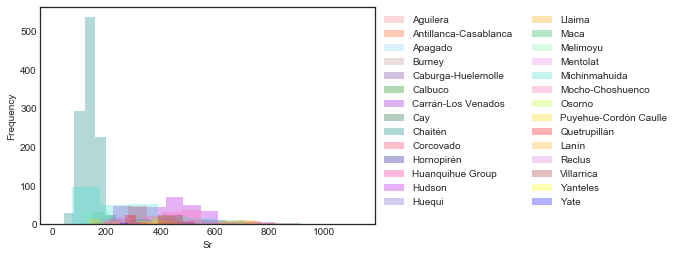

 
Y
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


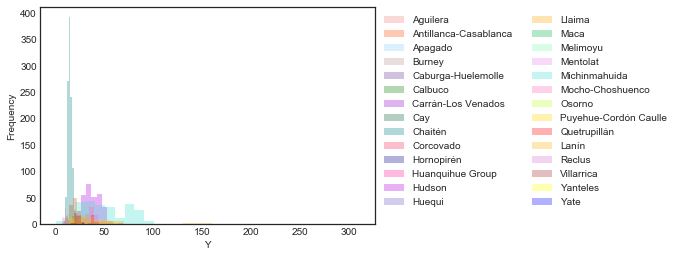

 
Zr
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


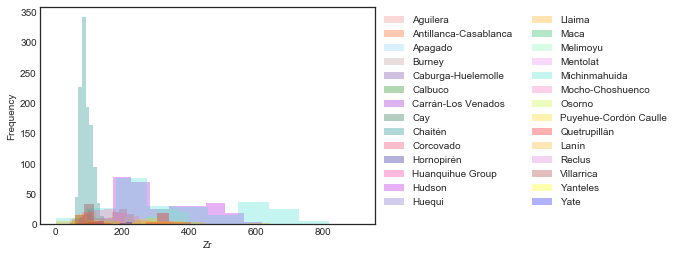

 
Nb
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


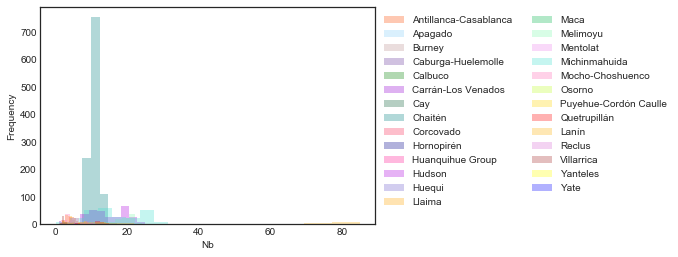

 
Cs
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


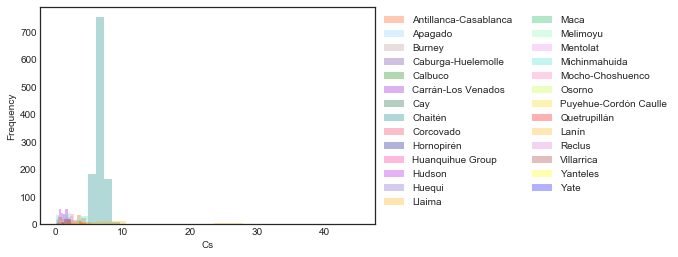

 
Ba
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


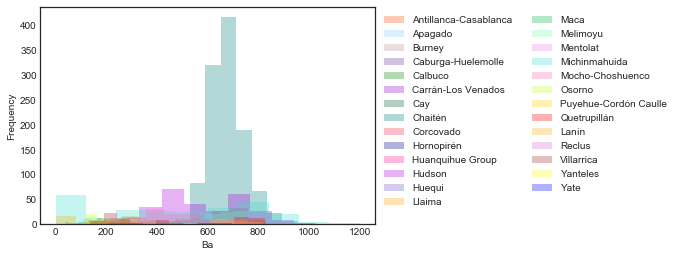

 
La
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


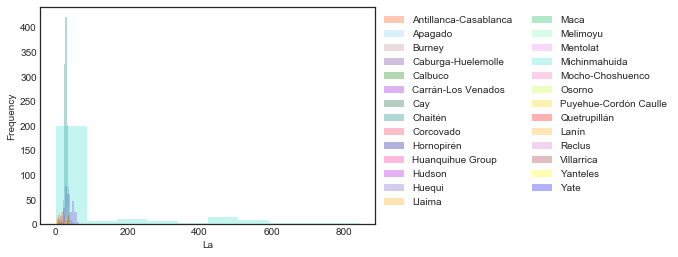

 
Ce
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


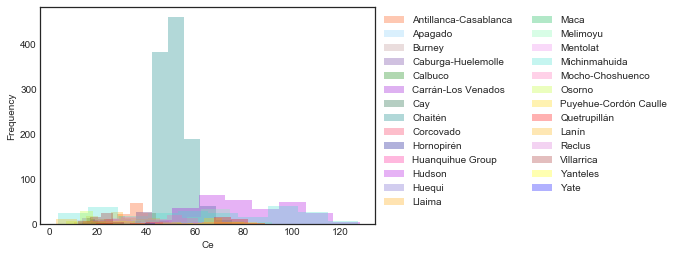

 
Pr
Volcán without information Aguilera
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


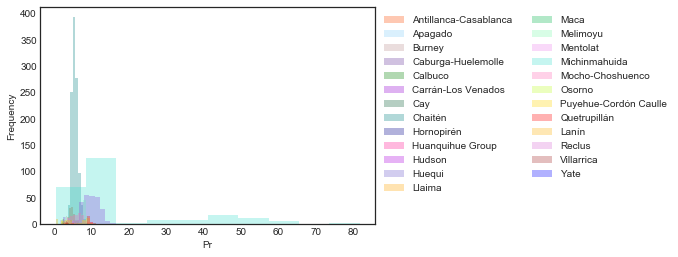

 
Nd
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


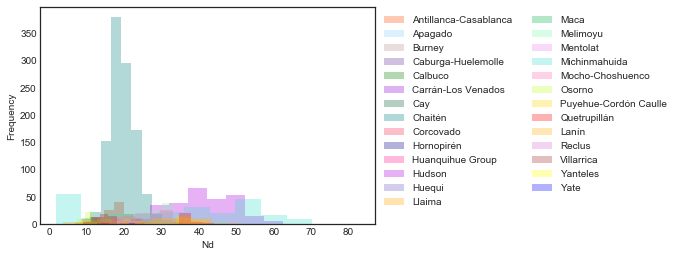

 
Sm
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


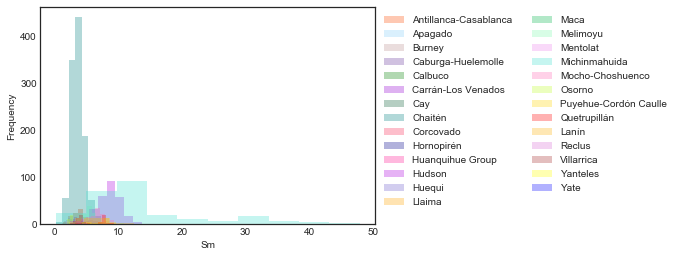

 
Eu
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


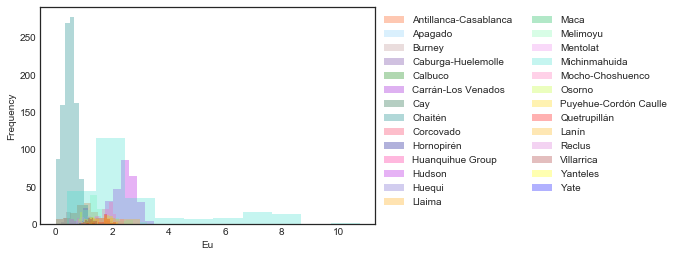

 
Gd
Volcán without information Aguilera
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


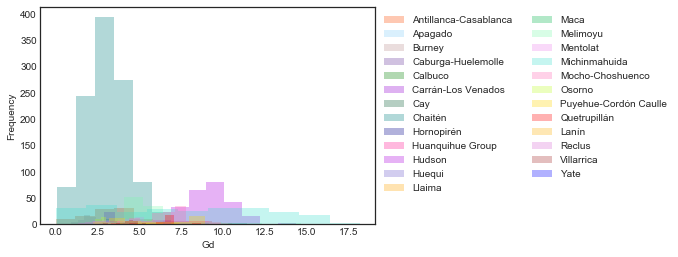

 
Tb
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


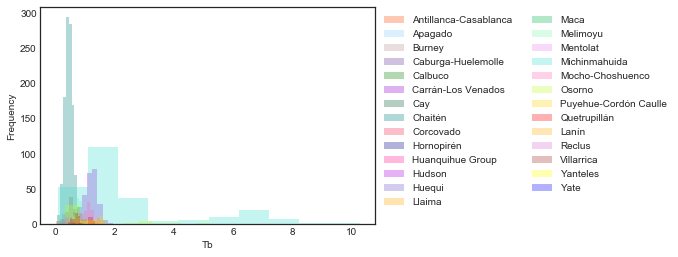

 
Dy
Volcán without information Aguilera
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


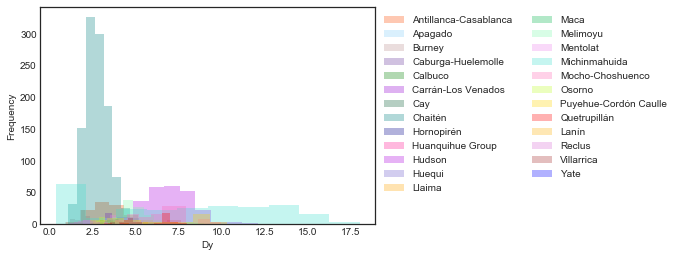

 
Ho
Volcán without information Aguilera
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


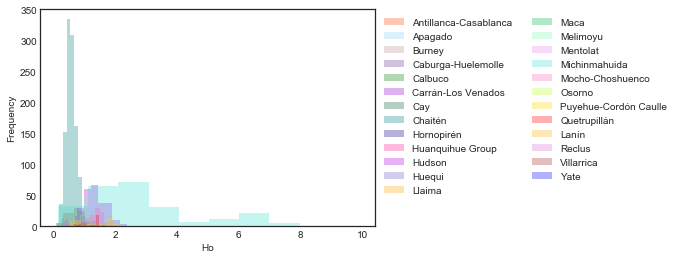

 
Er
Volcán without information Aguilera
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli
Volcán without information Yanteles


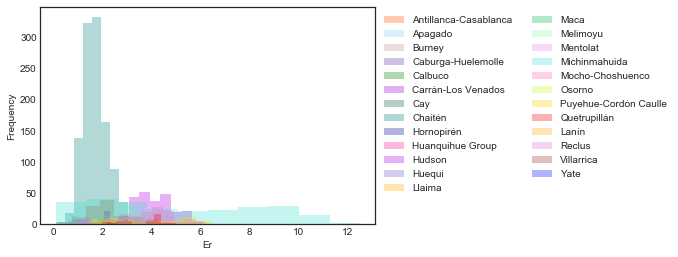

 
Tm
Volcán without information Aguilera
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Lanín
Volcán without information Sollipulli
Volcán without information Yanteles


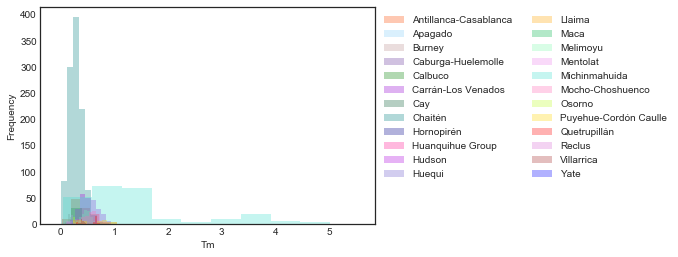

 
Yb
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


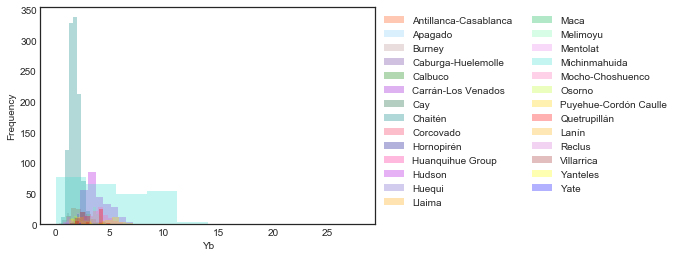

 
Lu
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


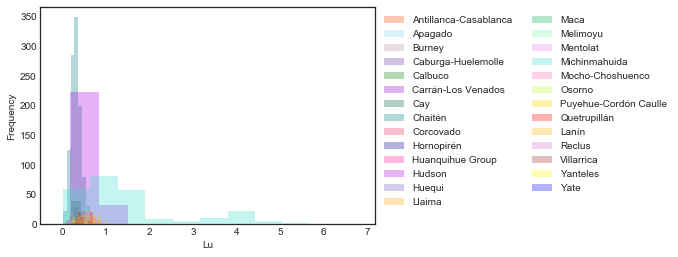

 
Hf
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


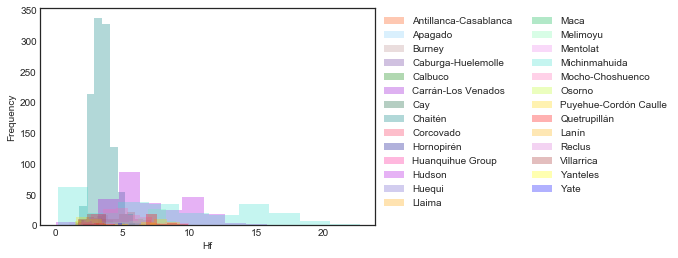

 
Ta
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Lanín
Volcán without information Sollipulli


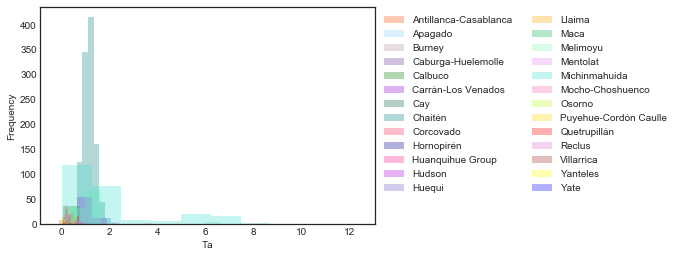

 
Pb
Volcán without information Aguilera
Volcán without information Corcovado
Volcán without information Subsidiary Vcha dome
Volcán without information Lanín
Volcán without information Sollipulli
Volcán without information Yanteles


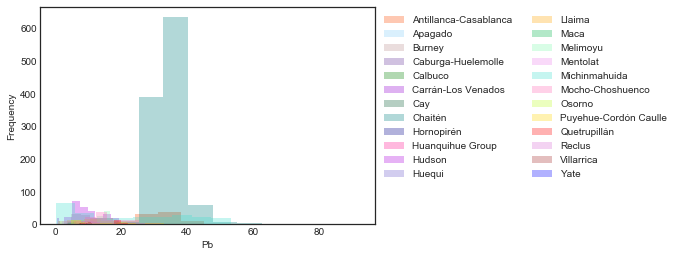

 
Th
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Sollipulli


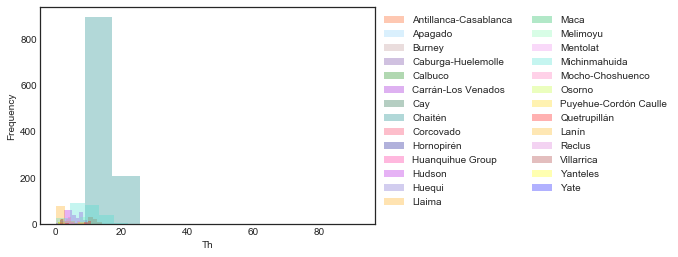

 
U
Volcán without information Aguilera
Volcán without information Subsidiary Vcha dome
Volcán without information Lanín
Volcán without information Sollipulli


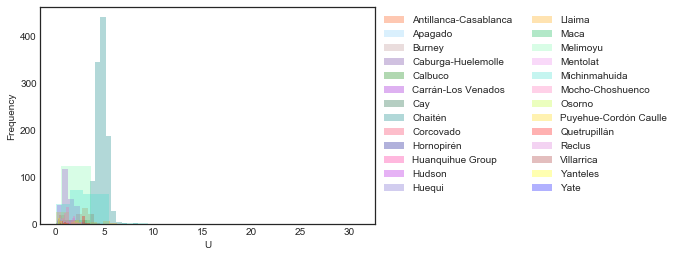

In [58]:
#drop non numerical features
Data = pd.read_excel("../Data/TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('n.a.',np.nan);Data = Data.replace('<0.01',np.nan);Data = Data.replace('<0.1',np.nan)
Data_temp = Data.drop(['SampleID','SamplePoint','Seccion','SubSeccion','MeasurementRun','87Sr/86Sr','2SE','CodigoLaboratorioRadiocarbono','TipoDeSeccion','Comentarios','Mapa?','Flag','DescripcionFlag','Latitud','Longitud','MaterialMedido','TecnicaDeMedicion','Referencia','ErrorEdad'], axis=1)
Data_temp = Data_temp[Data_temp.Volcan != 'Unknown']

#create a new column which indicates if  
Data_temp['Historic'] = Data_temp['Edad'].str.contains('Historic')
Data_temp = Data_temp[Data_temp['Historic']!= True]
Data_temp = Data_temp.drop(['Historic'], axis=1)

volcanes = Data_temp['Volcan'].unique()

for elemento in Data_temp.columns:

    
    if (elemento != 'Volcan')&(elemento != 'Evento'):  
        print(" ")
        print('\033[1m'+ elemento + '\033[0m')
        for i in volcanes:
            coloR, Marker  = simbologia(i,'Unknown')
            Data_volcan =Data_temp[Data_temp['Volcan']==i]
            if pd.isnull(Data_volcan[elemento]).all():
                print('Volcán without information {}'.format(i))              
            else:
                plt.hist(Data_volcan[elemento] ,label= i, color = coloR, alpha= 0.3,range=(np.nanmin(Data_volcan[elemento]), np.nanmax(Data_volcan[elemento])))  
    
        plt.gca().set(xlabel=elemento,ylabel='Frequency')
        plt.legend(bbox_to_anchor=(1,1),ncol=2)
        plt.show()
           

### Distribution data, separated by volcano

Volcán Yate without information for Magnitud


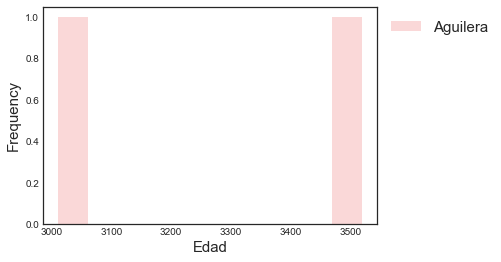

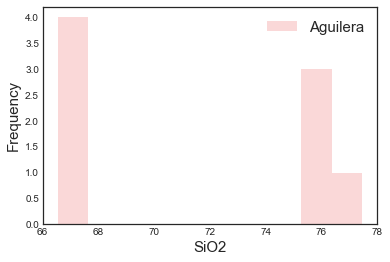

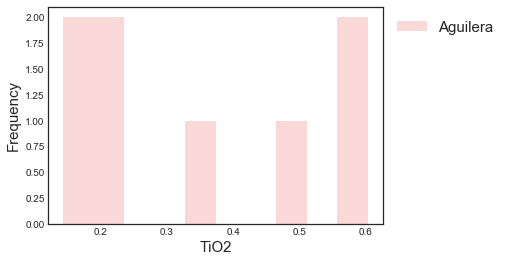

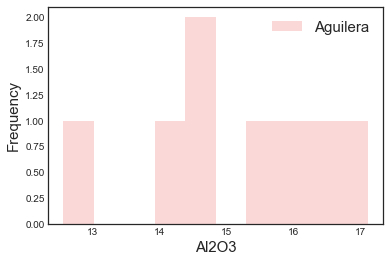

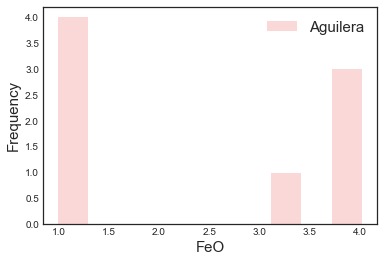

...

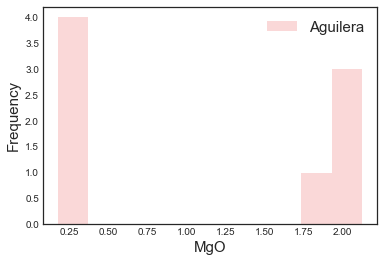

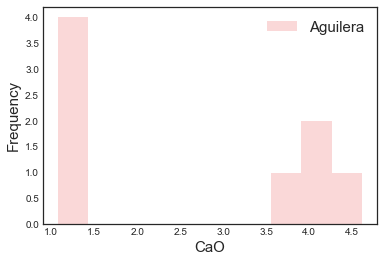

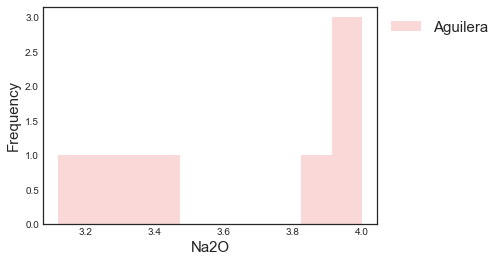

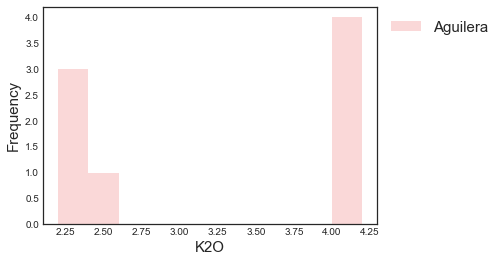

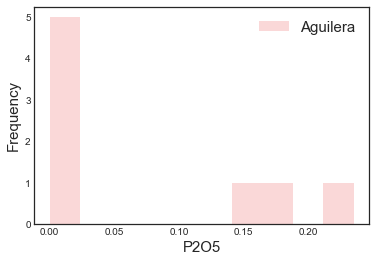

Volcán Yate without information for Cl


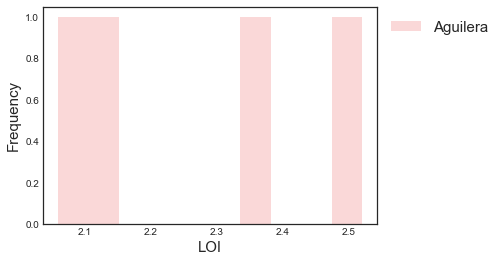

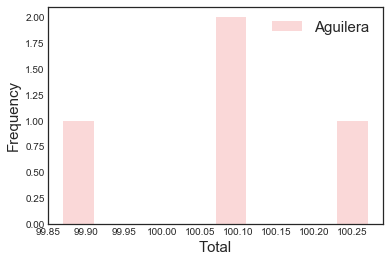

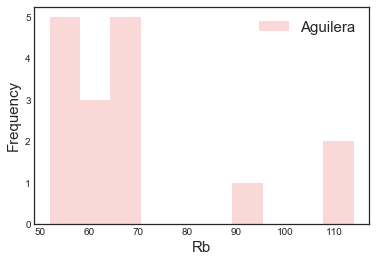

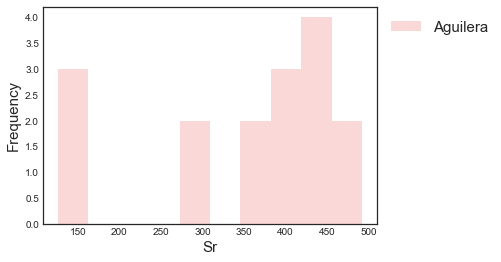

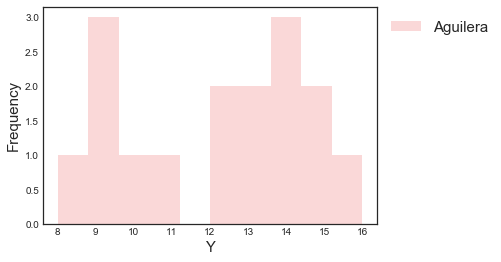

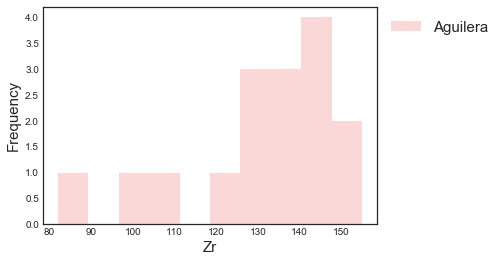

Volcán Yate without information for Nb
Volcán Yate without information for Cs
Volcán Yate without information for Ba
Volcán Yate without information for La
Volcán Yate without information for Ce
Volcán Yate without information for Pr
Volcán Yate without information for Nd
Volcán Yate without information for Sm
Volcán Yate without information for Eu
Volcán Yate without information for Gd
Volcán Yate without information for Tb
Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm
Volcán Yate without information for Yb
Volcán Yate without information for Lu
Volcán Yate without information for Hf
Volcán Yate without information for Ta
Volcán Yate without information for Pb
Volcán Yate without information for Th
Volcán Yate without information for U


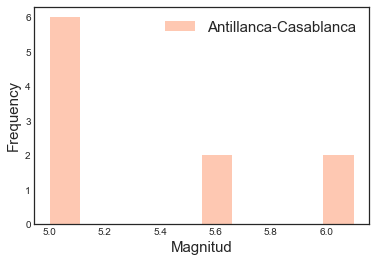

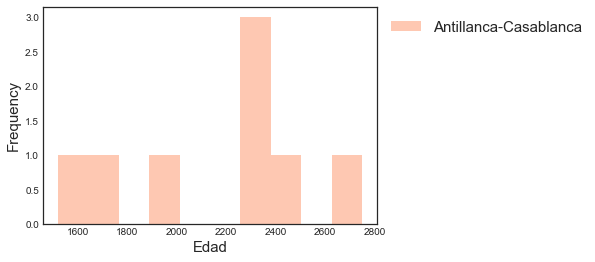

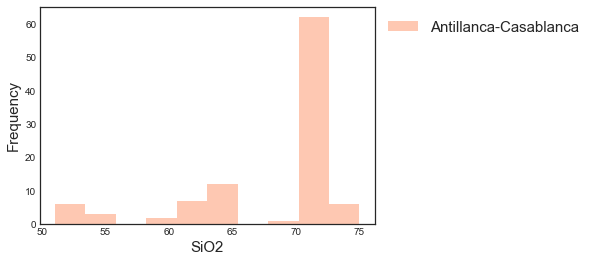

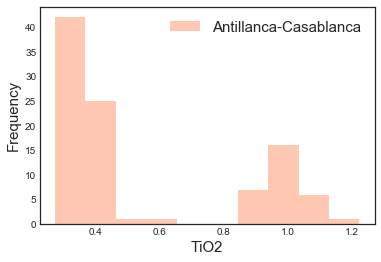

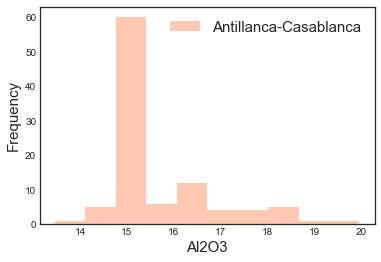

...

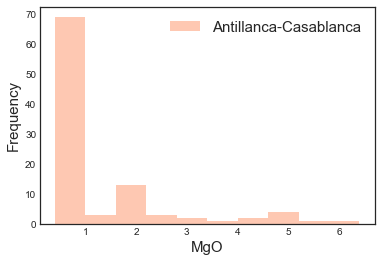

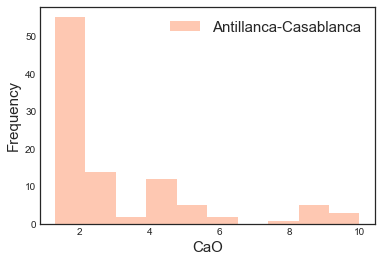

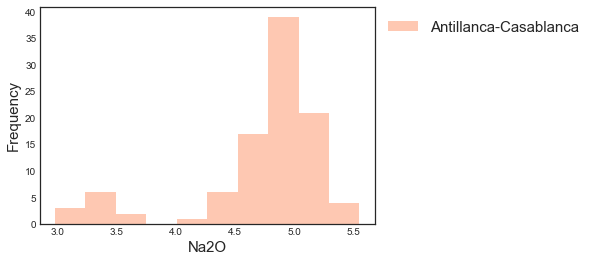

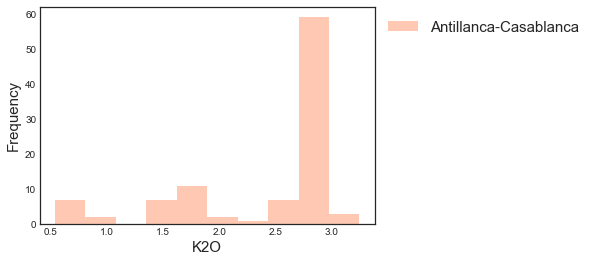

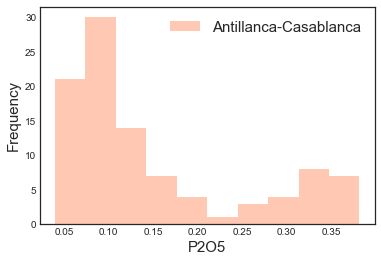

Volcán Yate without information for Cl


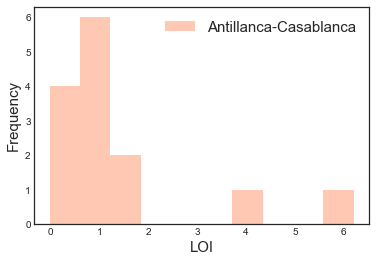

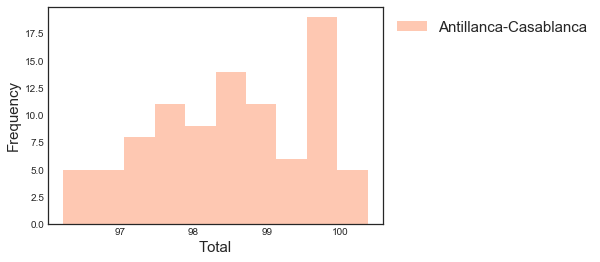

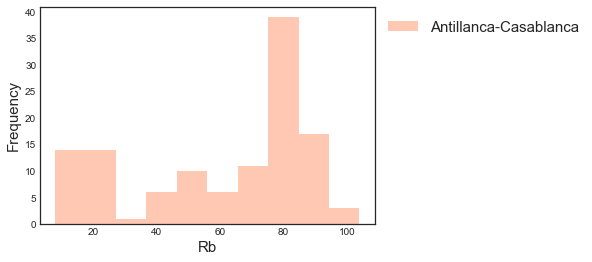

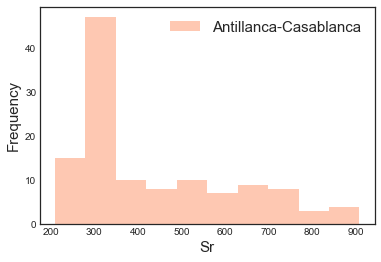

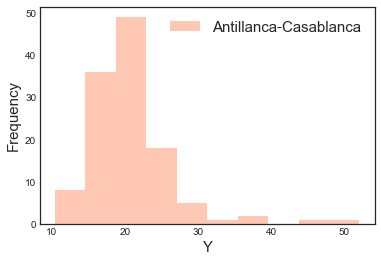

...

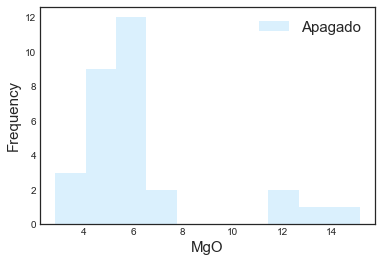

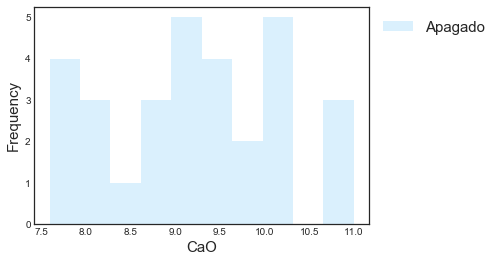

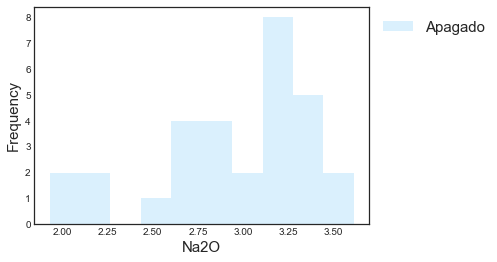

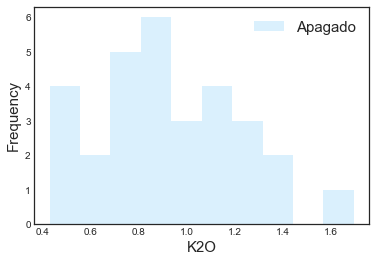

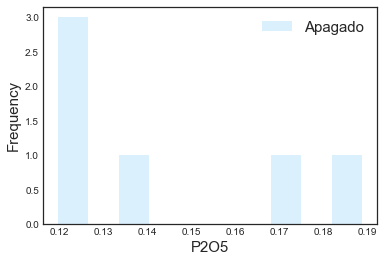

Volcán Yate without information for Cl


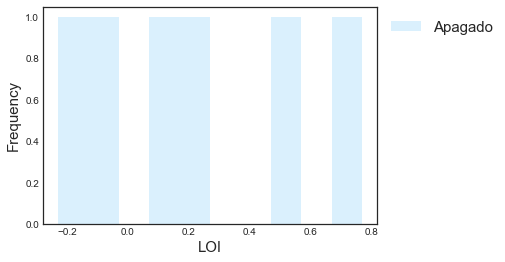

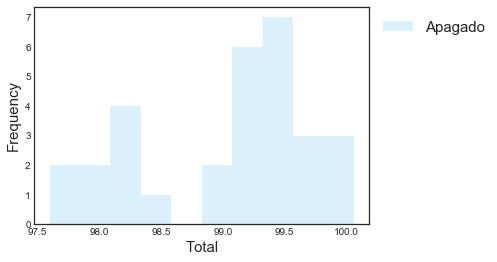

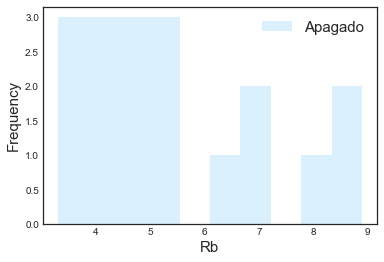

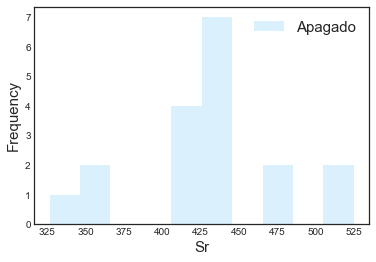

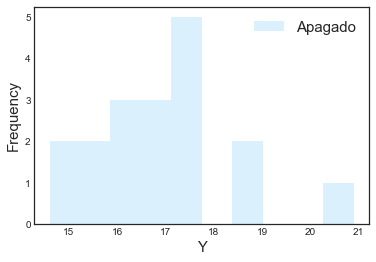

...

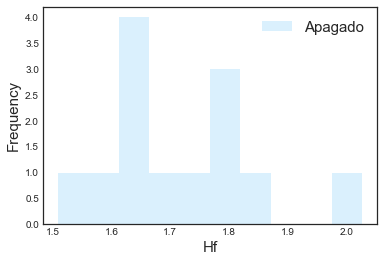

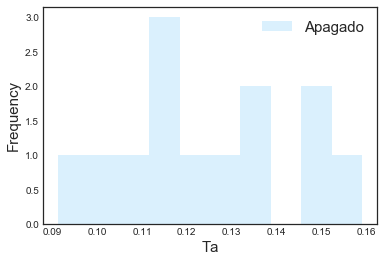

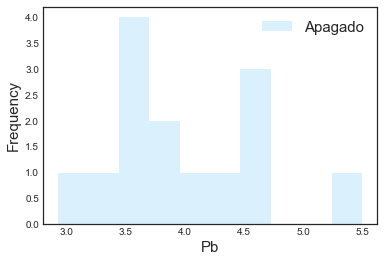

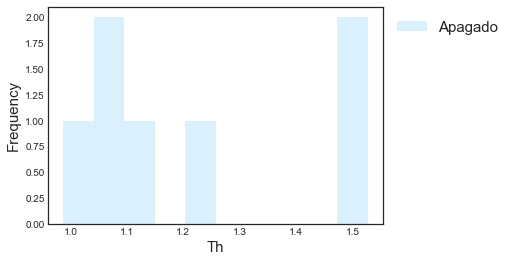

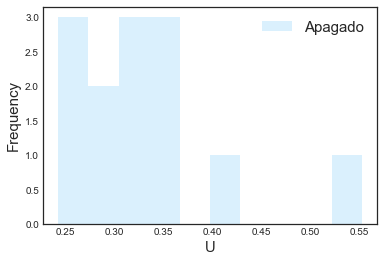

Volcán Yate without information for Magnitud


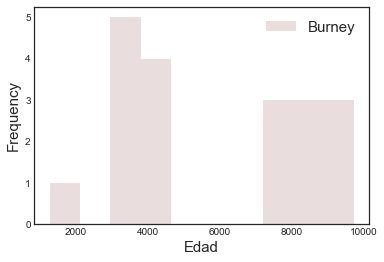

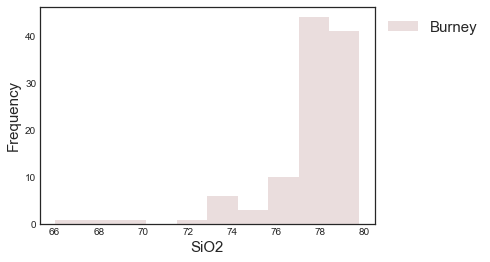

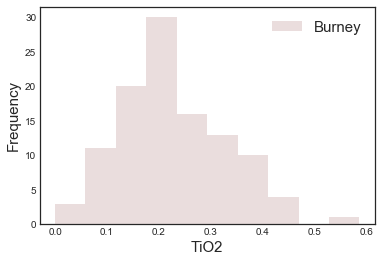

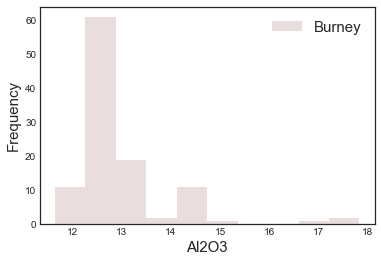

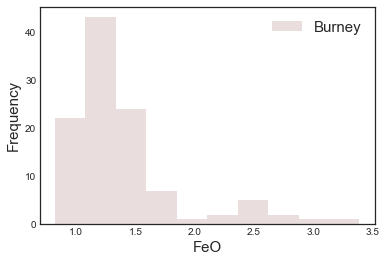

...

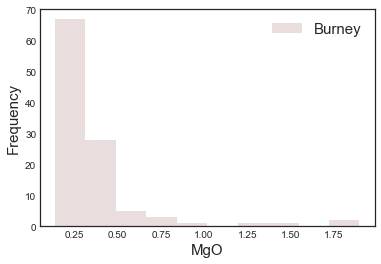

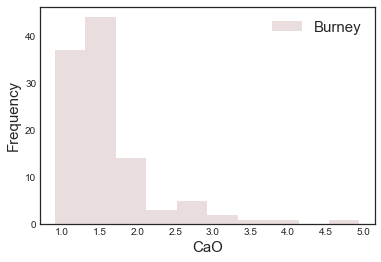

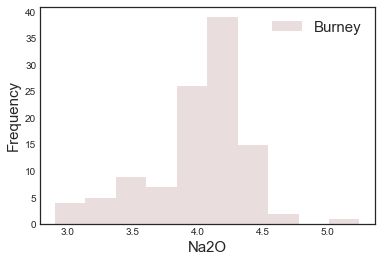

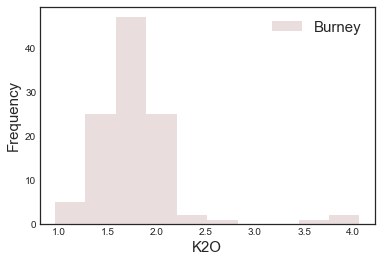

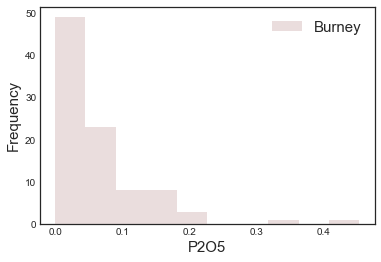

Volcán Yate without information for Cl


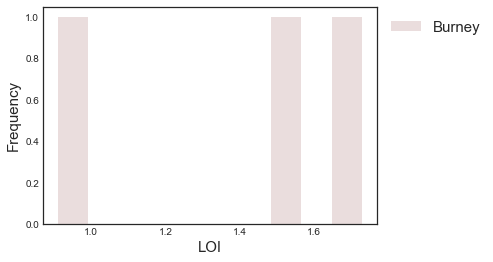

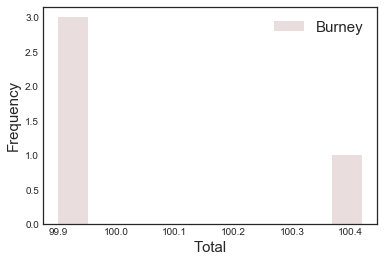

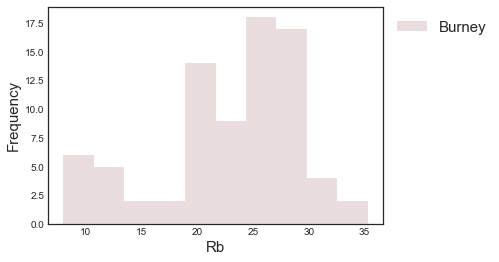

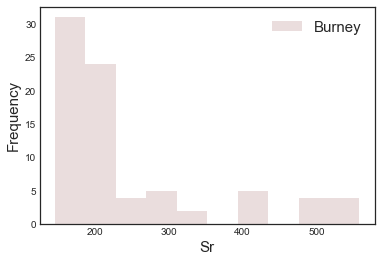

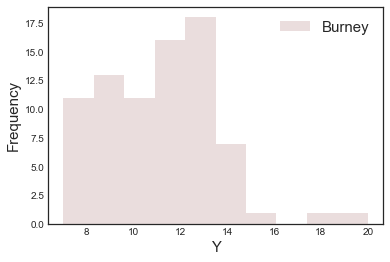

...

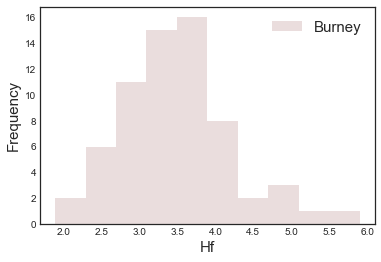

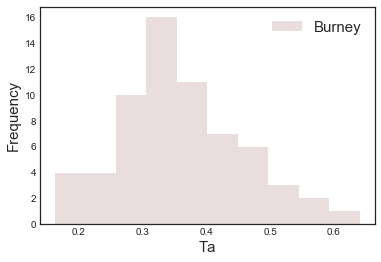

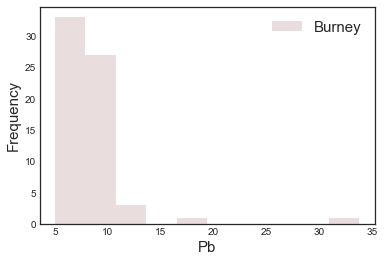

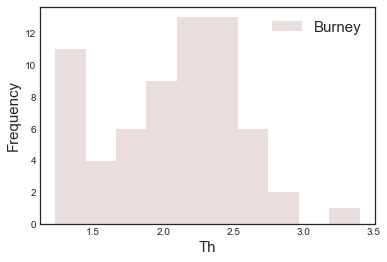

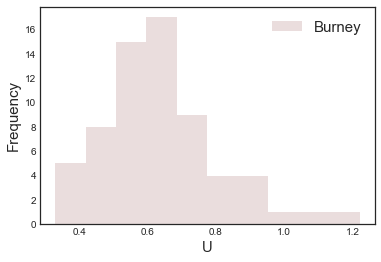

Volcán Yate without information for Magnitud
Volcán Yate without information for Edad


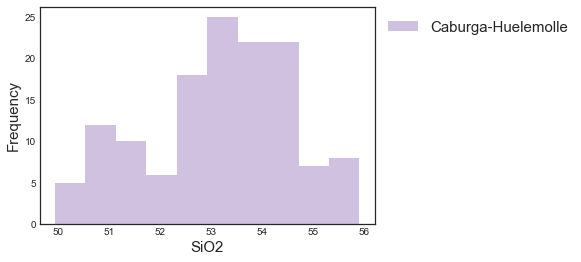

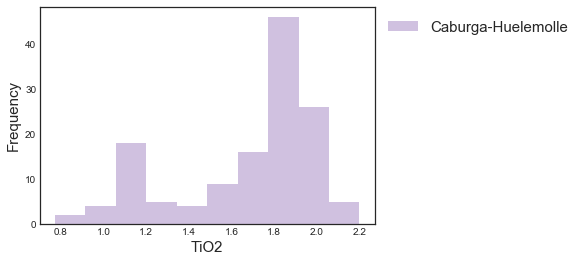

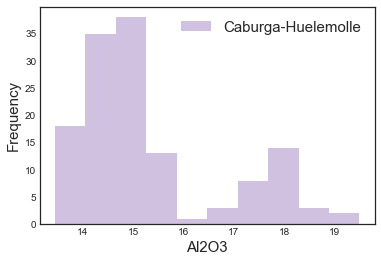

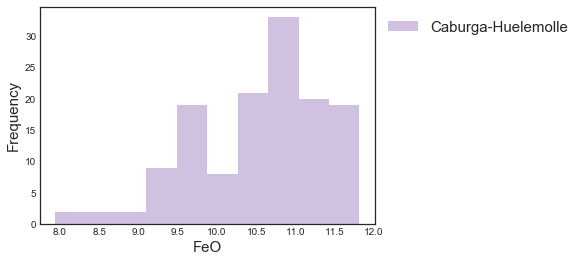

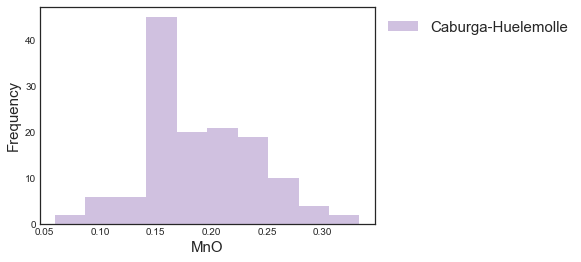

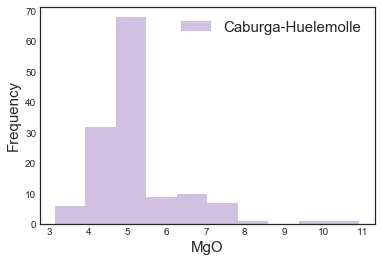

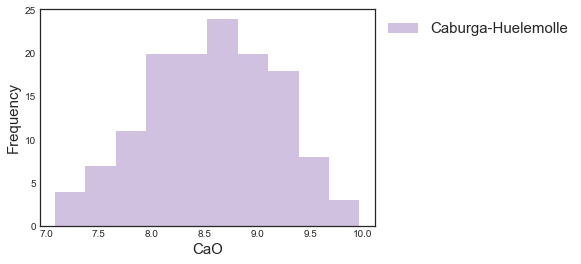

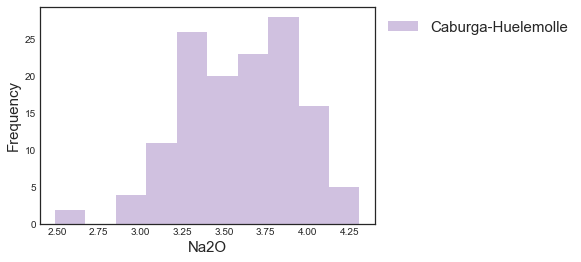

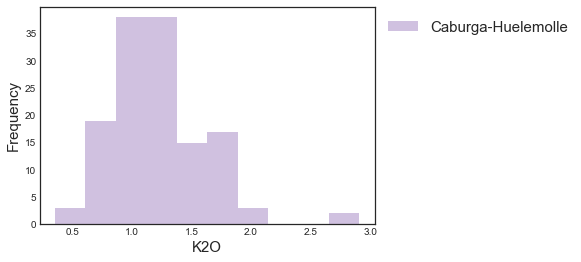

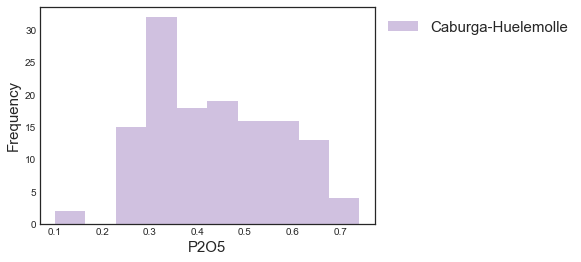

Volcán Yate without information for Cl


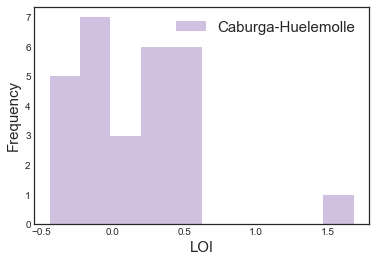

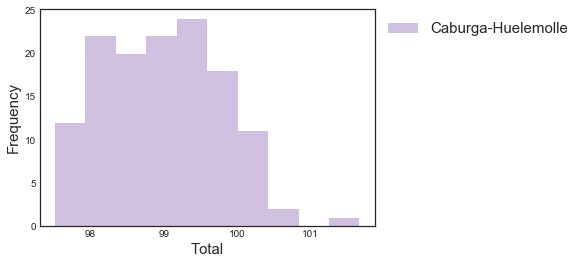

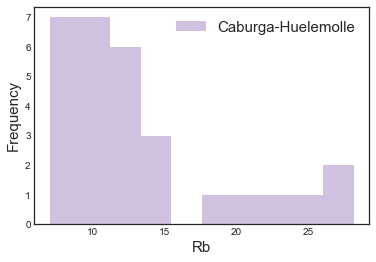

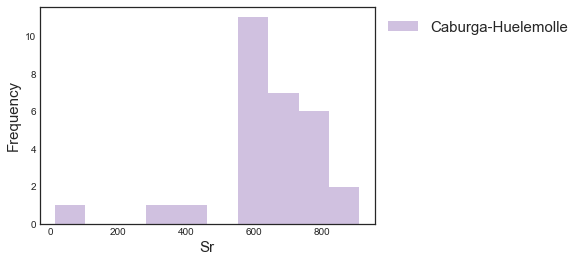

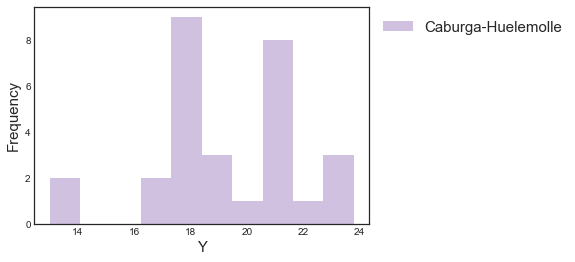

...

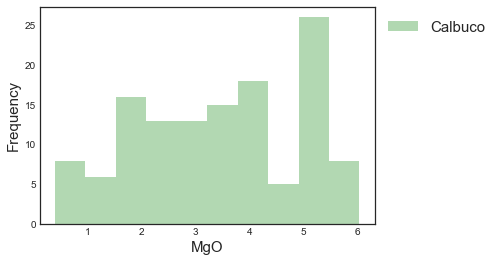

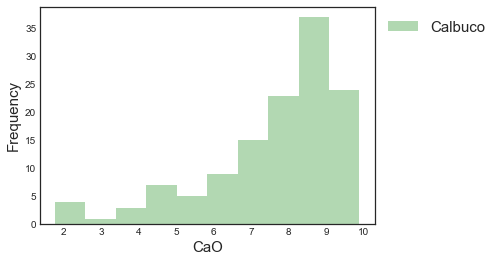

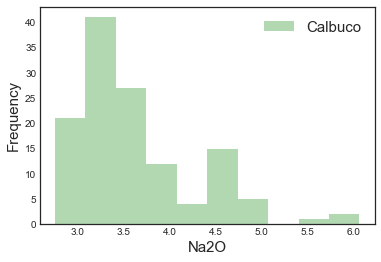

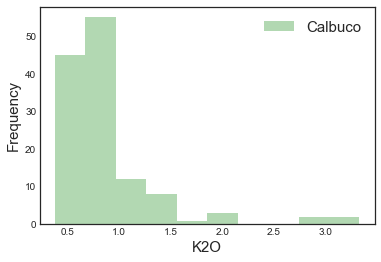

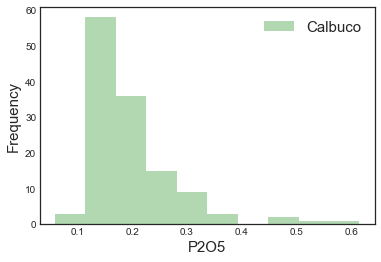

Volcán Yate without information for Cl


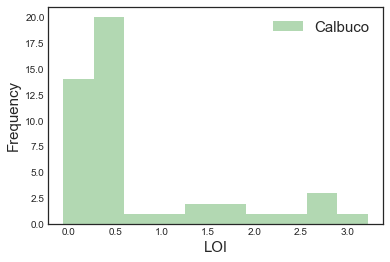

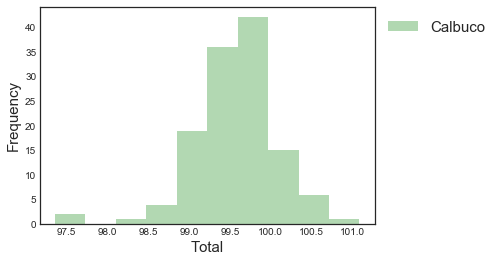

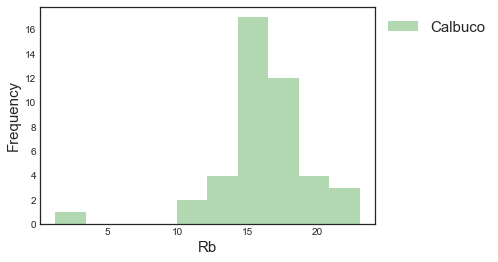

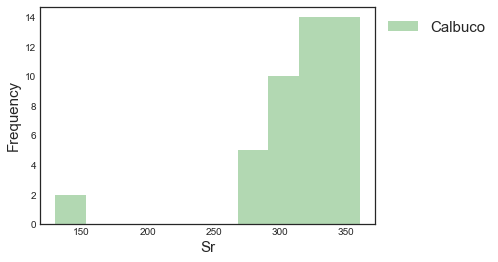

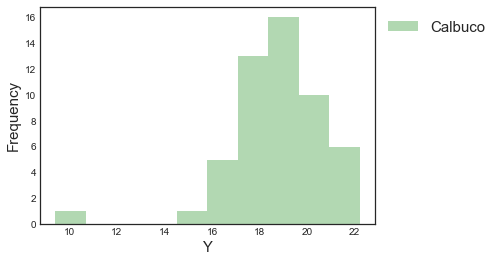

...

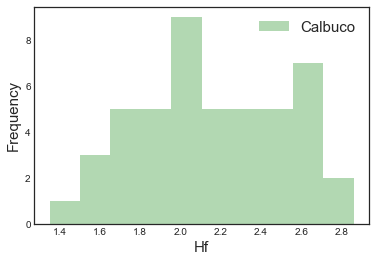

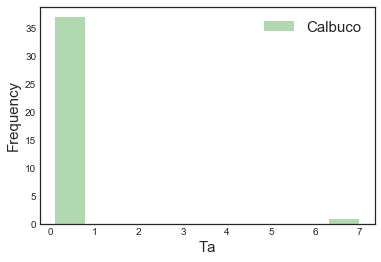

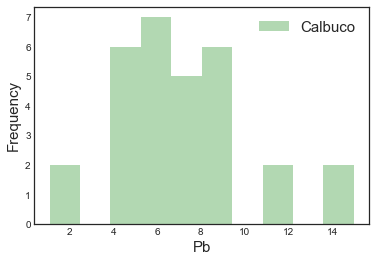

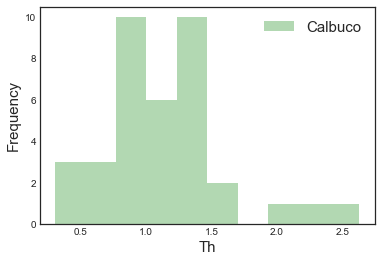

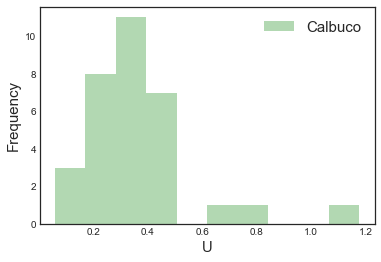

Volcán Yate without information for Magnitud


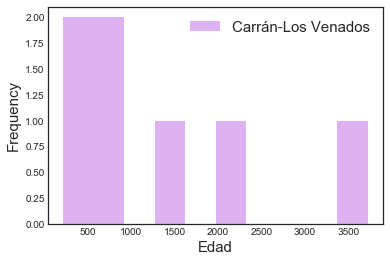

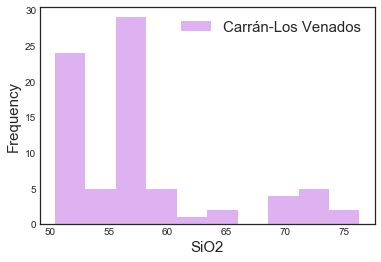

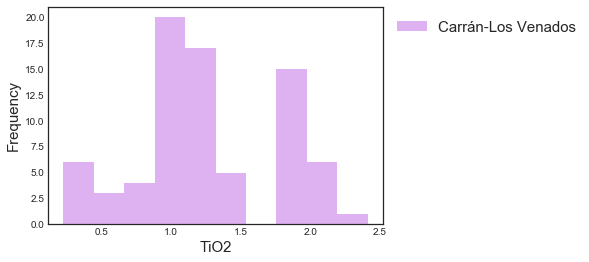

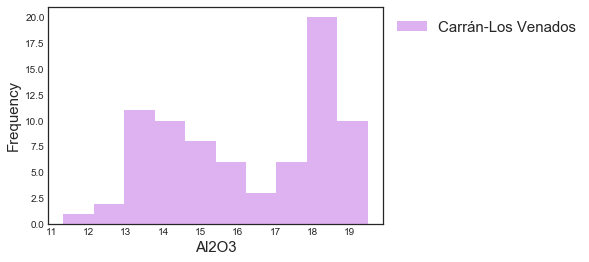

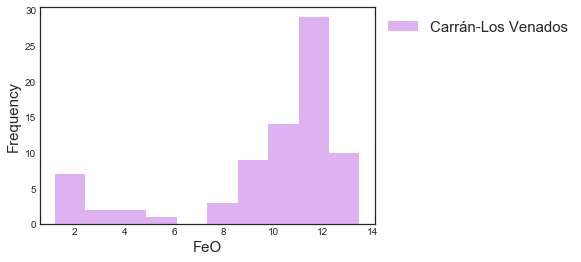

...

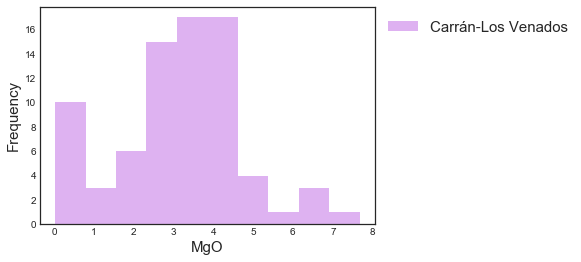

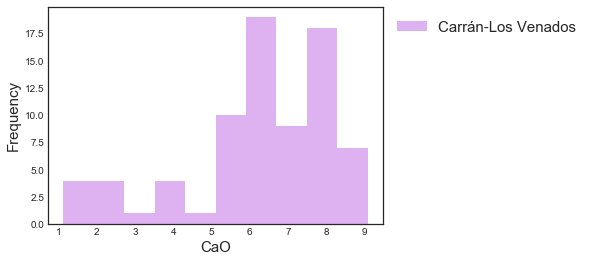

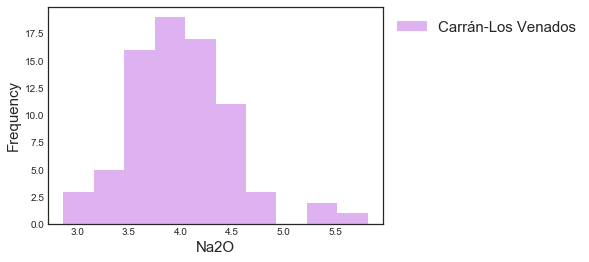

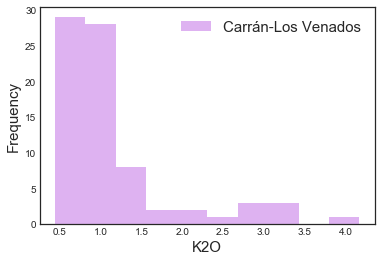

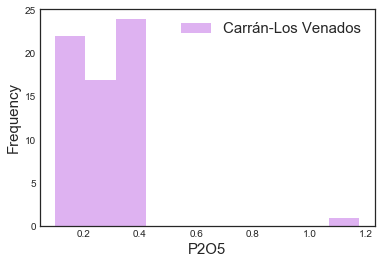

Volcán Yate without information for Cl


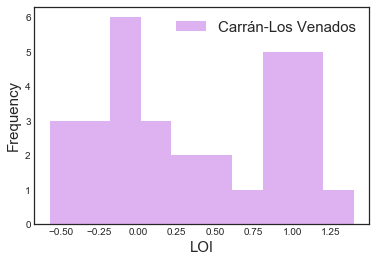

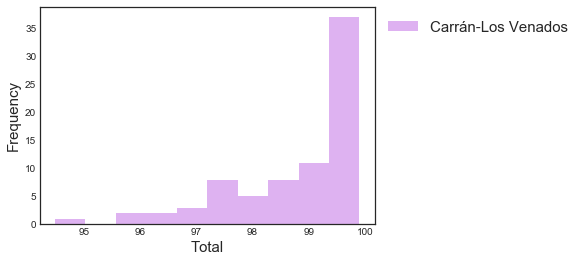

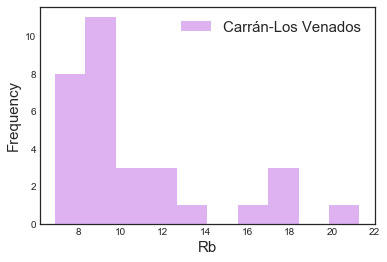

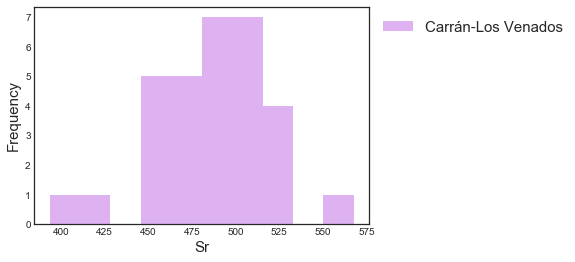

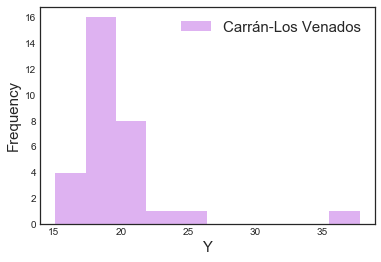

...

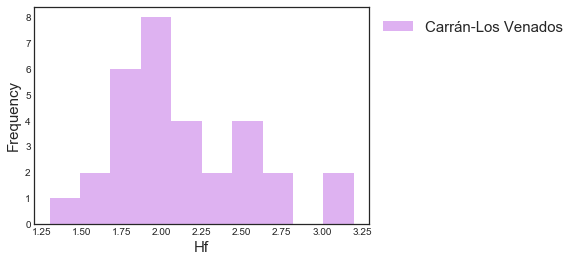

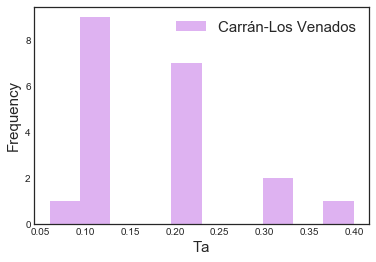

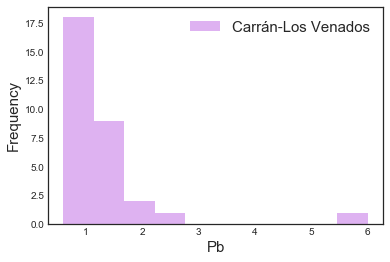

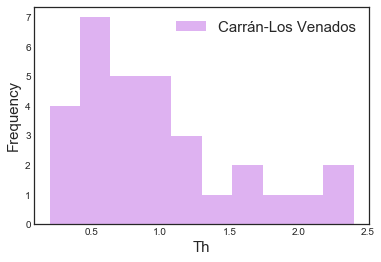

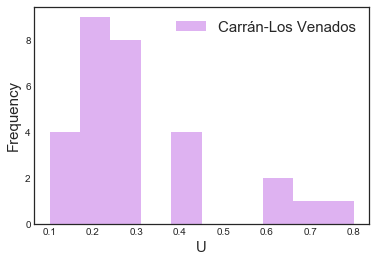

Volcán Yate without information for Magnitud
Volcán Yate without information for Edad


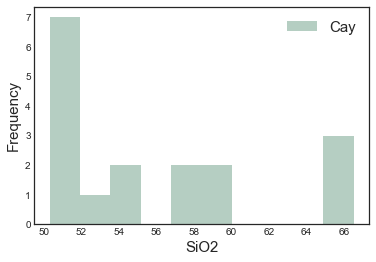

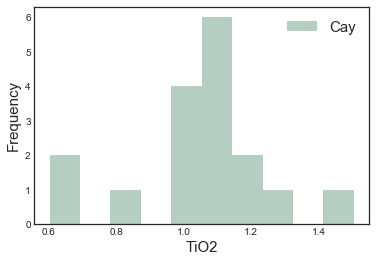

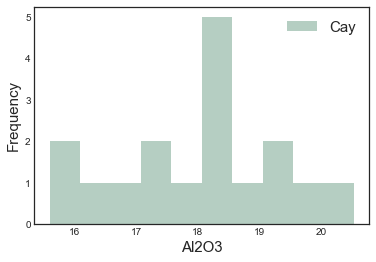

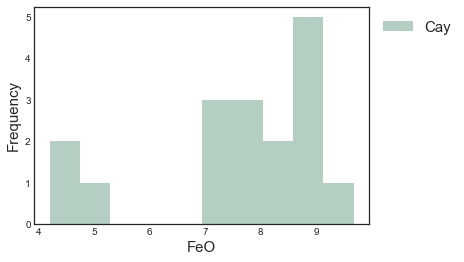

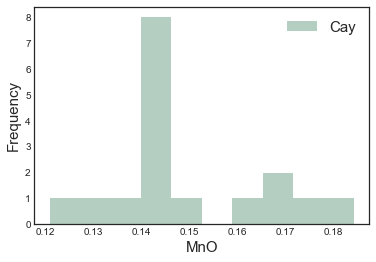

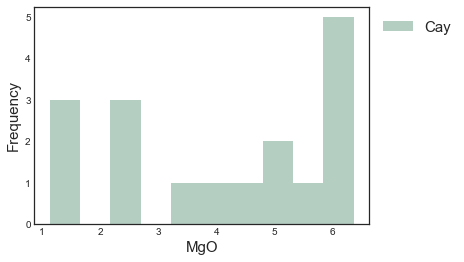

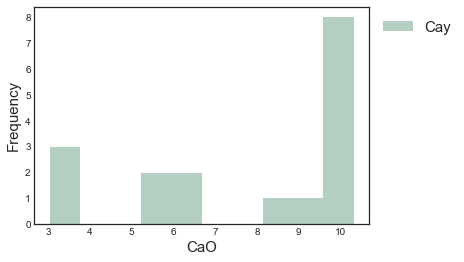

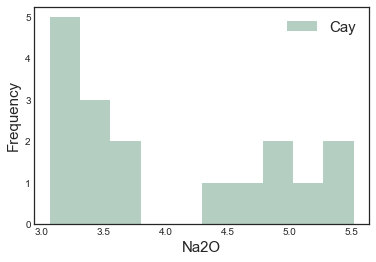

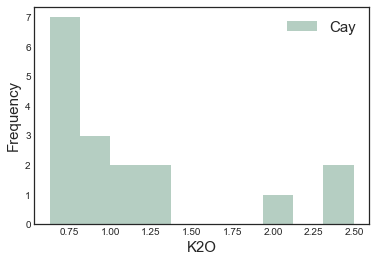

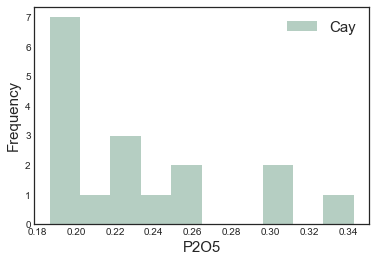

Volcán Yate without information for Cl


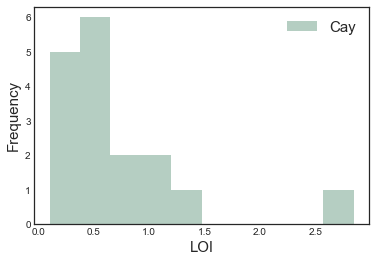

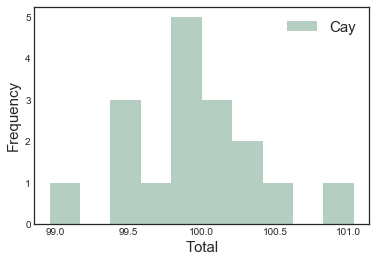

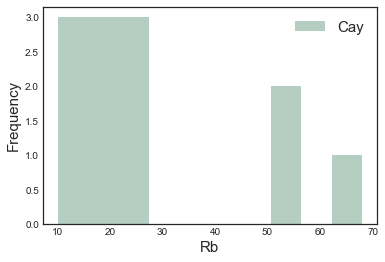

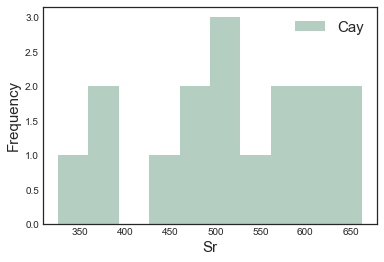

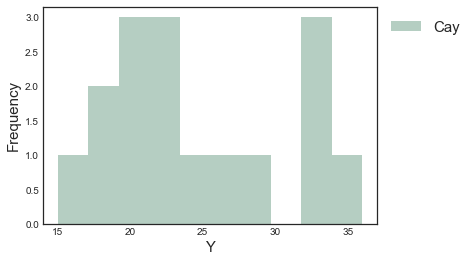

...

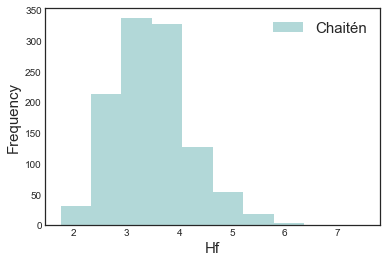

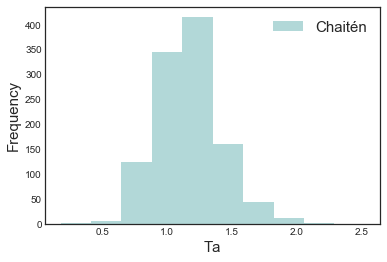

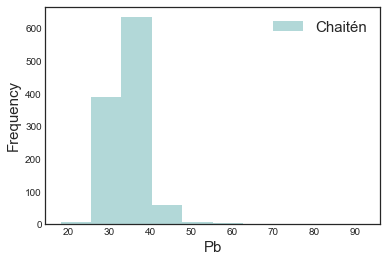

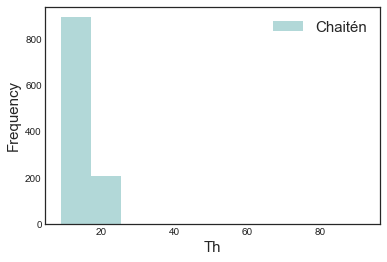

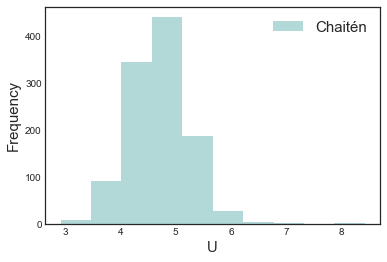

Volcán Yate without information for Magnitud


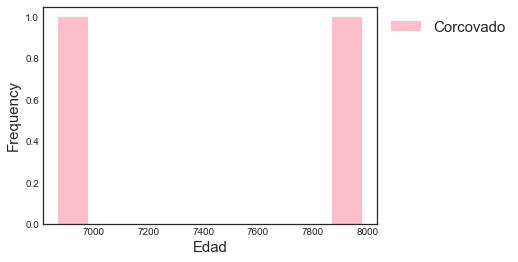

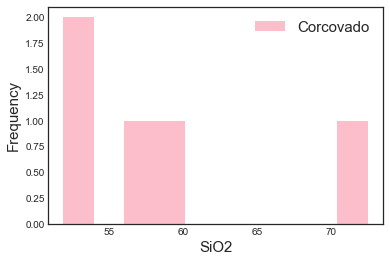

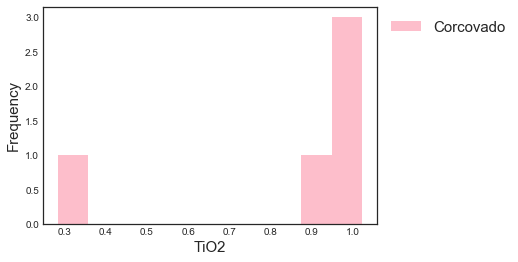

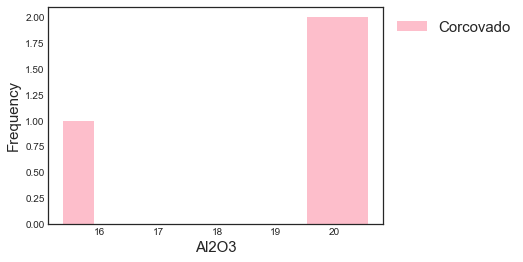

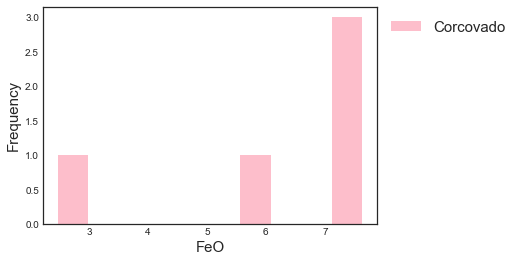

...

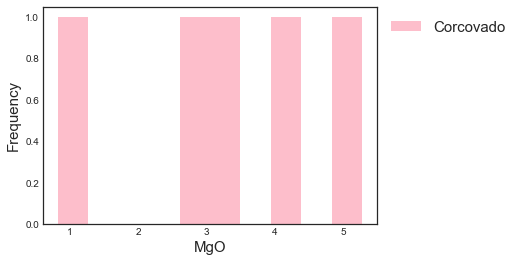

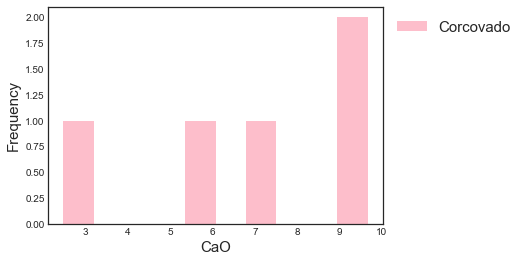

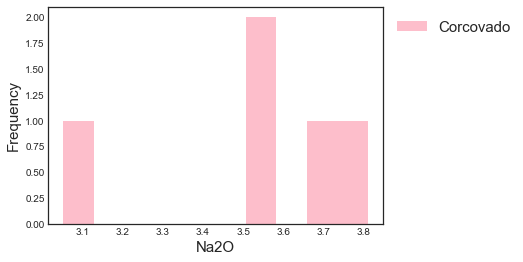

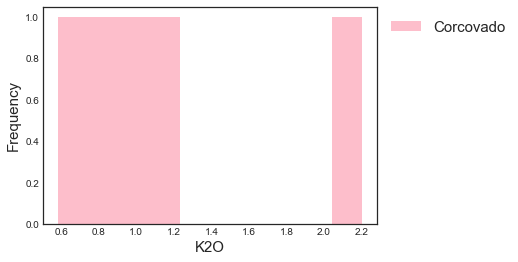

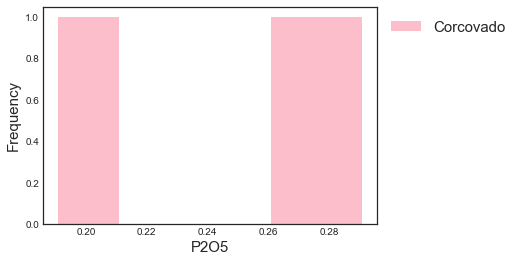

Volcán Yate without information for Cl


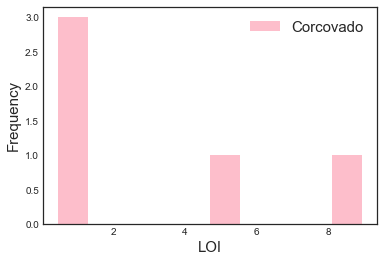

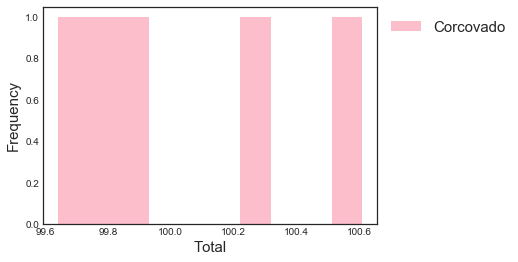

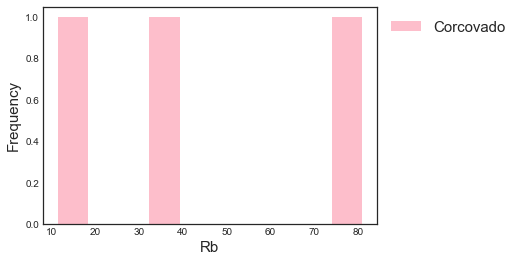

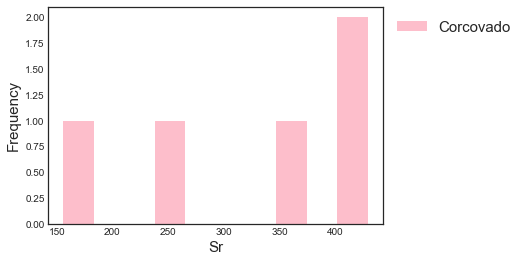

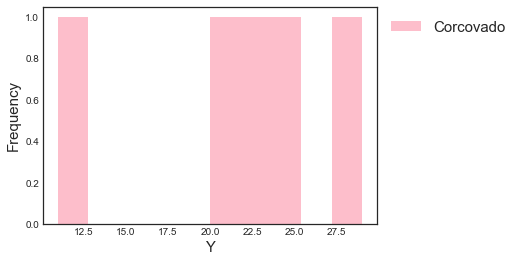

...

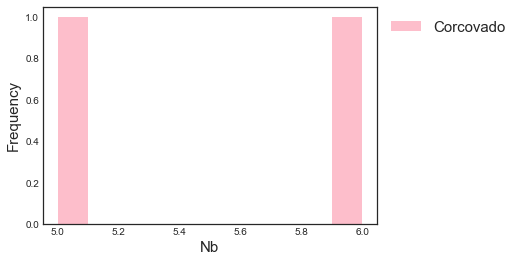

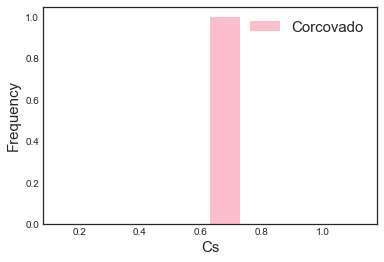

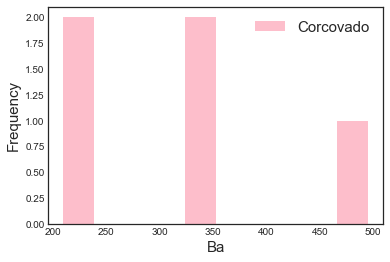

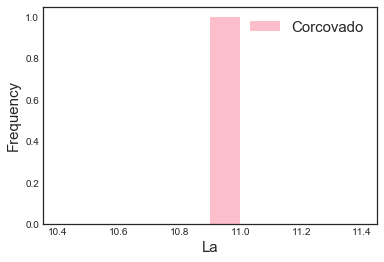

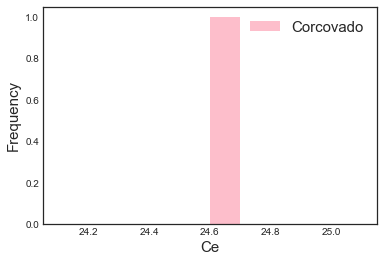

Volcán Yate without information for Pr


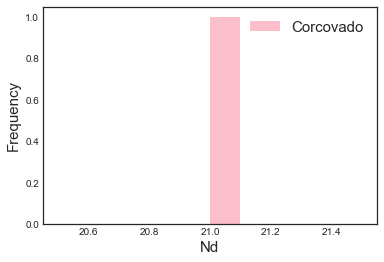

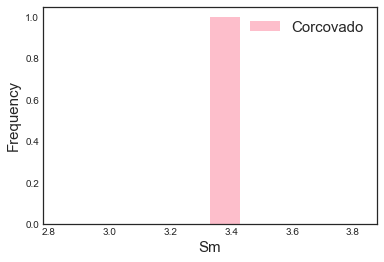

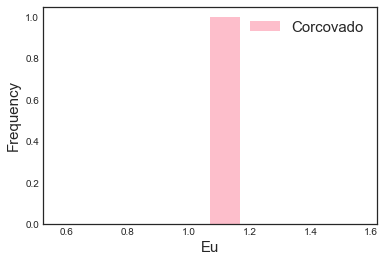

Volcán Yate without information for Gd


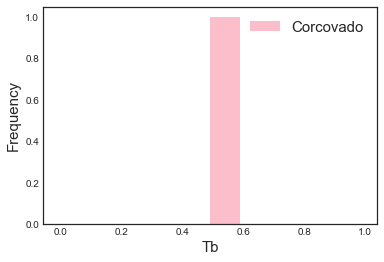

Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm


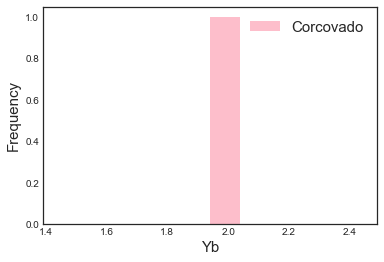

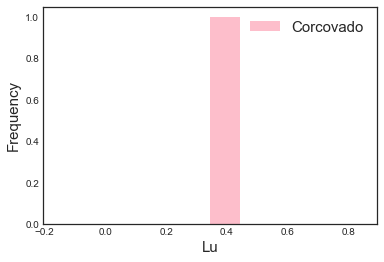

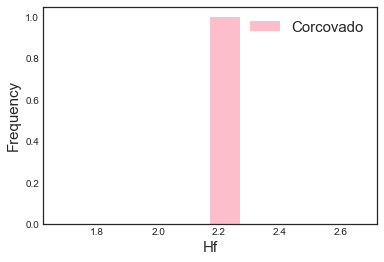

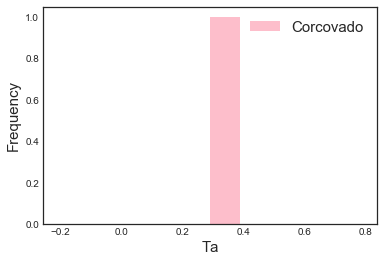

Volcán Yate without information for Pb


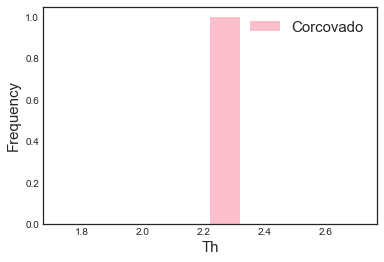

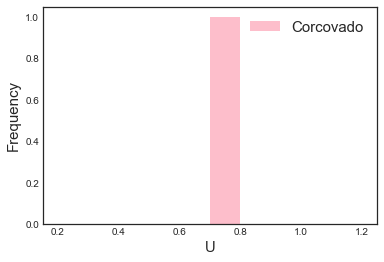

Volcán Yate without information for Magnitud


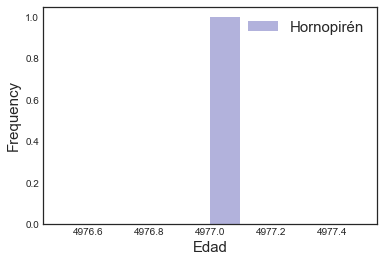

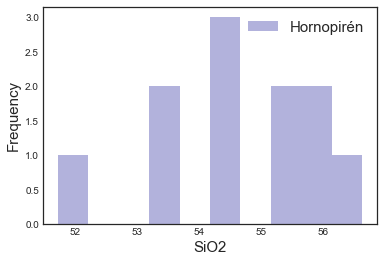

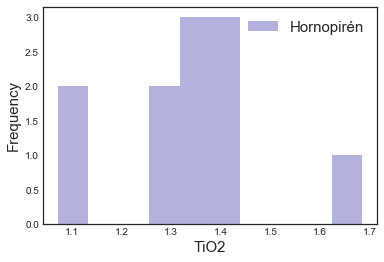

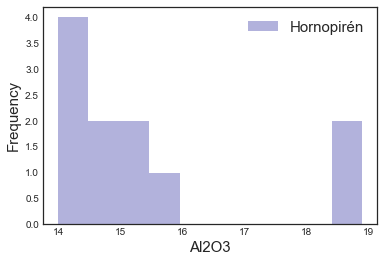

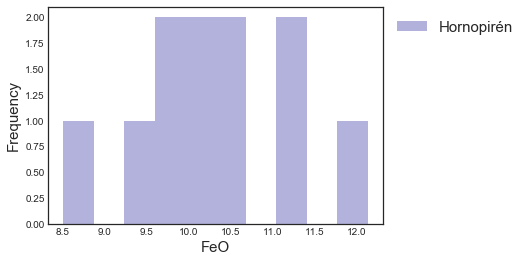

...

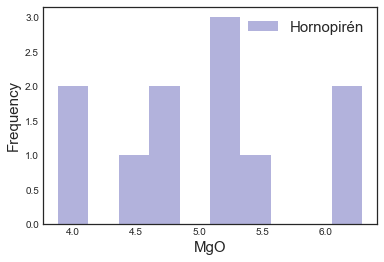

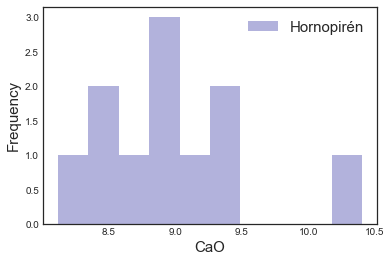

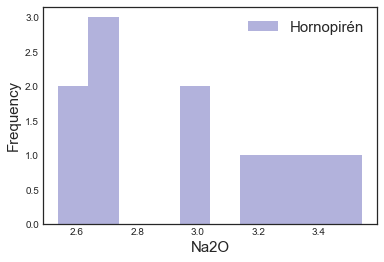

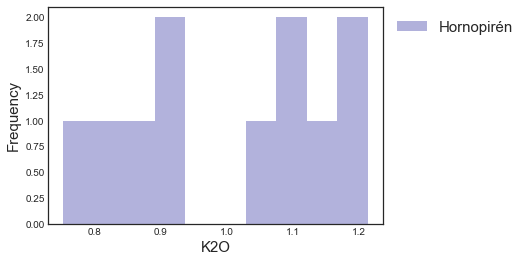

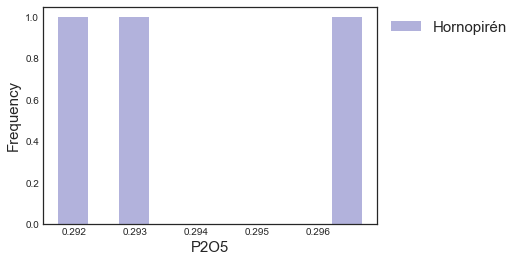

Volcán Yate without information for Cl


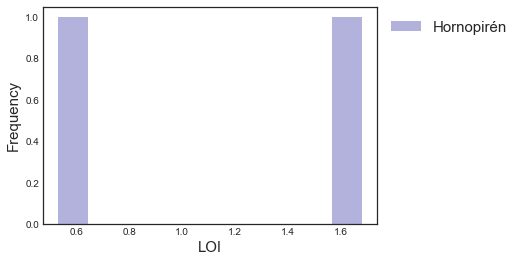

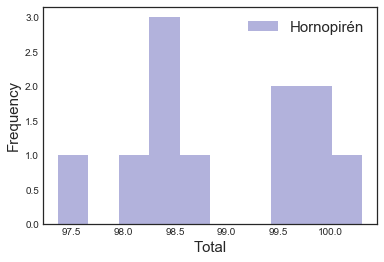

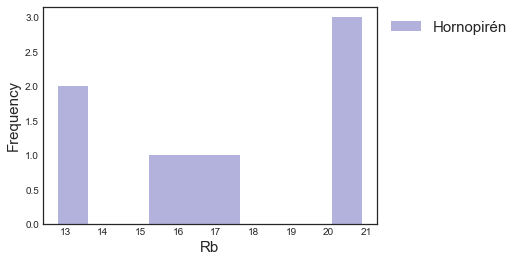

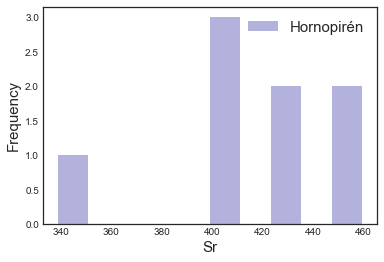

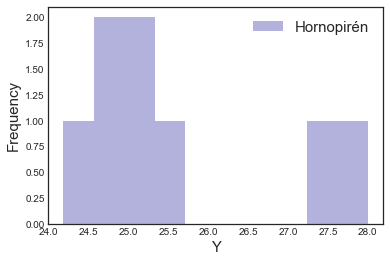

...

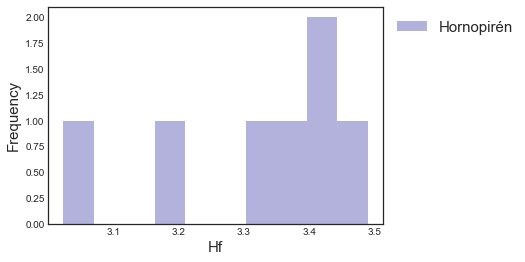

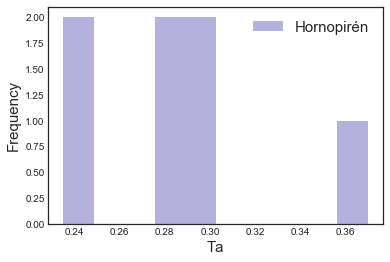

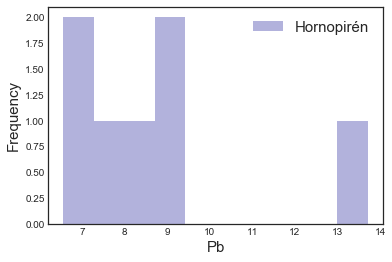

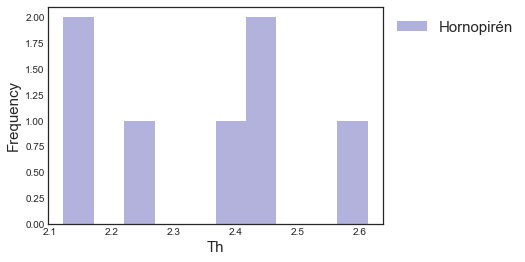

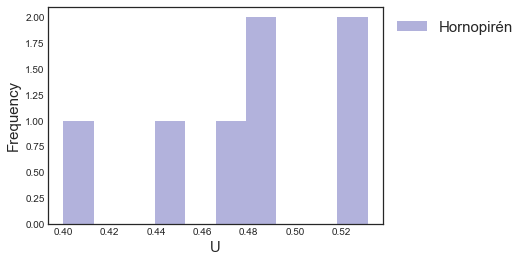

Volcán Yate without information for Magnitud
Volcán Yate without information for Edad


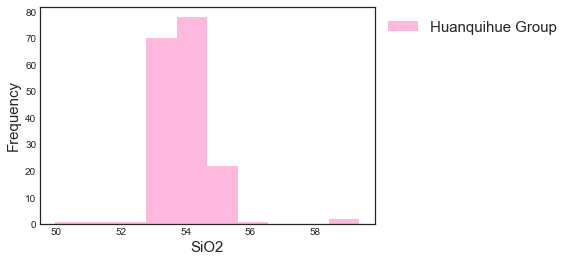

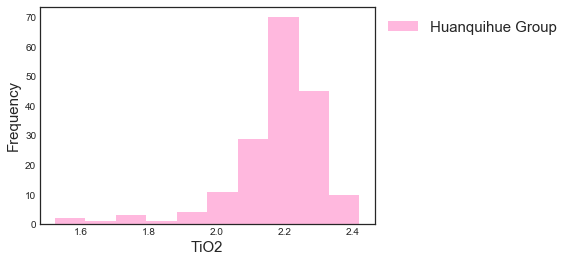

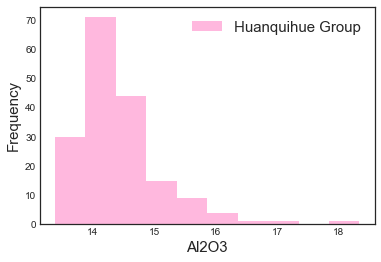

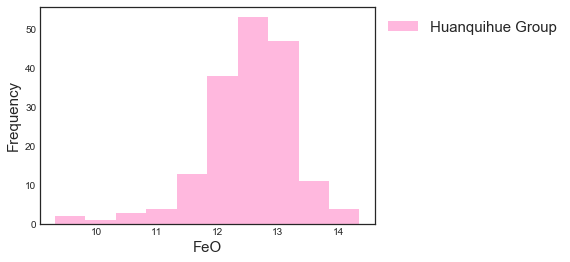

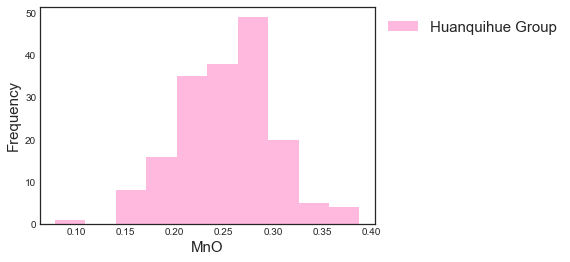

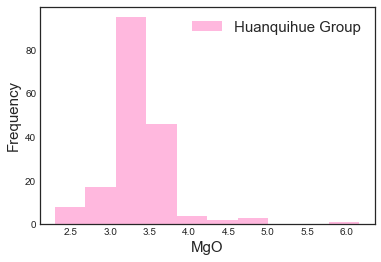

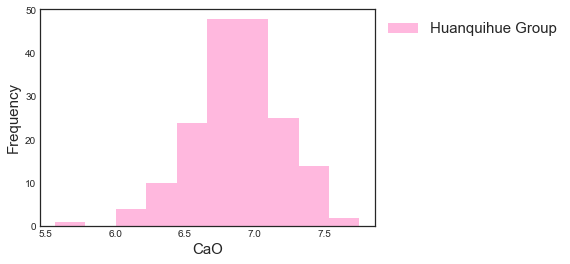

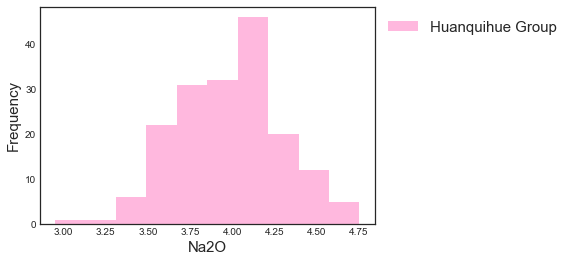

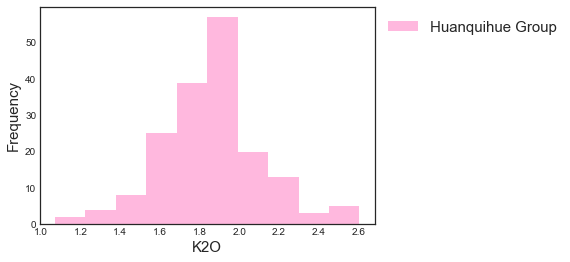

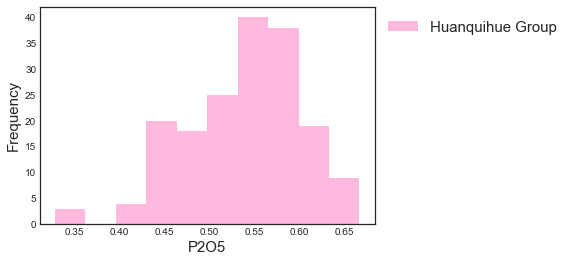

Volcán Yate without information for Cl


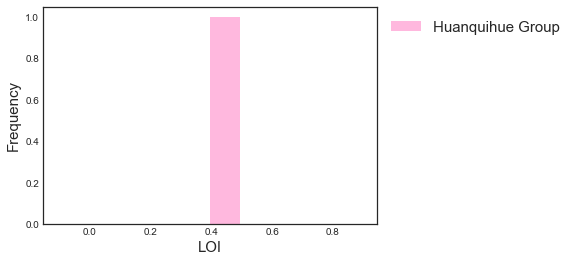

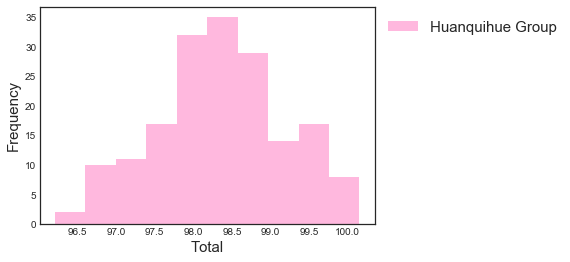

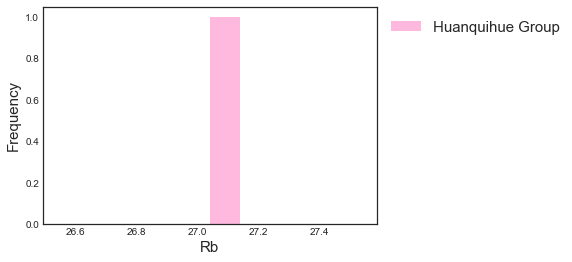

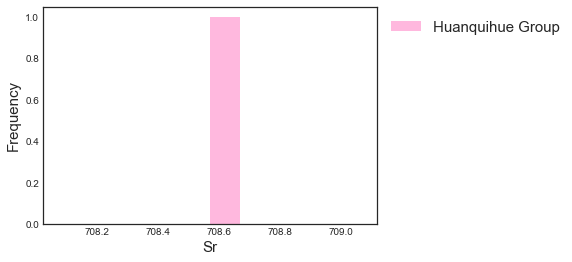

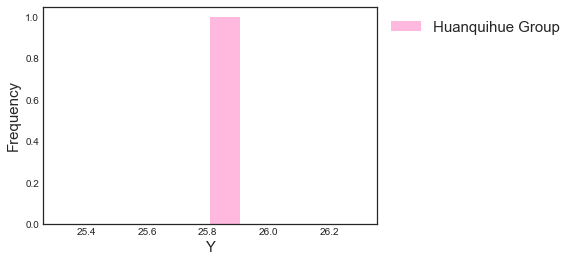

...

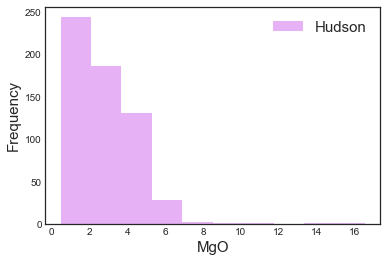

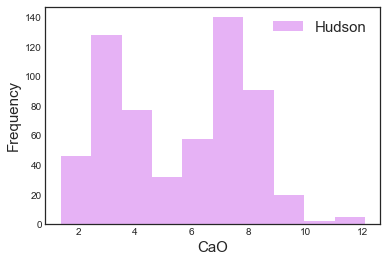

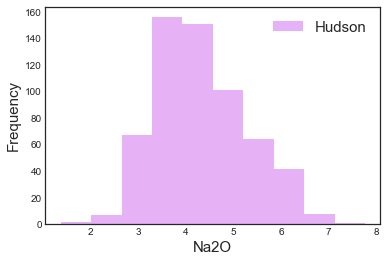

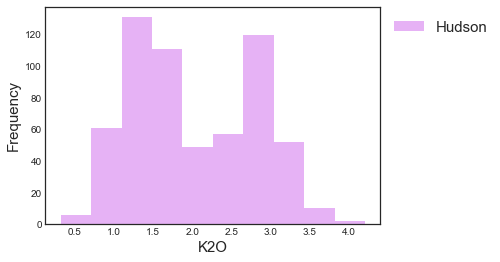

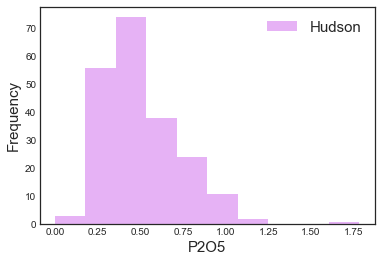

Volcán Yate without information for Cl


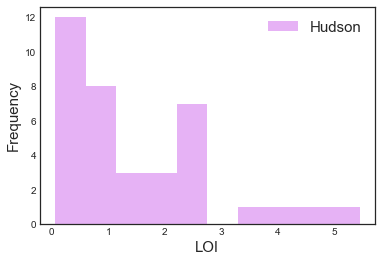

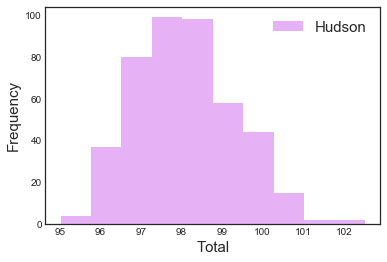

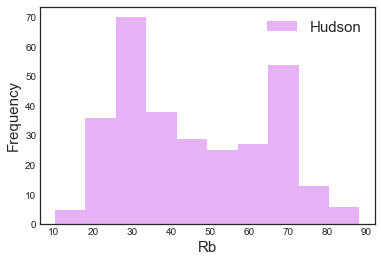

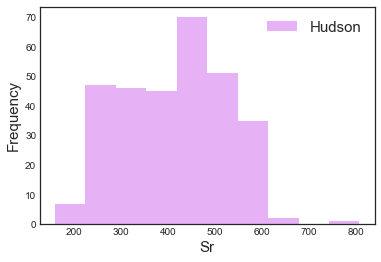

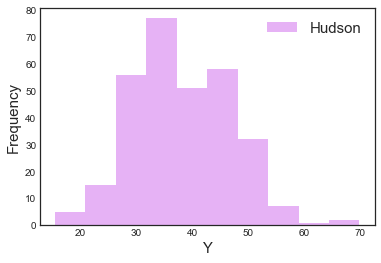

...

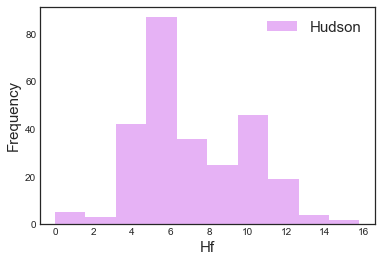

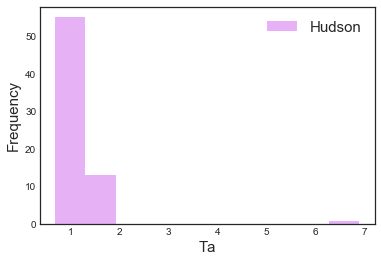

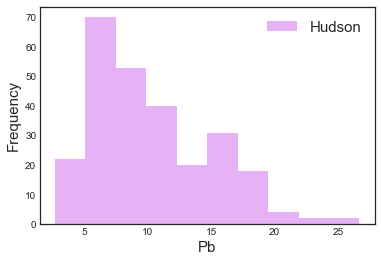

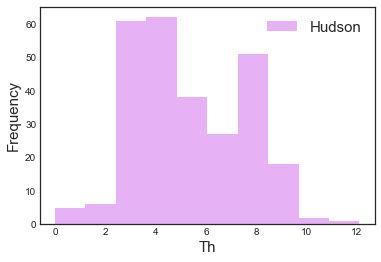

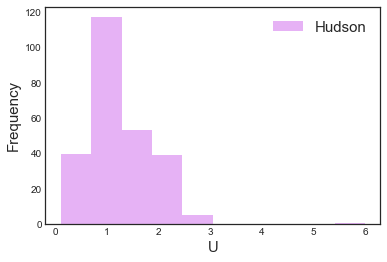

Volcán Yate without information for Magnitud
Volcán Yate without information for Edad


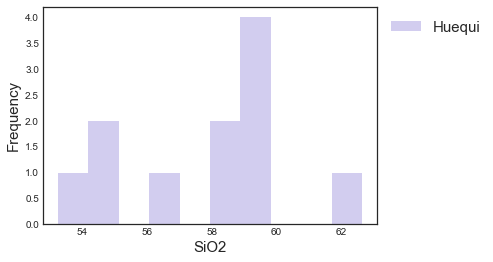

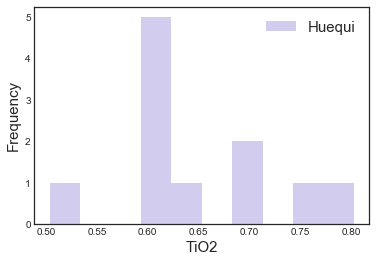

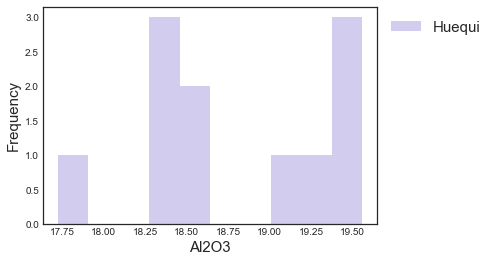

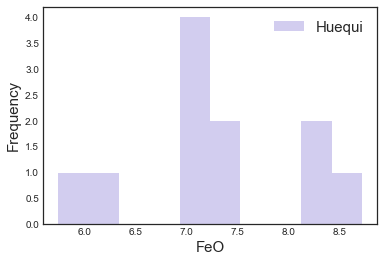

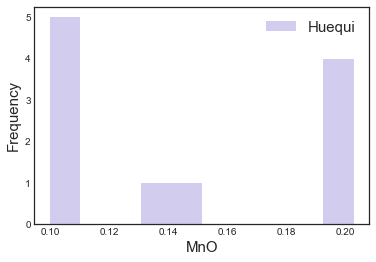

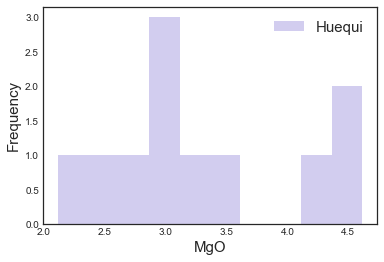

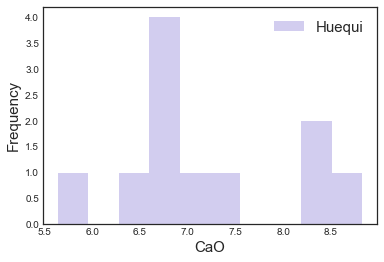

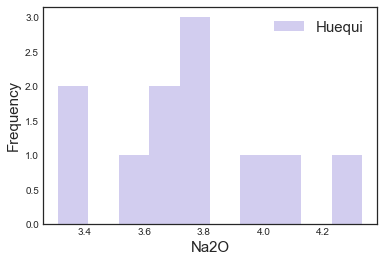

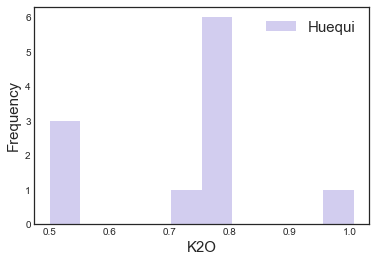

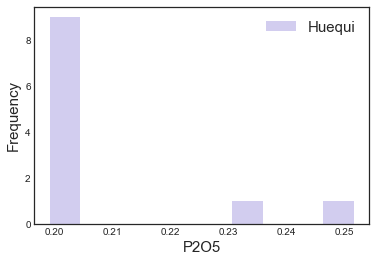

Volcán Yate without information for Cl


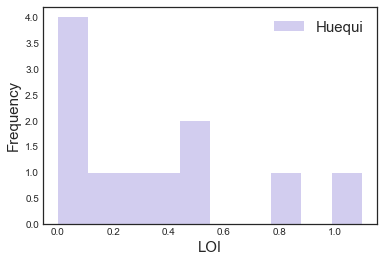

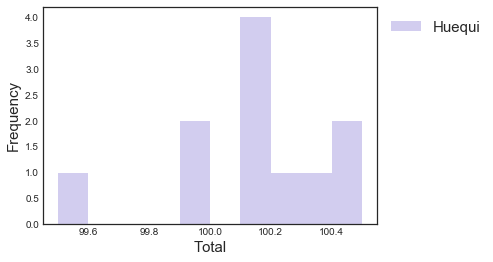

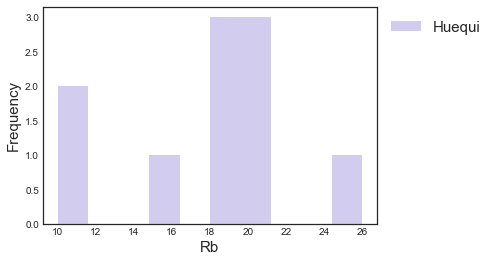

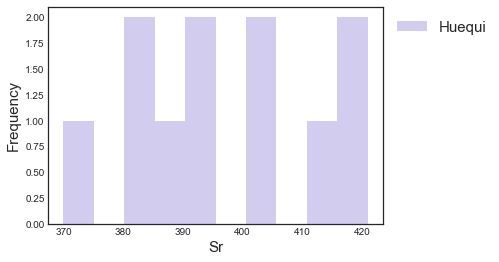

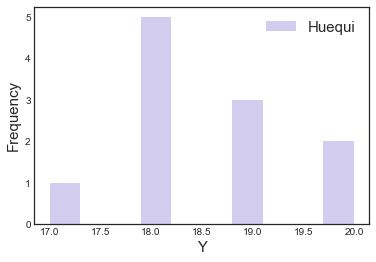

...

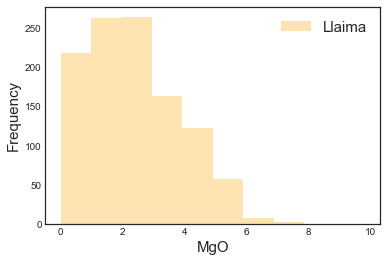

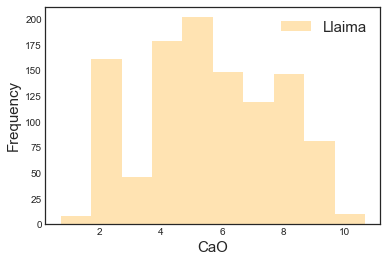

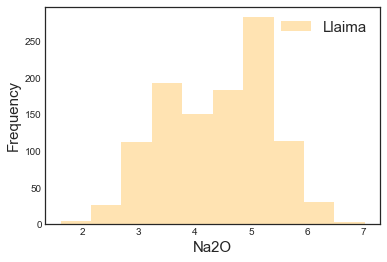

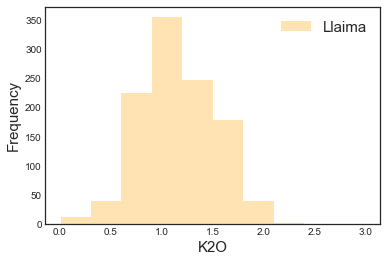

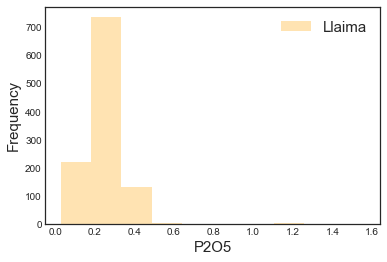

Volcán Yate without information for Cl


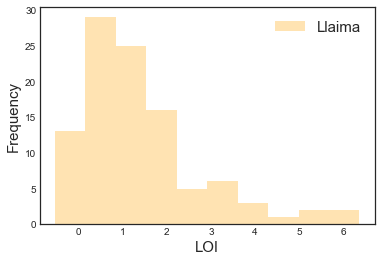

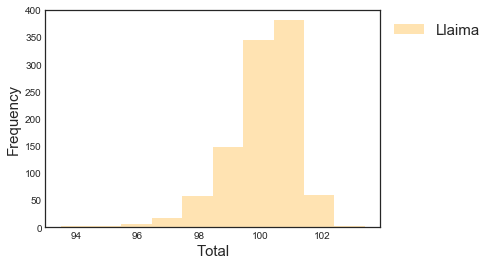

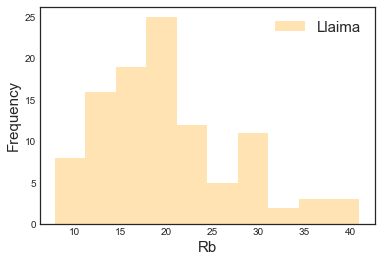

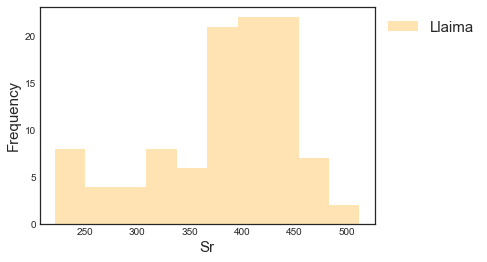

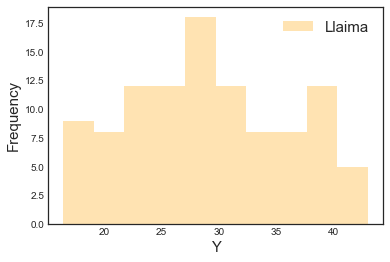

...

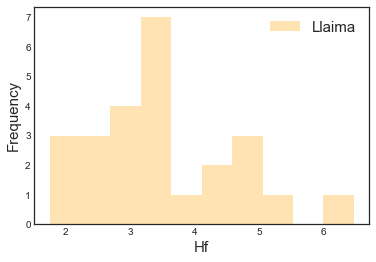

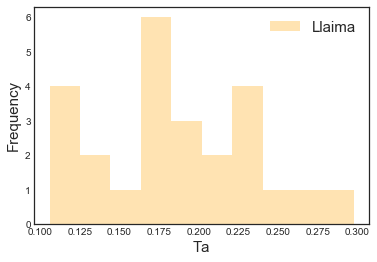

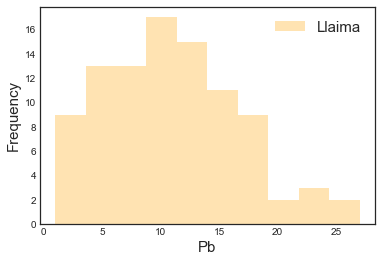

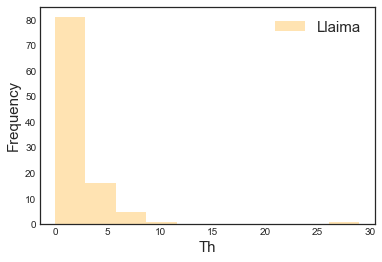

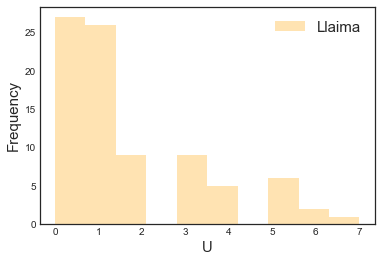

Volcán Yate without information for Magnitud


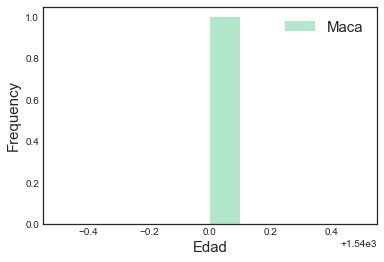

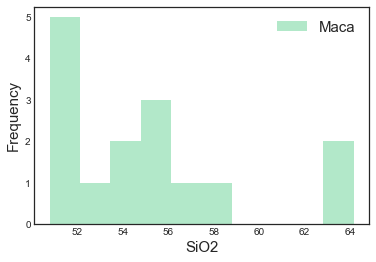

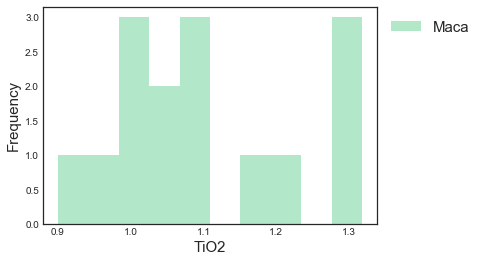

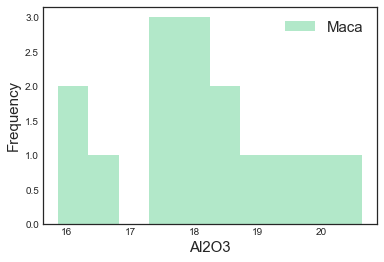

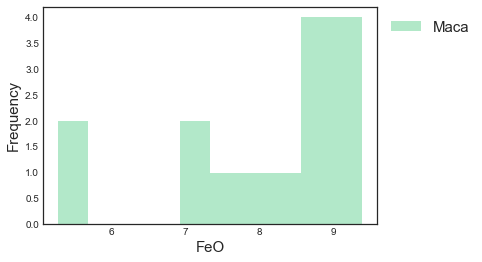

...

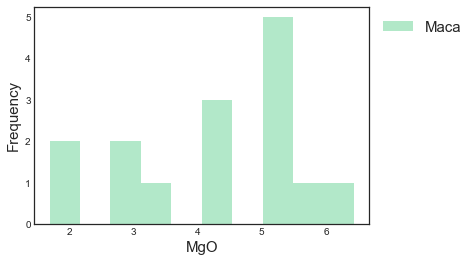

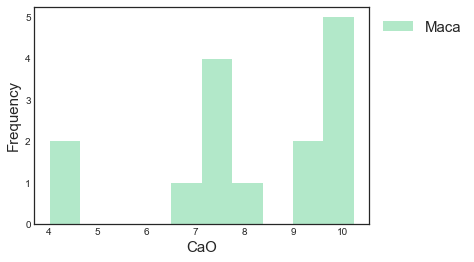

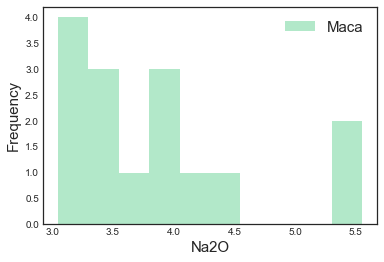

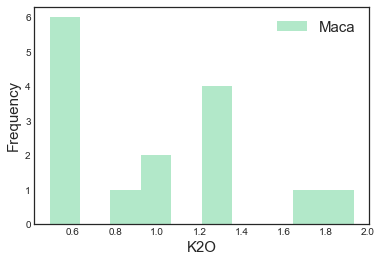

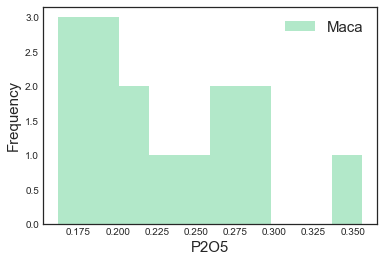

Volcán Yate without information for Cl


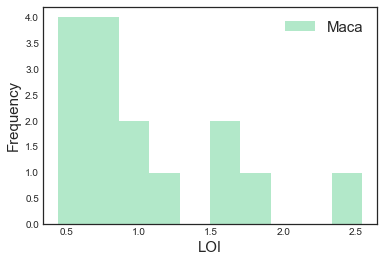

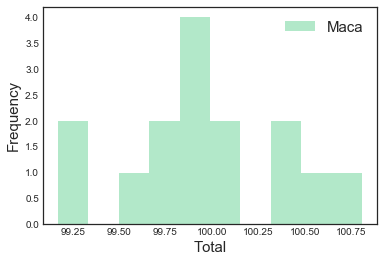

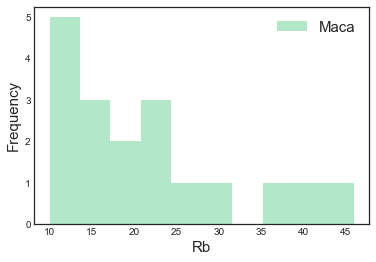

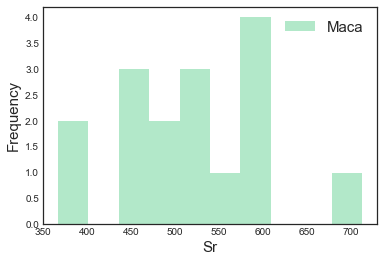

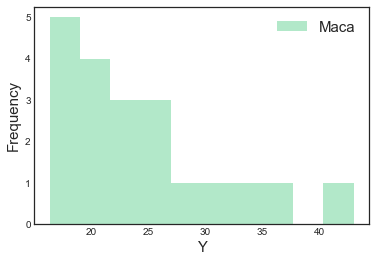

...

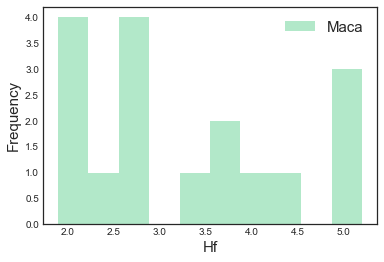

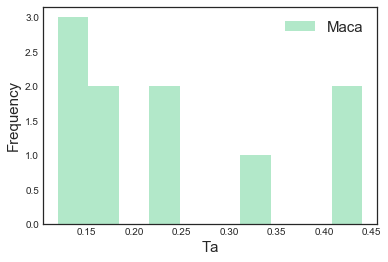

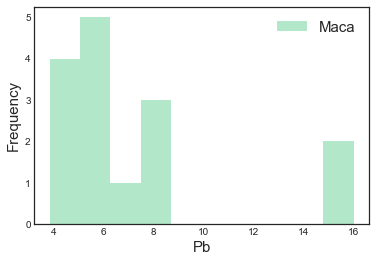

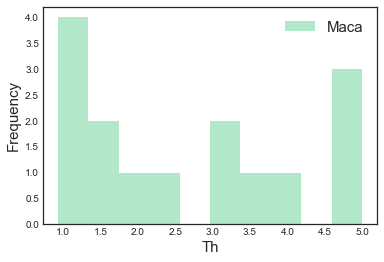

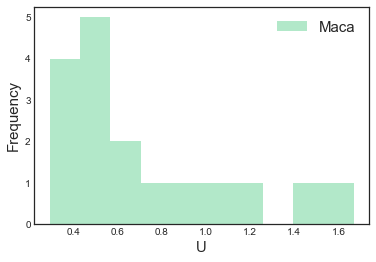

Volcán Yate without information for Magnitud


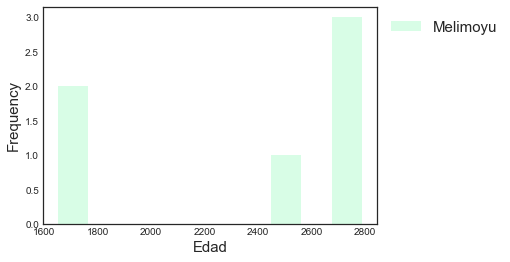

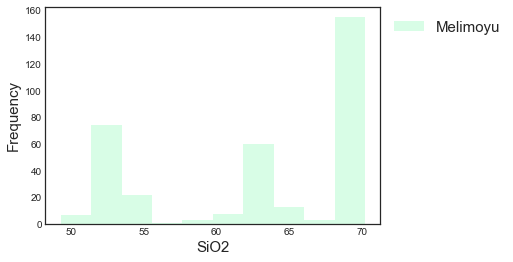

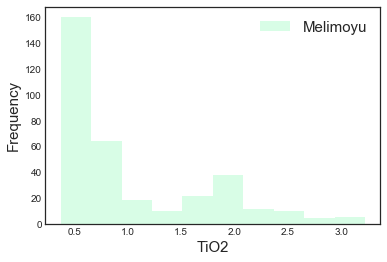

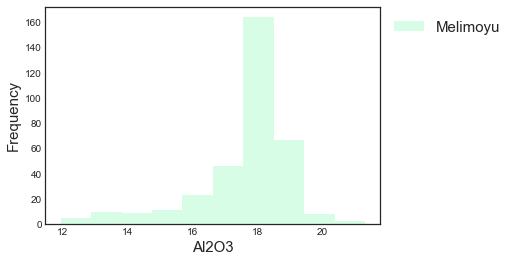

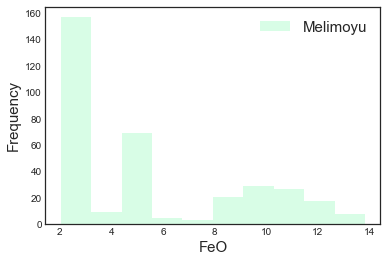

...

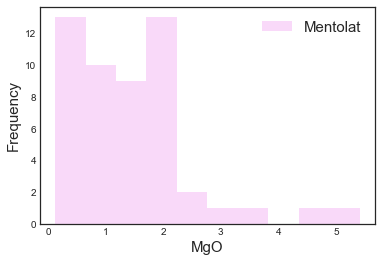

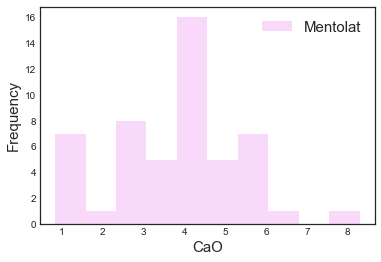

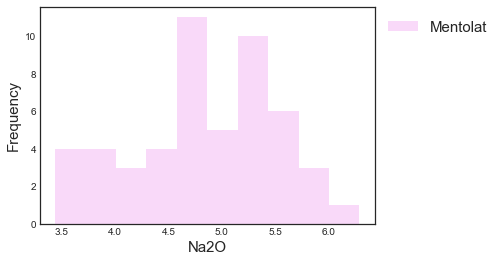

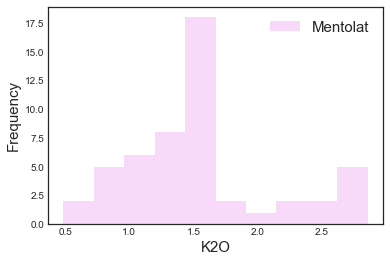

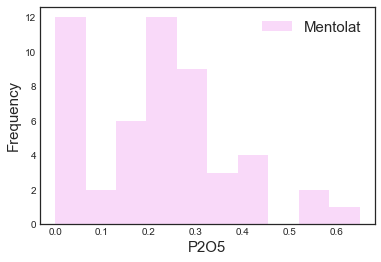

Volcán Yate without information for Cl


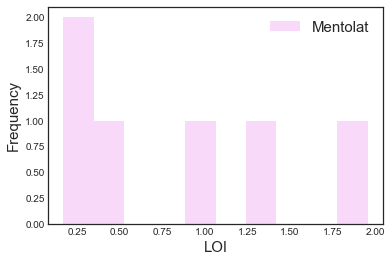

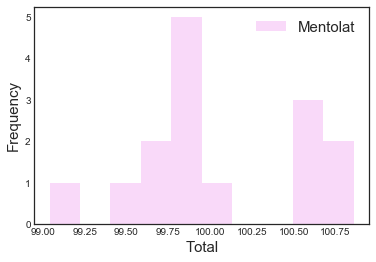

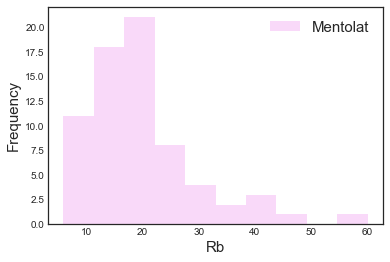

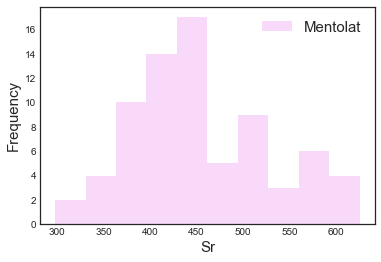

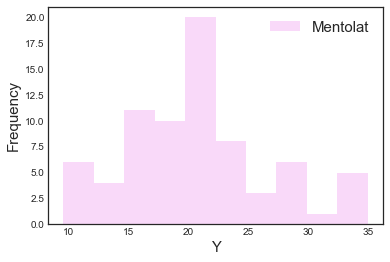

...

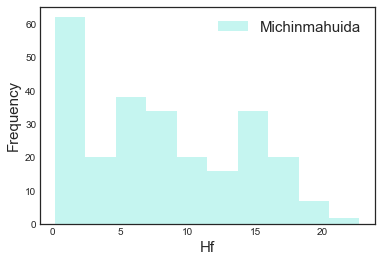

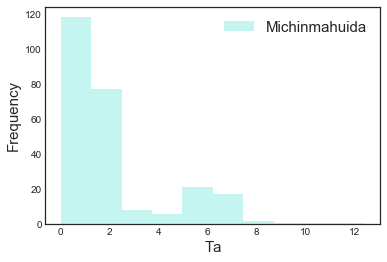

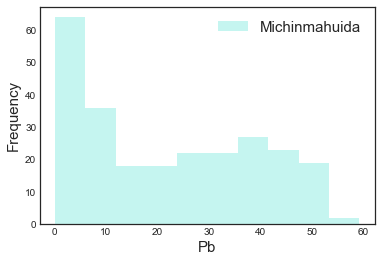

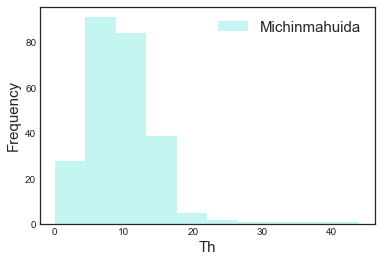

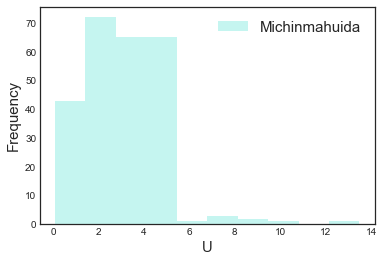

Volcán Yate without information for Magnitud
Volcán Yate without information for Edad


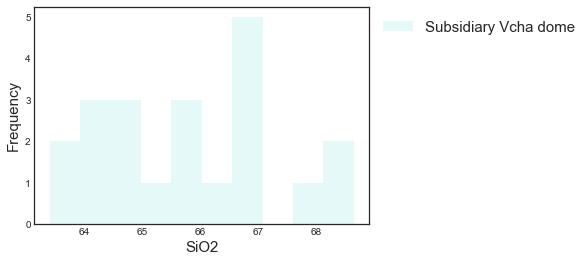

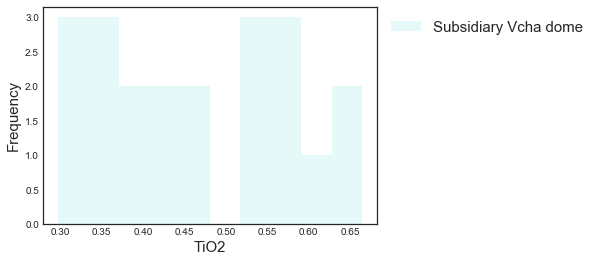

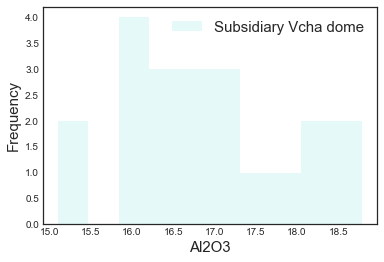

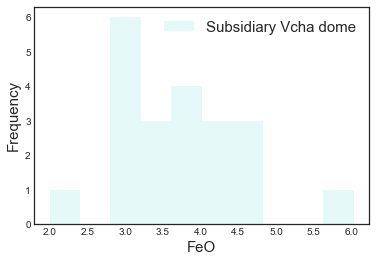

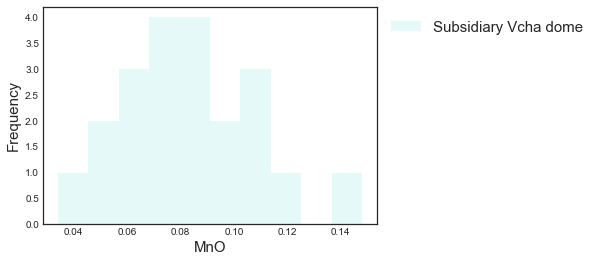

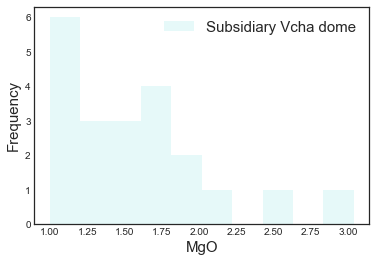

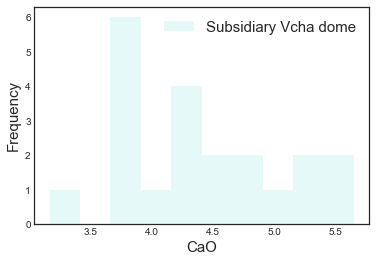

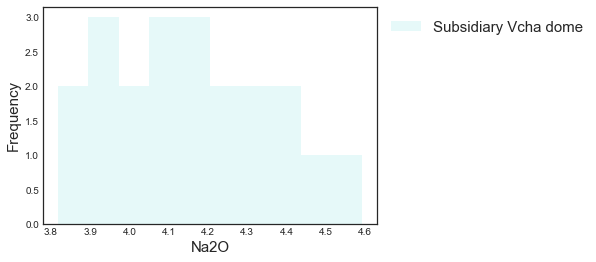

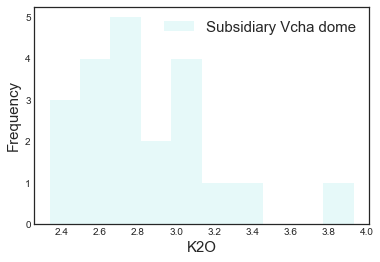

Volcán Yate without information for P2O5


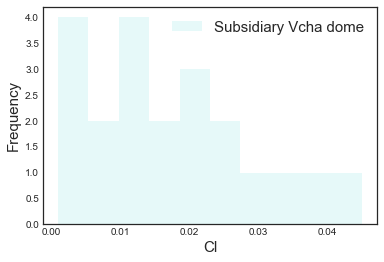

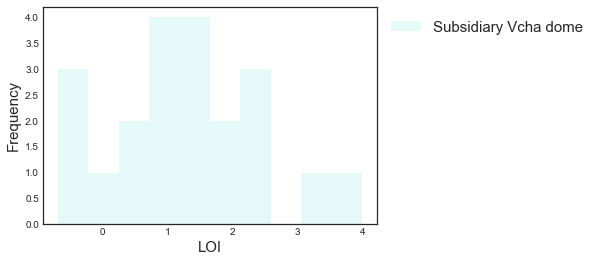

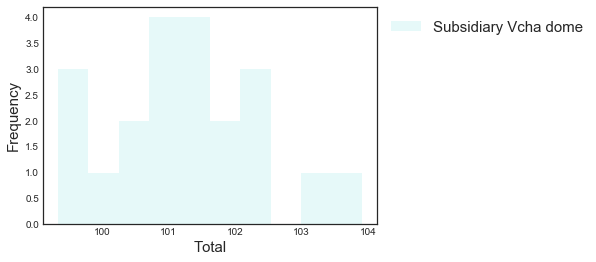

Volcán Yate without information for Rb
Volcán Yate without information for Sr
Volcán Yate without information for Y
Volcán Yate without information for Zr
Volcán Yate without information for Nb
Volcán Yate without information for Cs
Volcán Yate without information for Ba
Volcán Yate without information for La
Volcán Yate without information for Ce
Volcán Yate without information for Pr
Volcán Yate without information for Nd
Volcán Yate without information for Sm
Volcán Yate without information for Eu
Volcán Yate without information for Gd
Volcán Yate without information for Tb
Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm
Volcán Yate without information for Yb
Volcán Yate without information for Lu
Volcán Yate without information for Hf
Volcán Yate without information for Ta
Volcán Yate without information for Pb
Volcán Yate without information for Th
Volcán Yate without inform

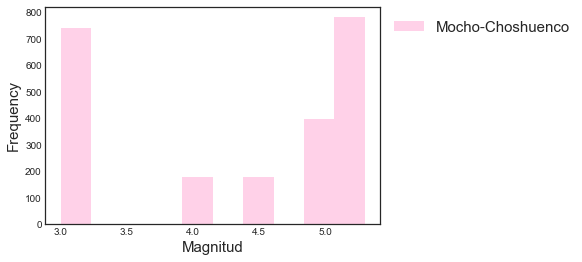

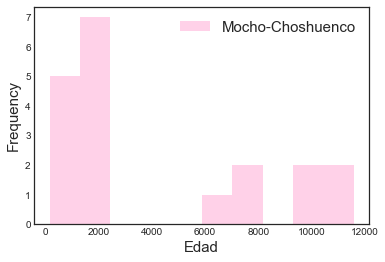

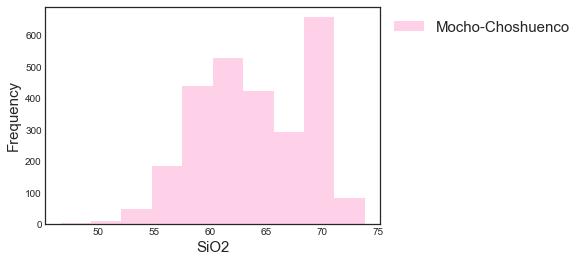

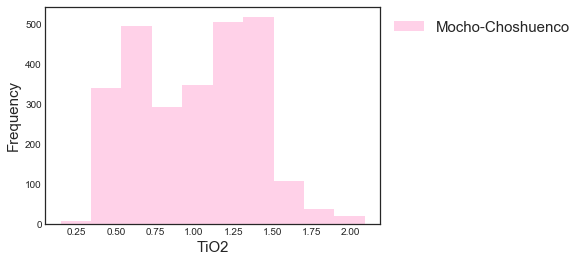

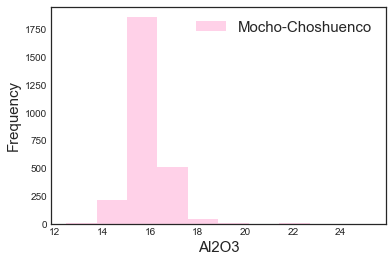

...

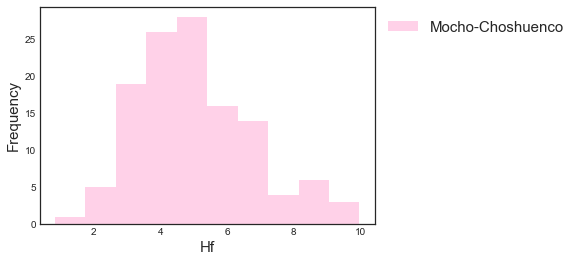

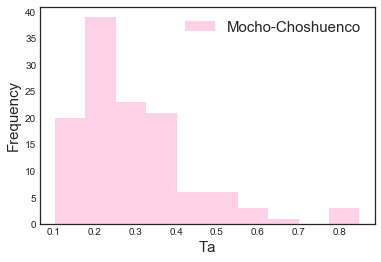

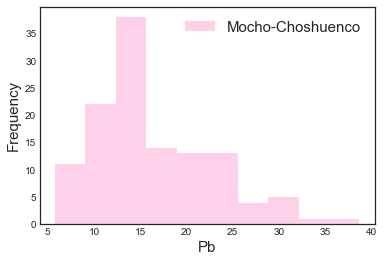

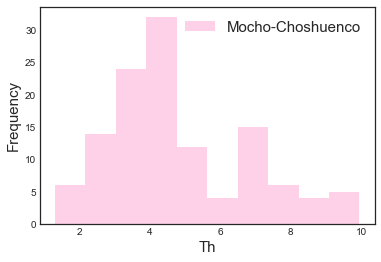

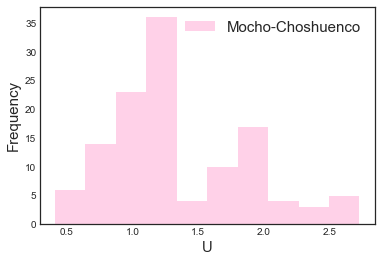

Volcán Yate without information for Magnitud


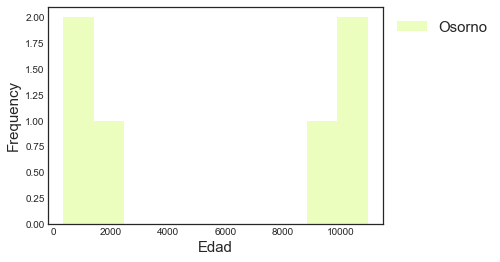

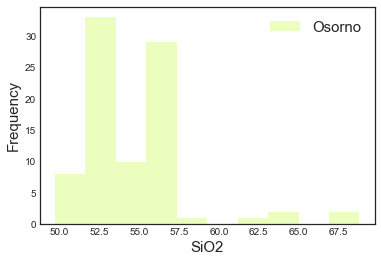

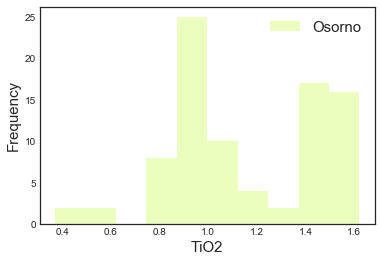

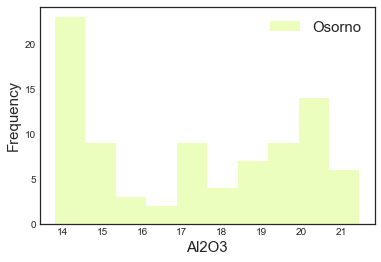

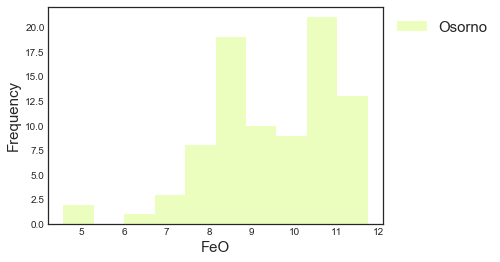

...

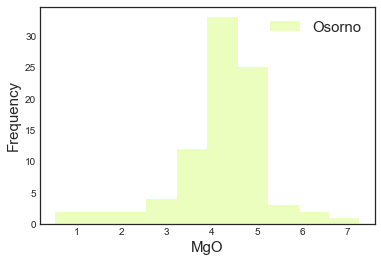

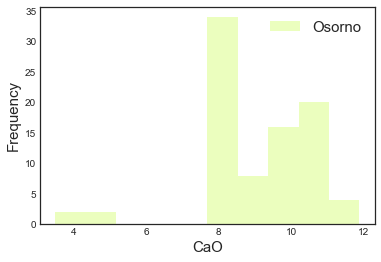

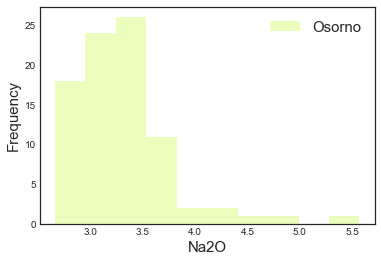

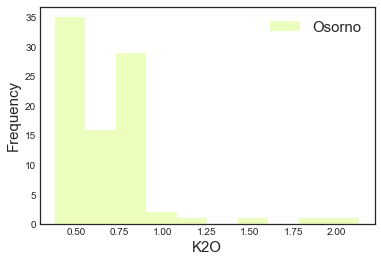

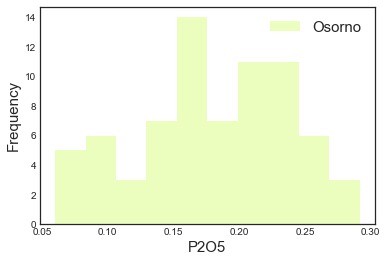

Volcán Yate without information for Cl


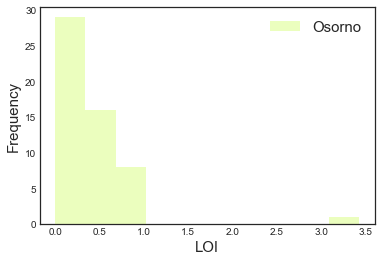

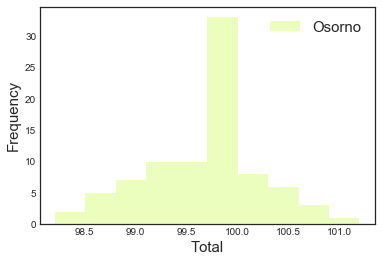

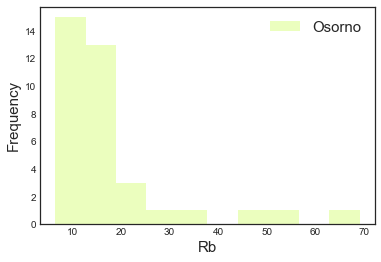

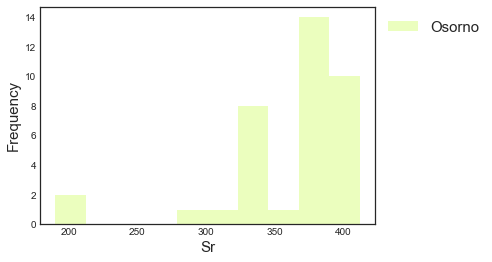

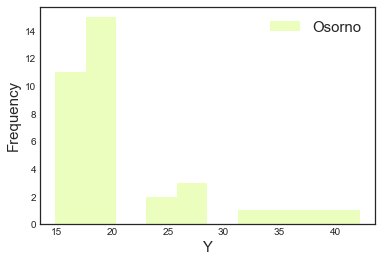

...

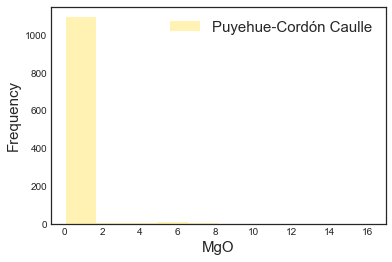

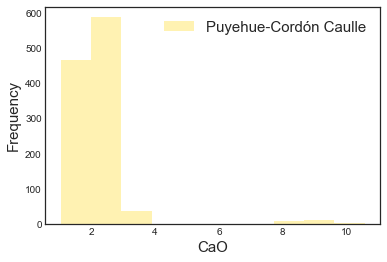

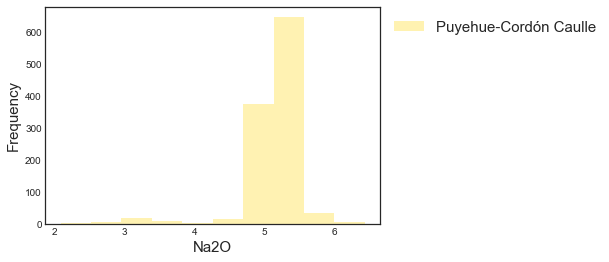

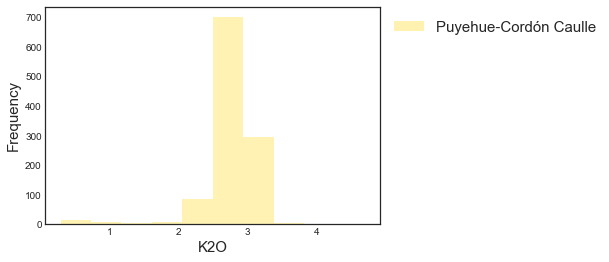

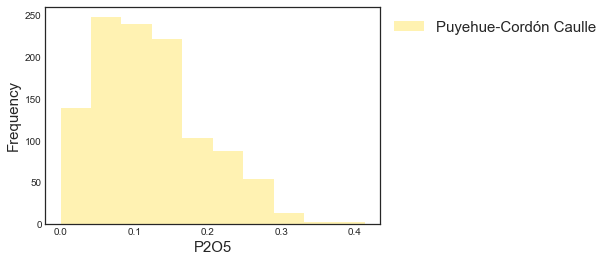

Volcán Yate without information for Cl


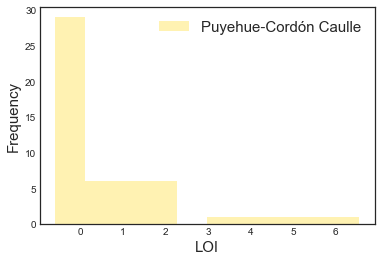

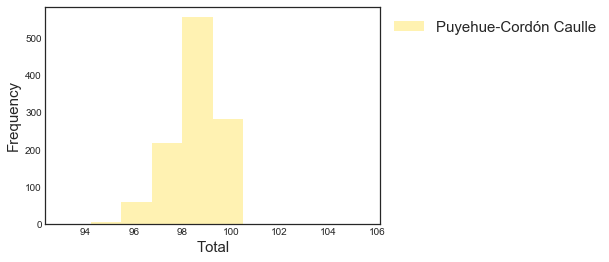

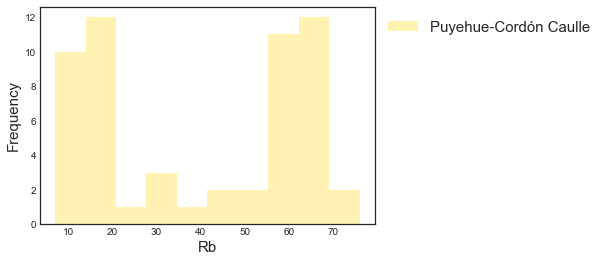

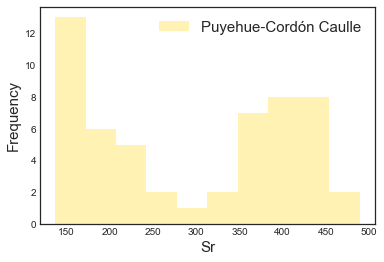

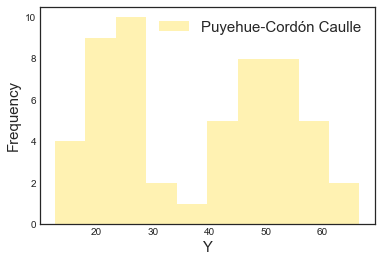

...

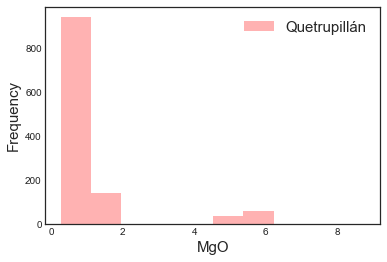

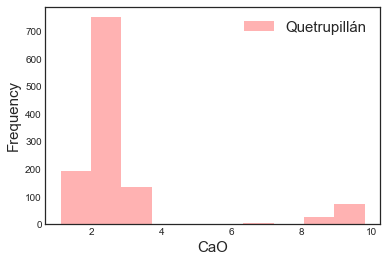

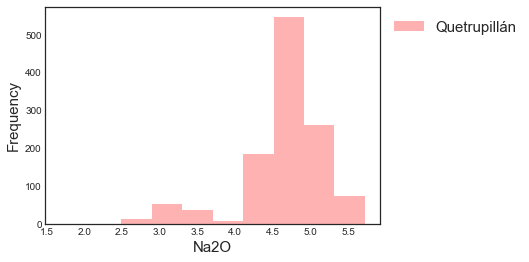

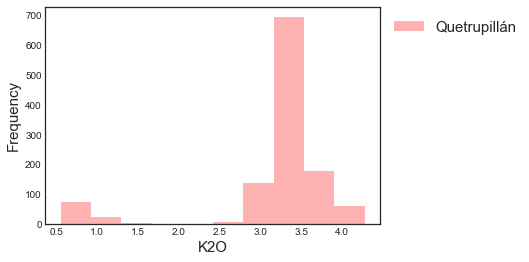

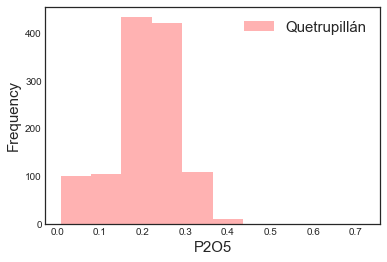

Volcán Yate without information for Cl


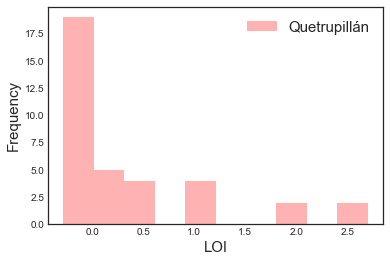

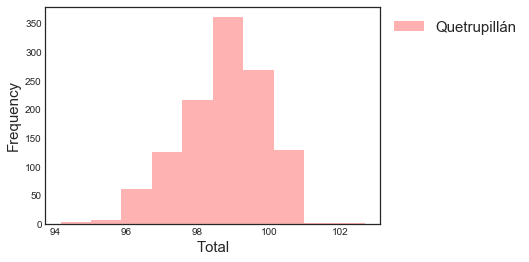

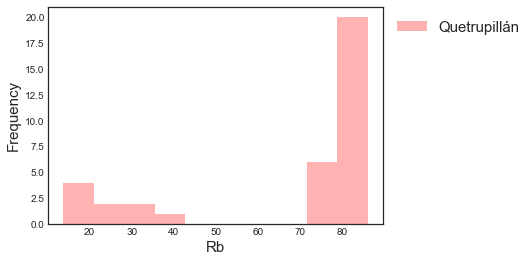

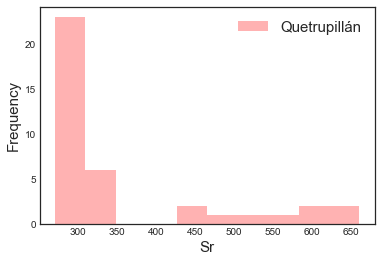

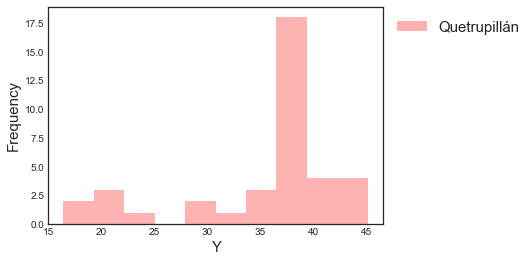

...

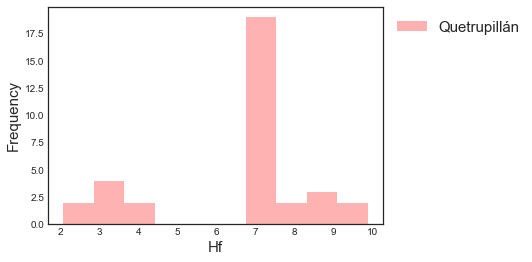

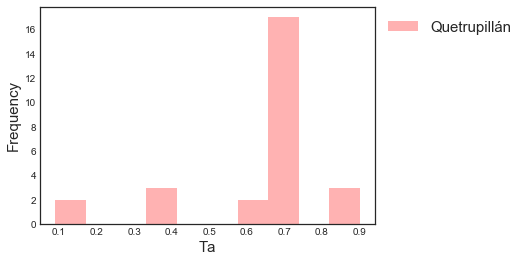

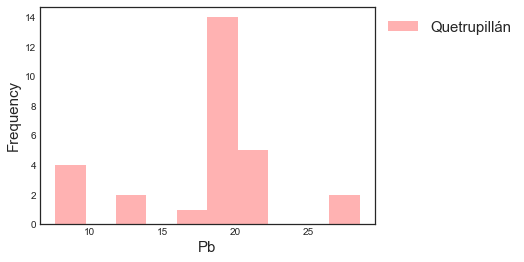

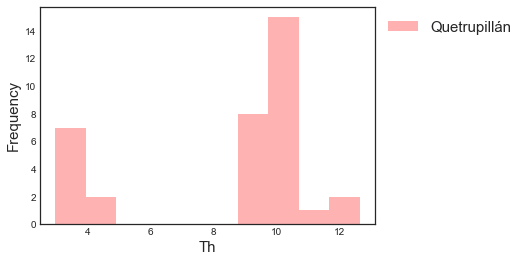

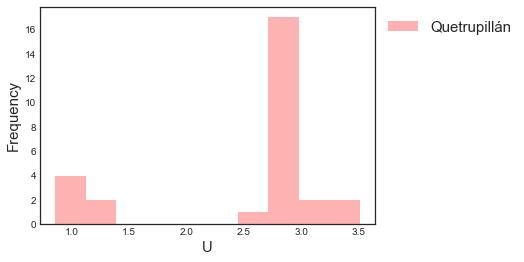

Volcán Yate without information for Magnitud


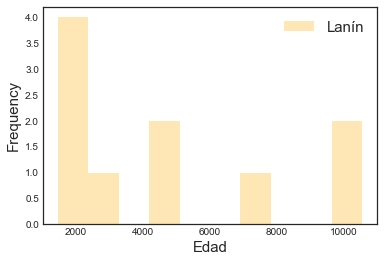

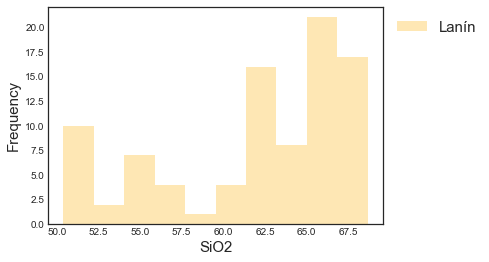

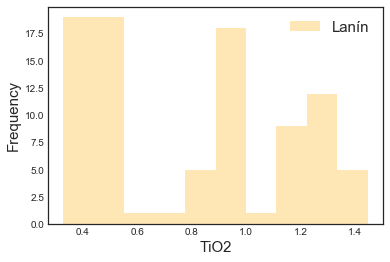

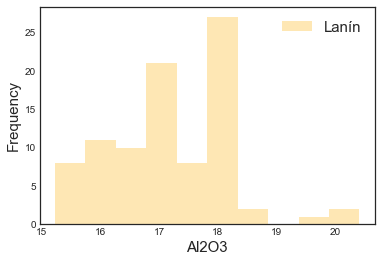

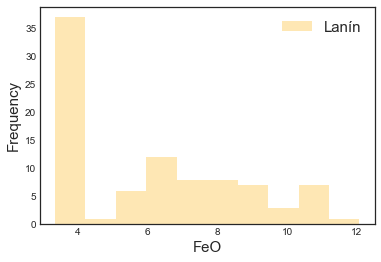

...

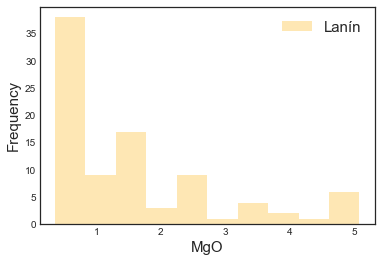

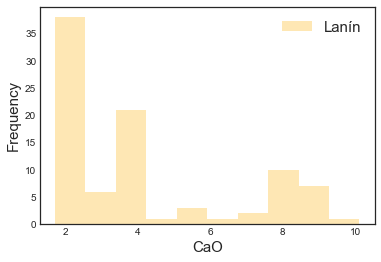

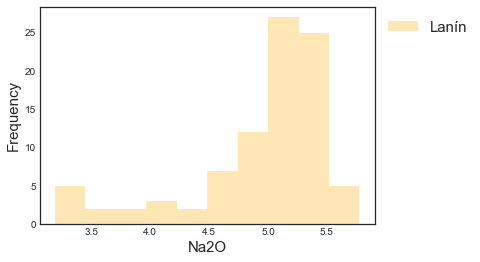

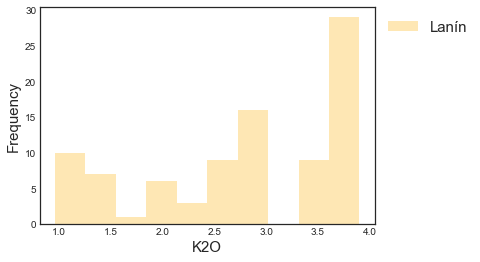

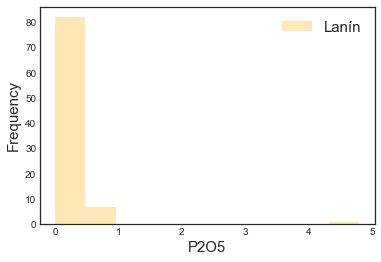

Volcán Yate without information for Cl


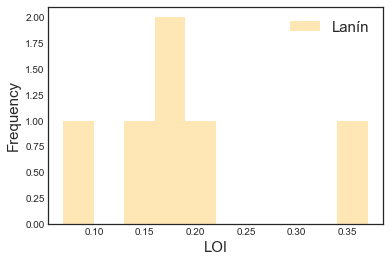

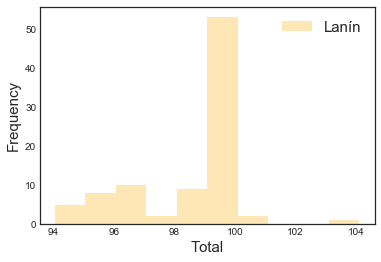

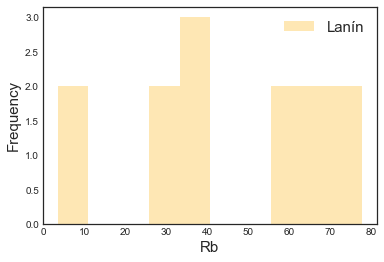

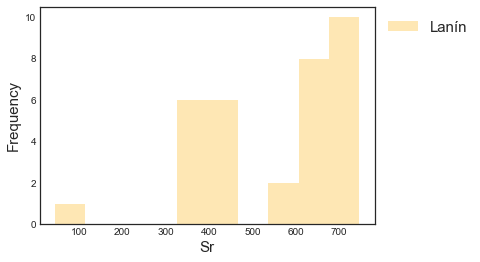

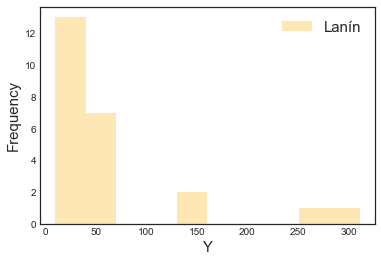

...

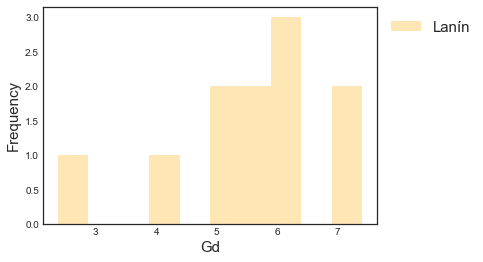

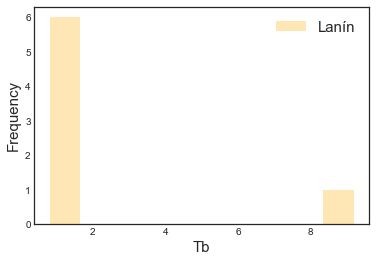

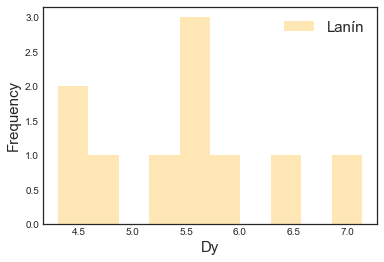

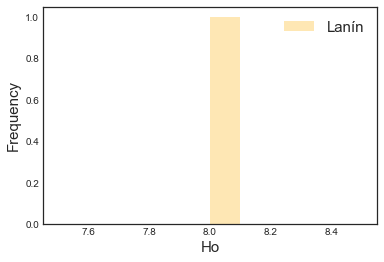

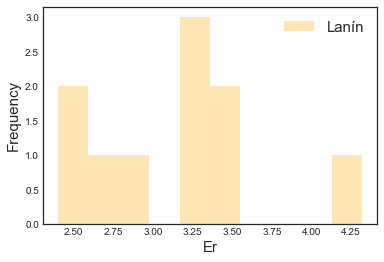

Volcán Yate without information for Tm


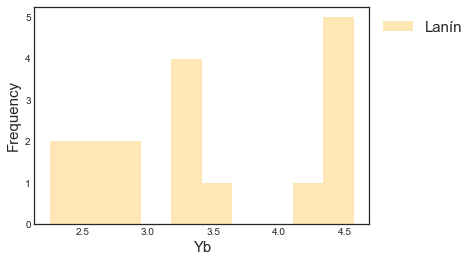

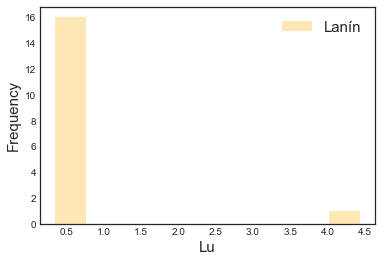

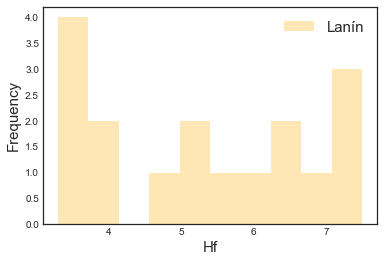

Volcán Yate without information for Ta
Volcán Yate without information for Pb


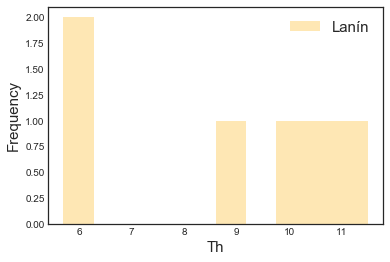

Volcán Yate without information for U


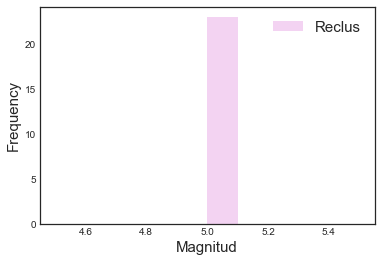

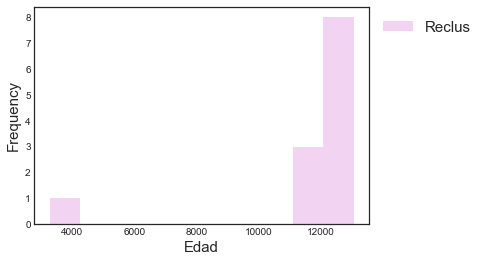

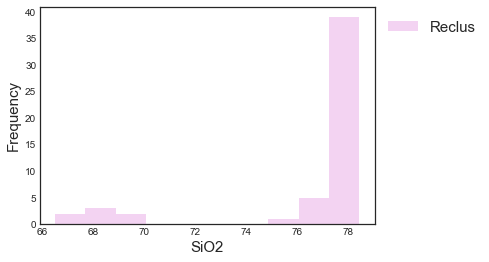

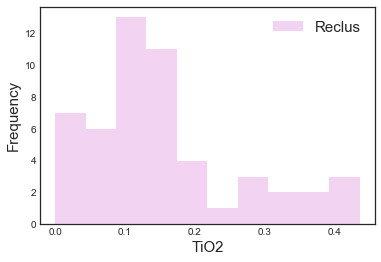

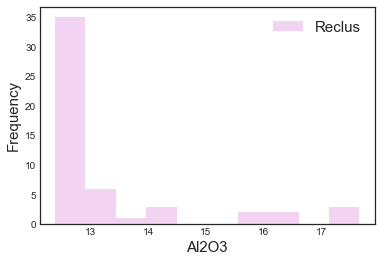

...

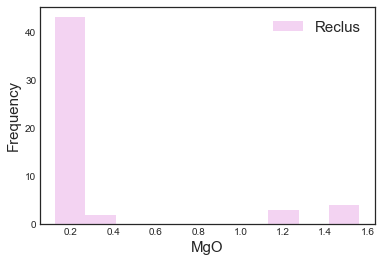

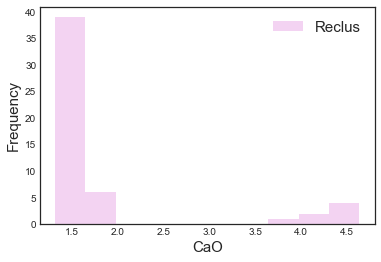

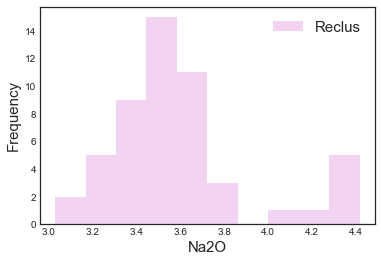

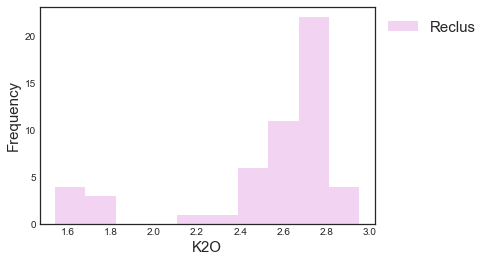

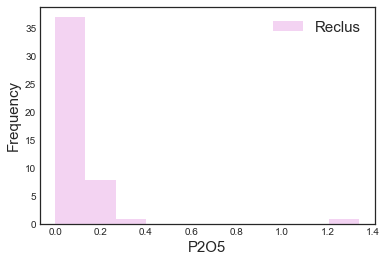

Volcán Yate without information for Cl
Volcán Yate without information for LOI
Volcán Yate without information for Total


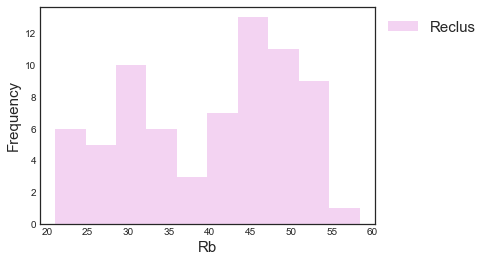

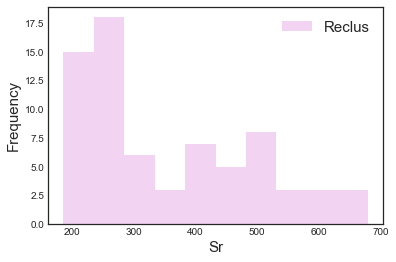

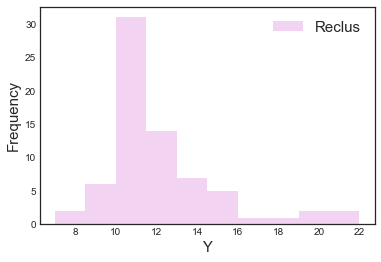

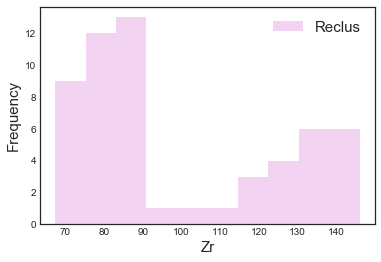

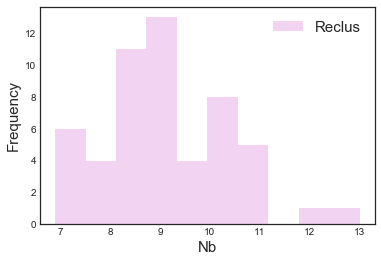

...

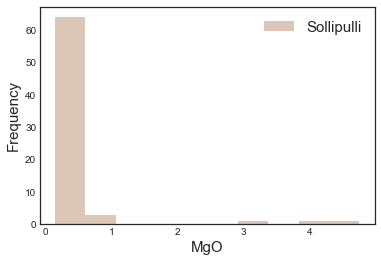

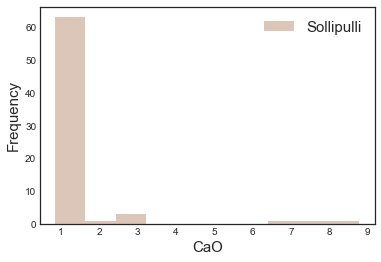

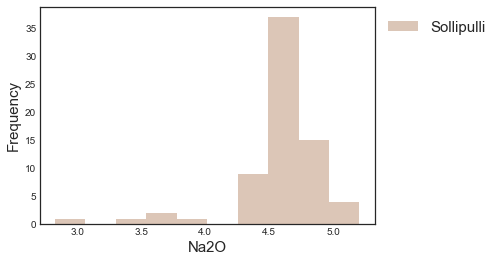

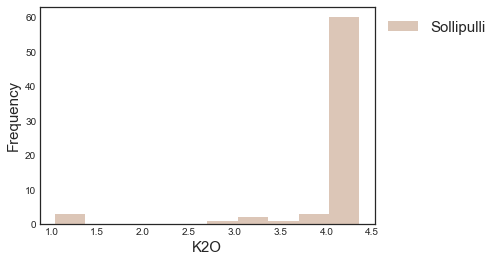

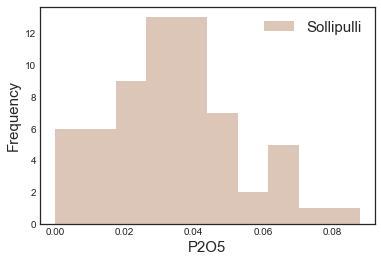

Volcán Yate without information for Cl
Volcán Yate without information for LOI


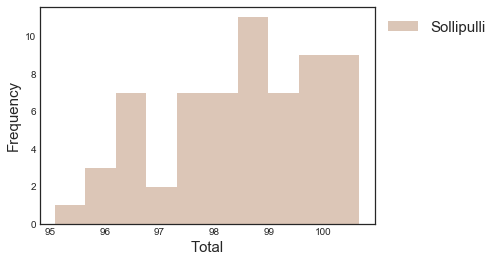

Volcán Yate without information for Rb
Volcán Yate without information for Sr
Volcán Yate without information for Y
Volcán Yate without information for Zr
Volcán Yate without information for Nb
Volcán Yate without information for Cs
Volcán Yate without information for Ba
Volcán Yate without information for La
Volcán Yate without information for Ce
Volcán Yate without information for Pr
Volcán Yate without information for Nd
Volcán Yate without information for Sm
Volcán Yate without information for Eu
Volcán Yate without information for Gd
Volcán Yate without information for Tb
Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm
Volcán Yate without information for Yb
Volcán Yate without information for Lu
Volcán Yate without information for Hf
Volcán Yate without information for Ta
Volcán Yate without information for Pb
Volcán Yate without information for Th
Volcán Yate without inform

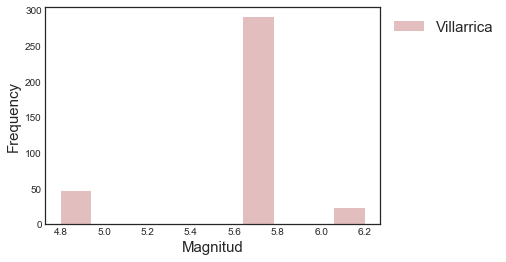

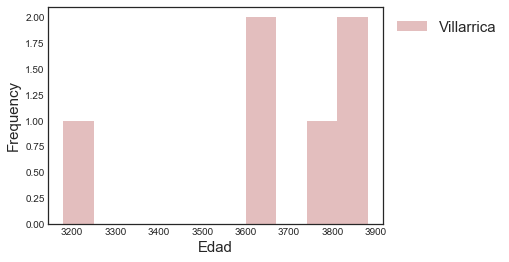

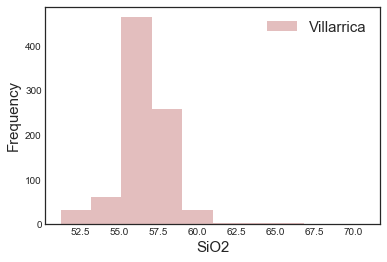

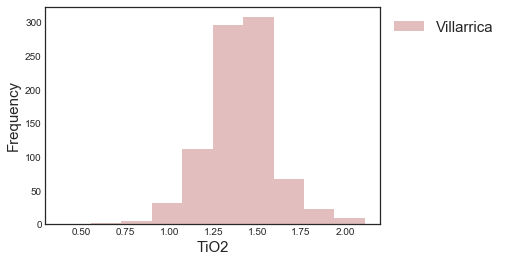

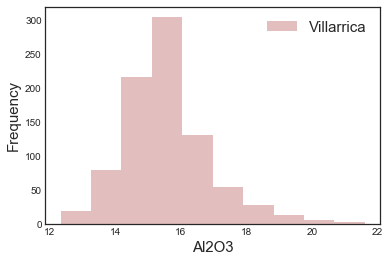

...

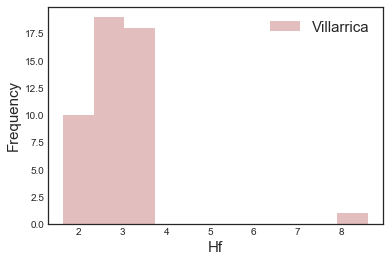

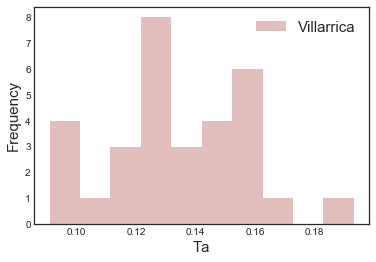

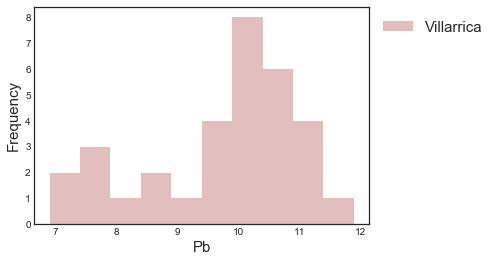

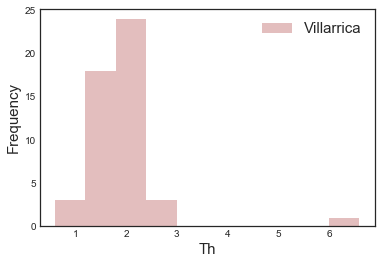

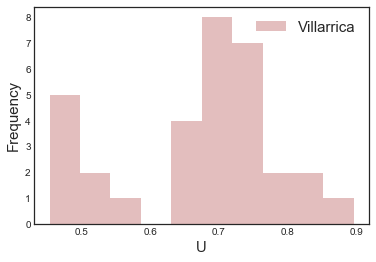

Volcán Yate without information for Magnitud


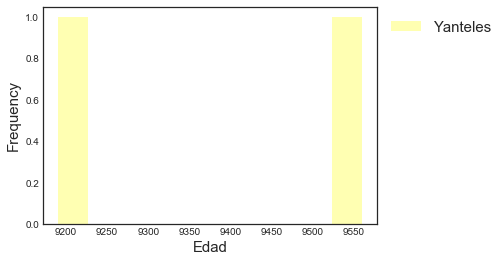

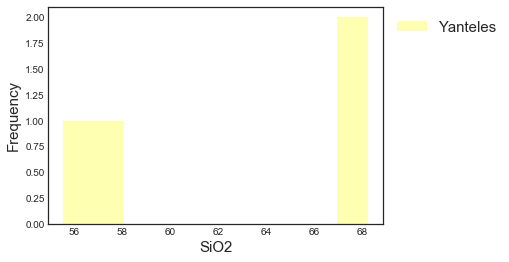

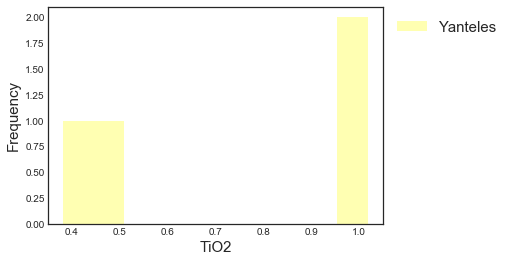

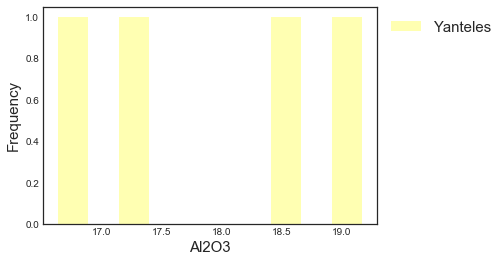

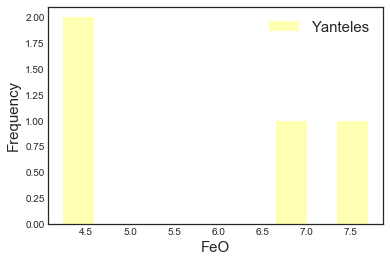

...

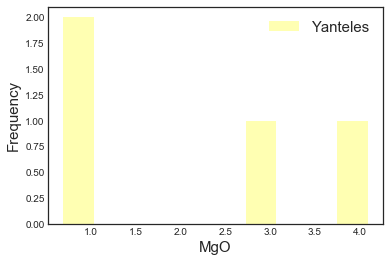

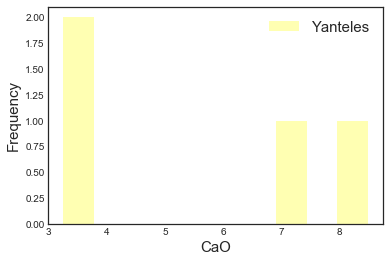

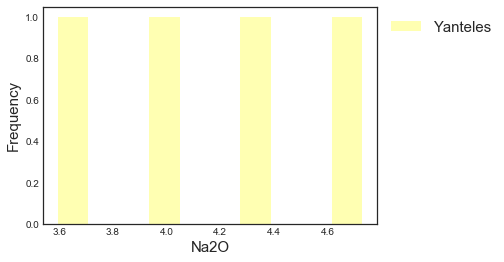

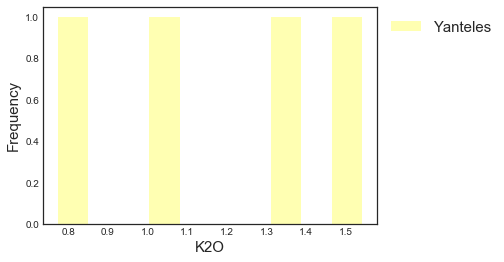

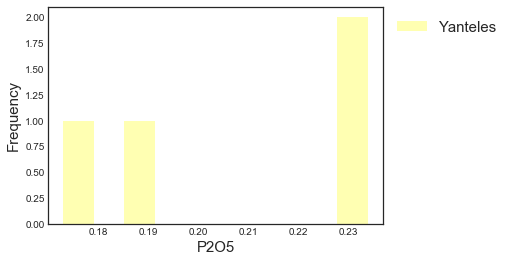

Volcán Yate without information for Cl


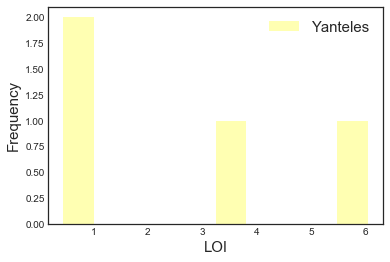

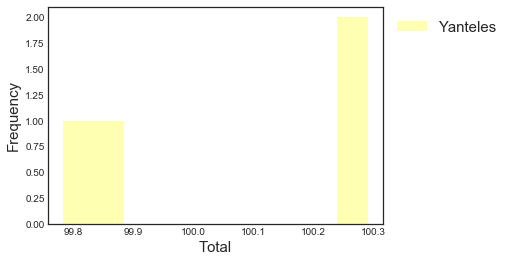

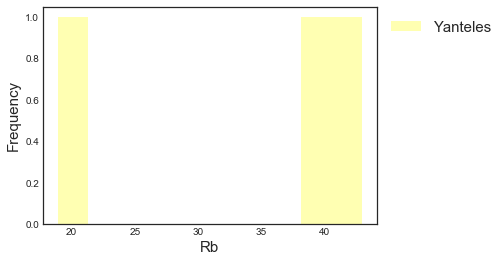

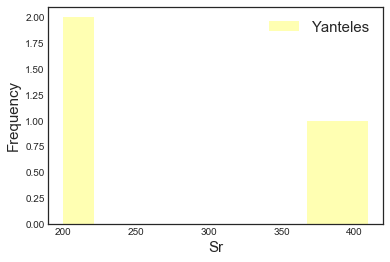

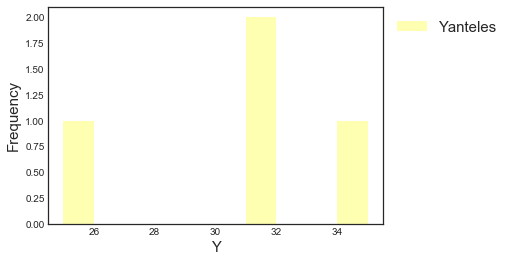

...

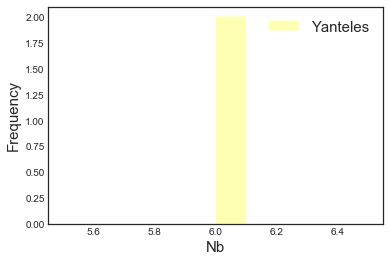

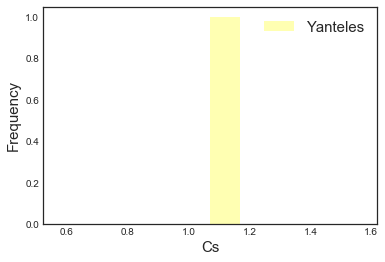

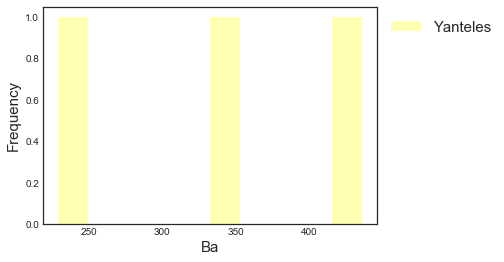

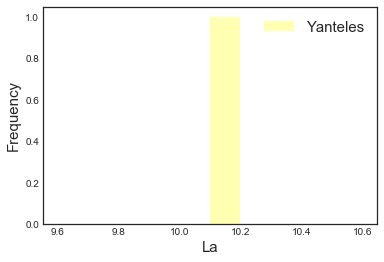

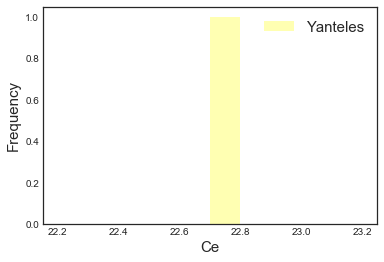

Volcán Yate without information for Pr


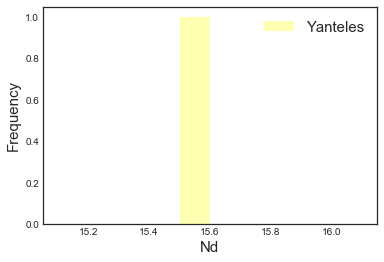

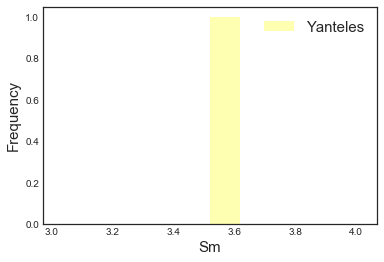

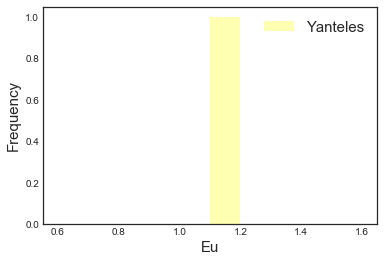

Volcán Yate without information for Gd


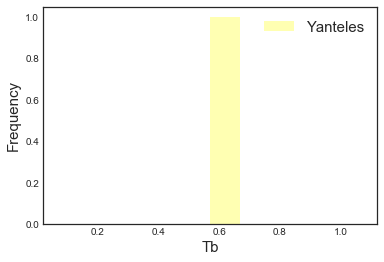

Volcán Yate without information for Dy
Volcán Yate without information for Ho
Volcán Yate without information for Er
Volcán Yate without information for Tm


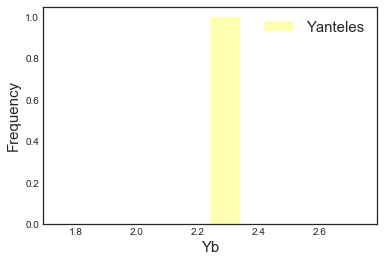

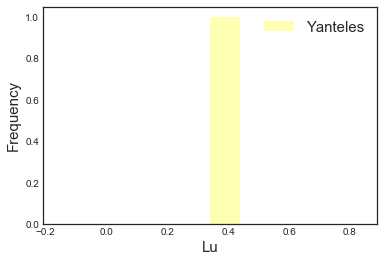

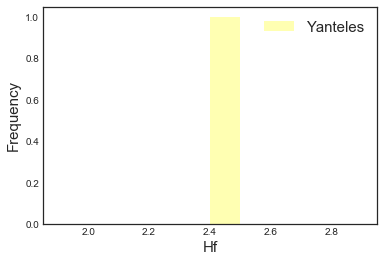

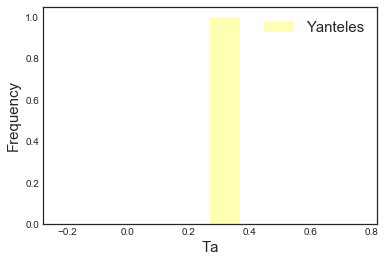

Volcán Yate without information for Pb


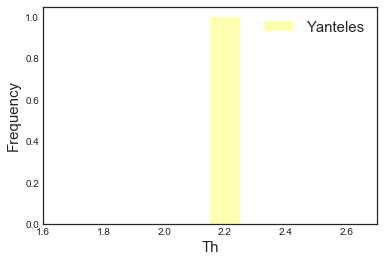

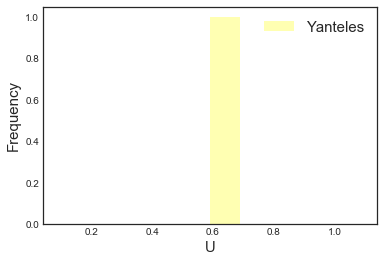

Volcán Yate without information for Magnitud


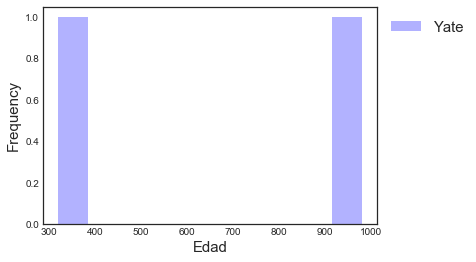

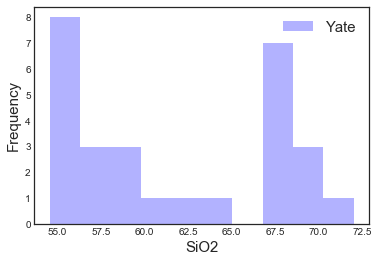

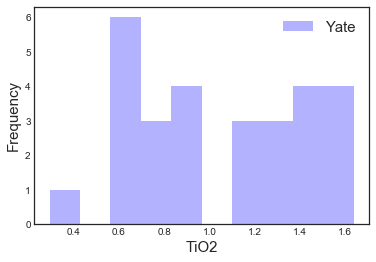

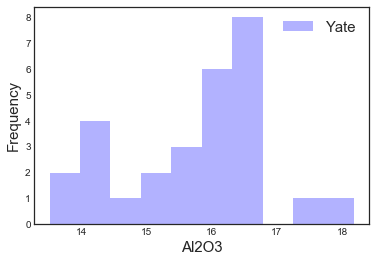

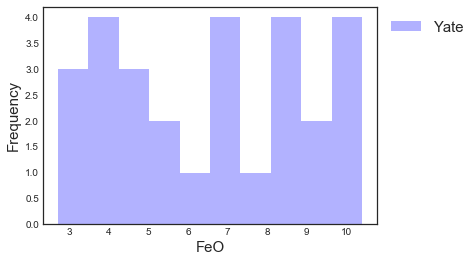

...

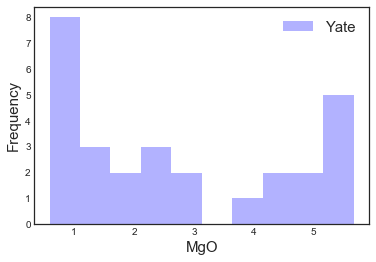

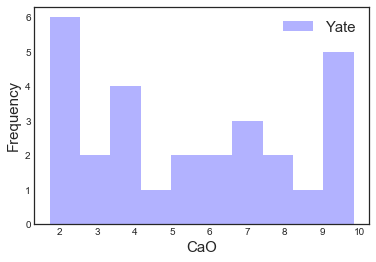

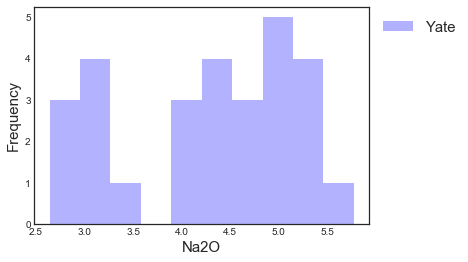

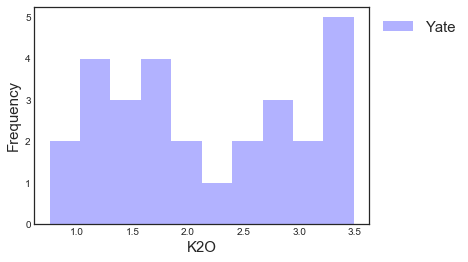

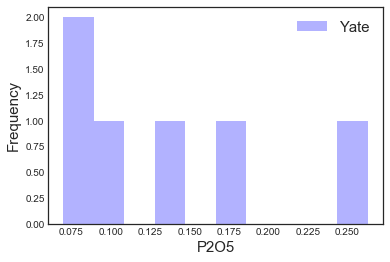

Volcán Yate without information for Cl


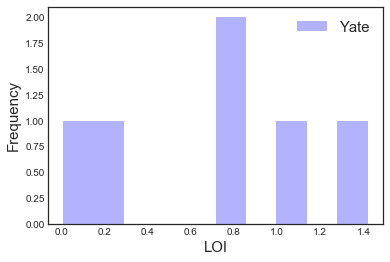

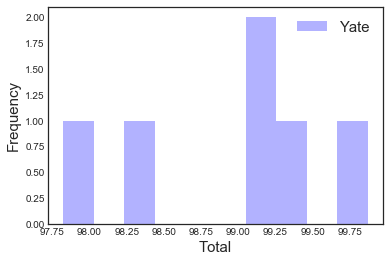

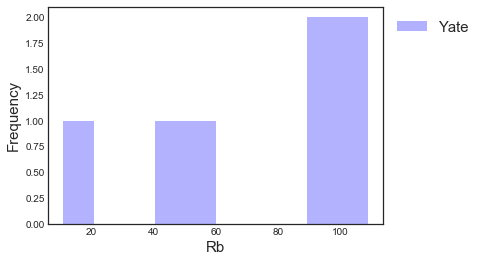

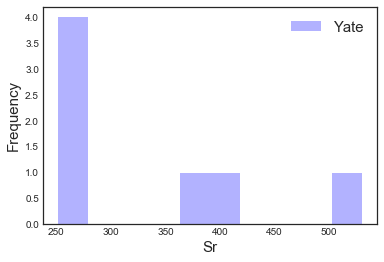

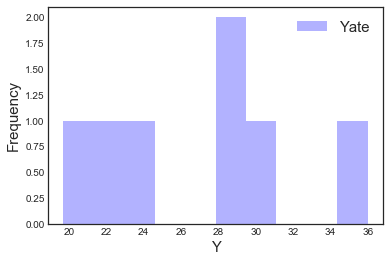

...

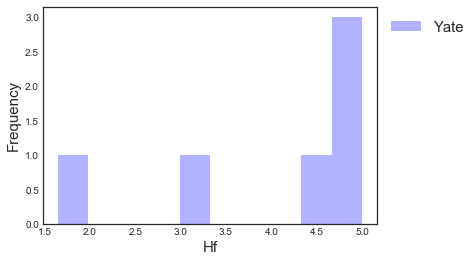

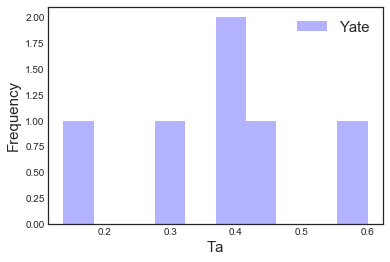

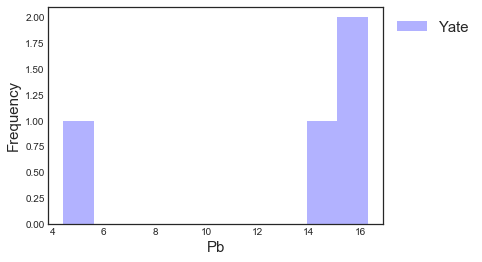

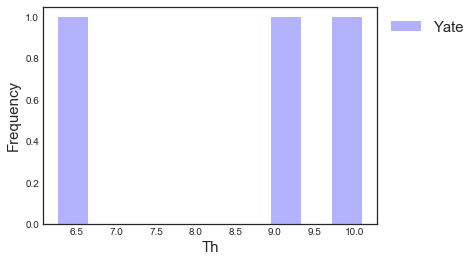

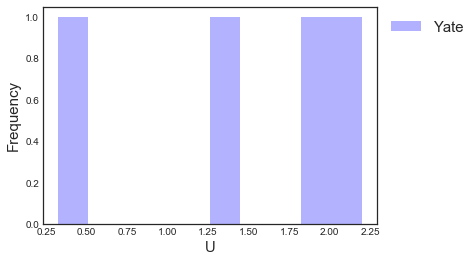

In [67]:
DatA = Data_temp
volcanes = DatA['Volcan'].unique()
for volcan in volcanes:
    Data_volcan = DatA[DatA['Volcan']==volcan]

    for elemento in DatA.columns :   
        if (elemento != 'Volcan')&(elemento != 'Evento'):   
            coloR, Marker  = simbologia(volcan,'Unknown')
            if pd.isnull(Data_volcan[elemento]).all():
                print('Volcán {} without information for {}'.format(i,elemento))   
            else:
                plt.hist(Data_volcan[elemento] ,label= volcan, color = coloR, alpha= 0.3,range=(np.nanmin(Data_volcan[elemento]), np.nanmax(Data_volcan[elemento])))  
                plt.xlabel(elemento, fontsize=15)
                plt.ylabel('Frequency', fontsize=15)
                plt.legend(bbox_to_anchor=(1,1),ncol=2, fontsize=15)
                plt.show()

# Explore data by blocks of measurements

Broadly, three types of measurements are included in the data base: Mayor elements, Trace elements and Age. This information is provided by the function MissingMechanisms in functions.py. The functions takes some time to compute so after running it, the reesult is stored in ../xlsx

In [3]:
Data = pd.read_excel("../TephraDataBase.xlsx")
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('n.a.',np.nan);Data = Data.replace('<0.01',np.nan);Data = Data.replace('<0.1',np.nan)
Data_MM = MissingMechanism(Data)

../Scripts\funciones.py:429: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  Data['MissingMechanism'][i] = 'Ambos'
../Scripts\funciones.py:431: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  Data['MissingMechanism'][i] = 'Edad'
../Scripts\funciones.py:425: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  Data['MissingMechanism'][i] = 'Mayores'
../Scripts\funciones.py:427: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

In [4]:
Data_MM.to_excel("../xlsx/Data_MM.xlsx")

## Mayor and Trace element measurements

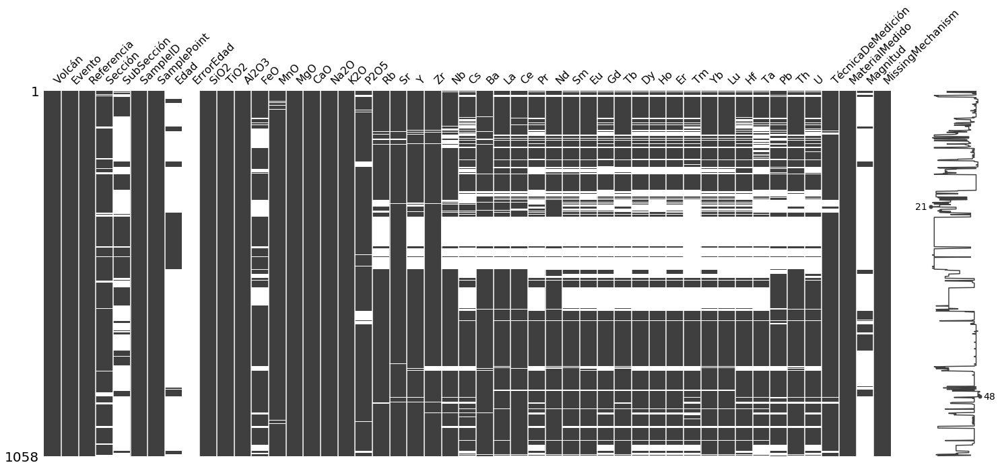

In [5]:
Data = pd.read_excel("../TephraDataBase.xlsx")
Data_MM = Data_MM.drop(['MeasurementRun','87Sr/86Sr','2SE','CodigoLaboratorioRadiocarbono','TipoDeSeccion','Comentarios','Mapa?','Flag','DescripcionFlag','Latitud','Longitud'], axis=1)
msno.matrix(Data_MM[Data_MM['MissingMechanism'] == 'Ambos'])

# Major elements measurements
Samples were most major elements were measured 

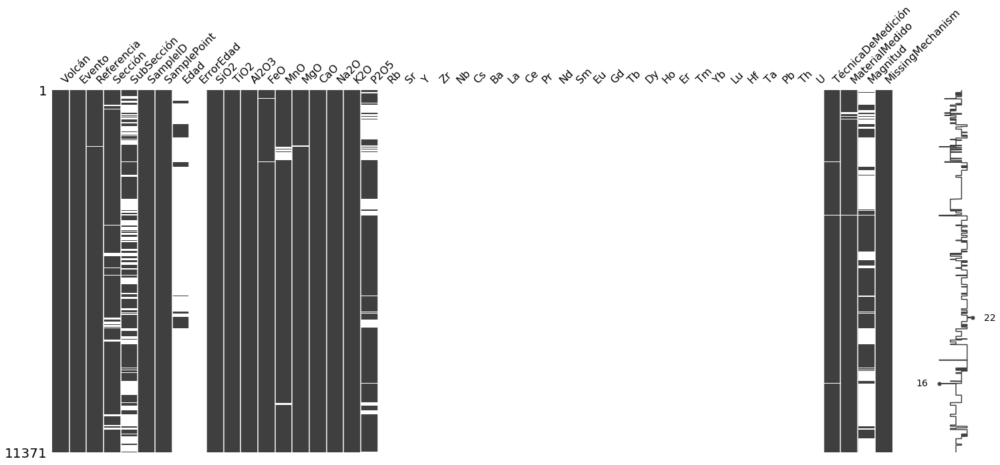

In [6]:
msno.matrix(Data_MM[Data_MM['MissingMechanism'] == 'Mayores'])

# Trace elements measurements
Samples were most trace elements were measured

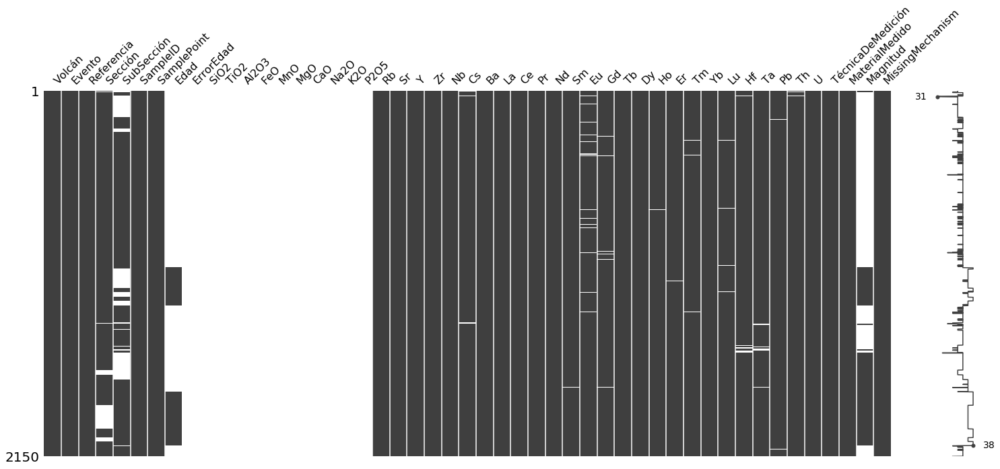

In [7]:
msno.matrix(Data_MM[Data_MM['MissingMechanism'] == 'Traza'])

# Age

This item corresponds to the samples were an age different than "Historic" was stablished based on radiocarbon measurements of organic matter above, below or inside the tephra deposit

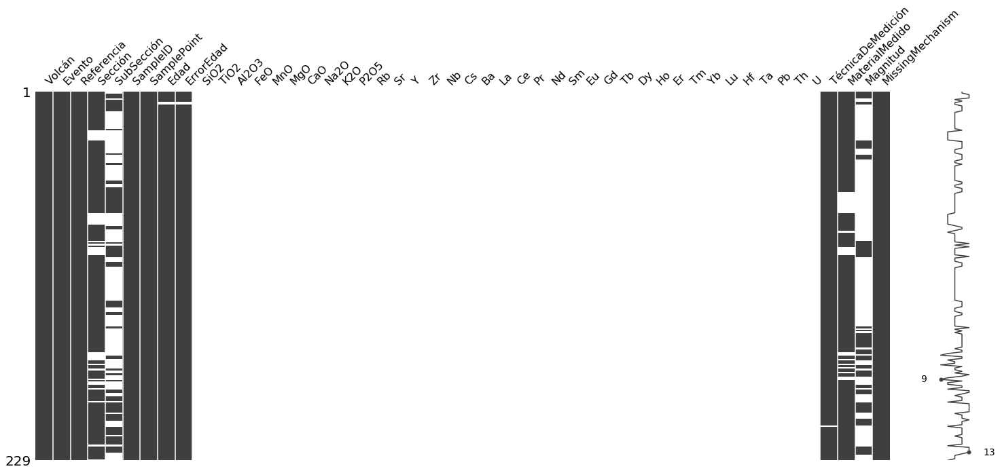

In [8]:
msno.matrix(Data_MM[Data_MM['MissingMechanism'] == 'Edad'])

# Pandas profiling

In [68]:
import pandas_profiling
import seaborn as sns

In [78]:
Data = pd.read_excel("../Data/TephraDataBase.xlsx")
Data = Data[Data.Volcan!='Unknown']
Data = Data.replace('-',np.nan);Data = Data.replace('not determined',np.nan);Data = Data.replace('Not analyzed',np.nan);Data = Data.replace('Over range',np.nan);Data = Data.replace('bdl',np.nan);Data = Data.replace('<1',np.nan);Data = Data.replace('<4',np.nan);Data = Data.replace('<6',np.nan);Data = Data.replace('<5',np.nan);Data = Data.replace('<10',np.nan);Data = Data.replace('<0.01',np.nan);Data = Data.replace('<0.1',np.nan);Data = Data.replace('n.a.',np.nan)
Data = Data.drop(['Edad','ErrorEdad','Magnitud','SampleID','SamplePoint','Total','LOI','Seccion','SubSeccion','MeasurementRun','87Sr/86Sr','2SE','CodigoLaboratorioRadiocarbono','Comentarios','Mapa?','Flag','DescripcionFlag','Latitud','Longitud'], axis=1)
Data['ZrNb'] = Data['Zr'].values/Data['Nb'].values  
Data['LaYb'] = Data['La'].values/Data['Yb'].values
Data_mayores = Data[['Volcan','SiO2','TiO2','Na2O','MnO','MgO','FeO','K2O','Al2O3','CaO']]
Data_mayores = Data_mayores.dropna(axis= 0, how = 'any')
Data_traza = Data[['Volcan','Sr','Rb','Y','Zr','Nb','Ba']]
Data_traza = Data_traza.dropna(axis= 0, how = 'any')
Data_mezcla= Data[['Volcan','Sr','Rb','Y','Zr','Nb','Ba','SiO2','K2O','TiO2']]
Data_mezcla = Data_mezcla.dropna(axis= 0, how = 'any')

#report = Data.profile_report()

C:\Users\consu\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in true_divide
  """


,Volcan,Sr,Rb,Y,Zr,Nb,Ba
20,Antillanca-Casablanca,279.000000,68.000000,15.100000,148.000000,6.970000,591.000000
21,Antillanca-Casablanca,522.000000,14.000000,17.700000,87.000000,3.860000,236.000000
23,Antillanca-Casablanca,451.000000,71.000000,17.000000,174.000000,6.000000,618.000000
28,Antillanca-Casablanca,540.000000,15.000000,19.500000,80.000000,3.000000,237.000000
29,Antillanca-Casablanca,658.113253,22.220541,21.391673,103.527913,4.213295,346.261912
...,...,...,...,...,...,...,...
15546,Yate,251.300000,108.800000,22.300000,167.300000,5.500000,831.400000
15547,Yate,530.200000,47.300000,23.000000,115.500000,3.000000,403.800000
15552,Yate,274.600000,102.800000,31.100000,229.000000,6.500000,716.200000
15553,Yate,274.700000,96.200000,29.200000,224.600000,6.200000,651.900000


The report seems to be too heavy and is not displayed in the notebook, however if it is saved as above and then opened, it works!

In [12]:
report.to_file('profile_report.html')

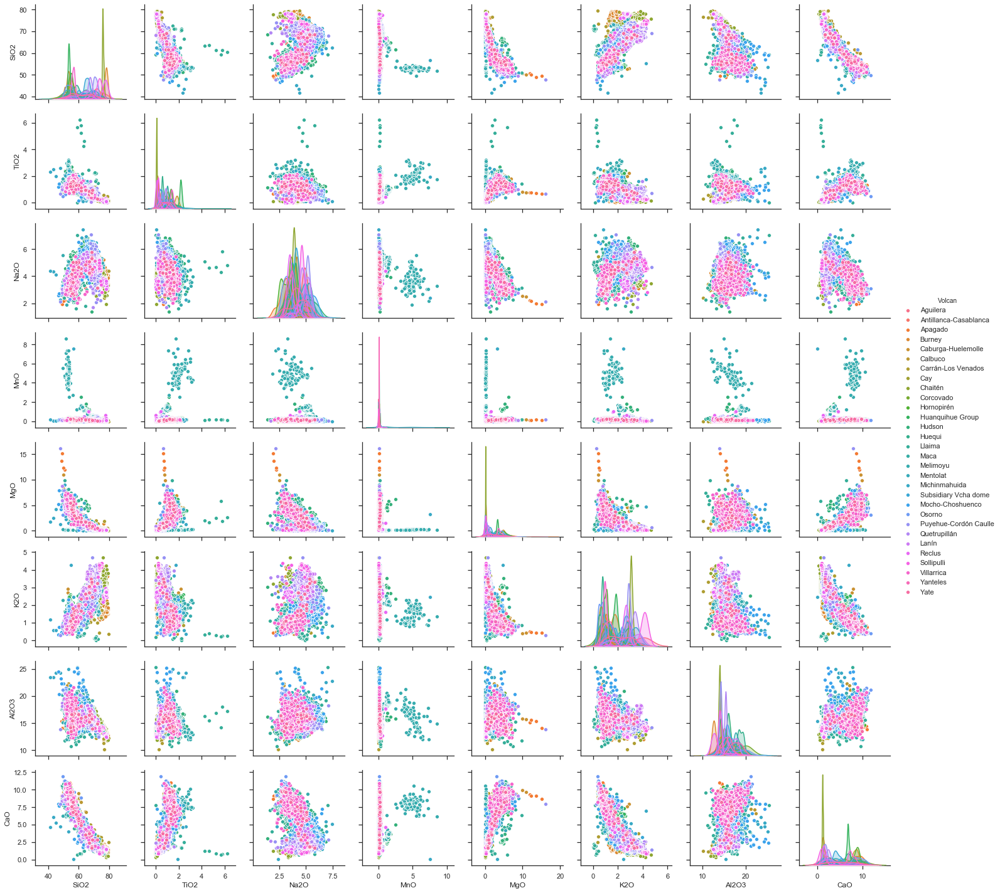

In [79]:
sns.set(style="ticks")
sns.pairplot(Data_mayores, hue="Volcan")

ValueError: `dataset` input should have multiple elements.

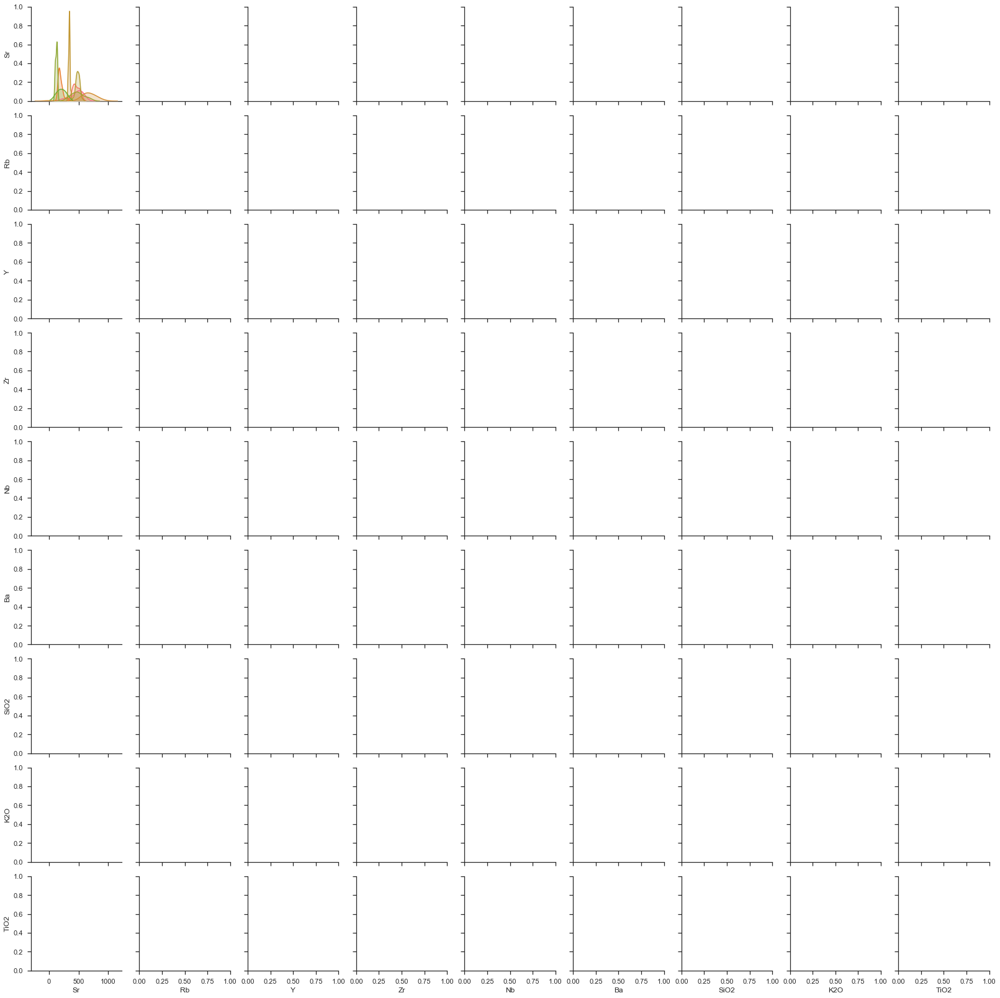

In [81]:
sns.set(style="ticks")
sns.pairplot(Data_mezcla, hue="Volcan")